## Assignment 3: Generative Model

# Part I - Generative Adversarial Networks (GANs)
So far in DS6050, all the applications of neural networks that we have explored have been **discriminative models** that take an input and are trained to produce a labeled output. This has ranged from straightforward classification of image categories to sentence generation (which was still phrased as a classification problem, our labels were in vocabulary space and we’d learned a recurrence to capture multi-word labels). In this notebook, we will expand our repetoire, and build **generative models** using neural networks. Specifically, we will learn how to build models which generate novel images that resemble a set of training images.

### What is a GAN?

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $x \sim p_\text{data}$ are samples from the input data, $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__.
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661).

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

### What else is there?
Since 2014, GANs have exploded into a huge research area, with massive [workshops](https://sites.google.com/site/nips2016adversarial/), and [hundreds of new papers](https://github.com/hindupuravinash/the-gan-zoo). Compared to other approaches for generative models, they often produce the highest quality samples but are some of the most difficult and finicky models to train (see [this github repo](https://github.com/soumith/ganhacks) that contains a set of 17 hacks that are useful for getting models working). Improving the stabiilty and robustness of GAN training is an open research question, with new papers coming out every day! For a more recent tutorial on GANs, see [here](https://arxiv.org/abs/1701.00160). There is also some even more recent exciting work that changes the objective function to Wasserstein distance and yields much more stable results across model architectures: [WGAN](https://arxiv.org/abs/1701.07875), [WGAN-GP](https://arxiv.org/abs/1704.00028).


GANs are not the only way to train a generative model! For other approaches to generative modeling check out the [deep generative model chapter](http://www.deeplearningbook.org/contents/generative_models.html) of the Deep Learning [book](http://www.deeplearningbook.org). Another popular way of training neural networks as generative models is Variational Autoencoders (co-discovered [here](https://arxiv.org/abs/1312.6114) and [here](https://arxiv.org/abs/1401.4082)). Variational autoencoders combine neural networks with variational inference to train deep generative models. These models tend to be far more stable and easier to train but currently don't produce samples that are as pretty as GANs.

Example pictures of what you should expect (yours might look slightly different):

![caption](https://github.com/dscer/DS6050_Assignment_3/blob/main/gan_outputs_tf.png?raw=1)


## Setup

In [ ]:
import tensorflow as tf
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def count_params(model):
    """Count the number of parameters in the current TensorFlow graph """
    param_count = np.sum([np.prod(p.shape) for p in model.weights])
    return param_count

answers = np.load('gan-checks-tf.npz')

NOISE_DIM = 96

## Dataset
 GANs are notoriously finicky with hyperparameters, and also require many training epochs. In order to make this assignment approachable without a GPU, we will be working on the MNIST dataset, which is 60,000 training and 10,000 test images. Each picture contains a centered image of white digit on black background (0 through 9). This was one of the first datasets used to train convolutional neural networks and it is fairly easy -- a standard CNN model can easily exceed 99% accuracy.


**Heads-up**: Our MNIST wrapper returns images as vectors. That is, they're size (batch, 784). If you want to treat them as images, we have to resize them to (batch,28,28) or (batch,28,28,1). They are also type np.float32 and bounded [0,1].

In [ ]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data

        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B))

11490434/11490434 [==============================] - 0s 0us/step


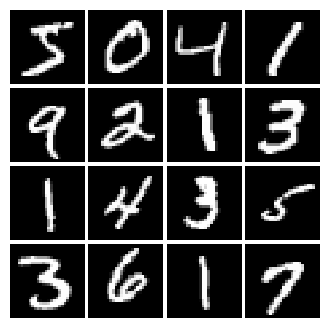

In [ ]:
# show a batch
mnist = MNIST(batch_size=16)
show_images(mnist.X[:16])

## LeakyReLU
In the cell below, you should implement a LeakyReLU. See equation (3) in [this paper](http://ai.stanford.edu/~amaas/papers/relu_hybrid_icml2013_final.pdf). LeakyReLUs keep ReLU units from dying and are often used in GAN methods (as are maxout units, however those increase model size and therefore are not used in this notebook).

HINT: You should be able to use `tf.maximum`

In [ ]:
def leaky_relu(x, alpha=0.01):
    """Compute the leaky ReLU activation function.

    Inputs:
    - x: TensorFlow Tensor with arbitrary shape
    - alpha: leak parameter for leaky ReLU

    Returns:
    TensorFlow Tensor with the same shape as x
    """
    # TODO: implement leaky ReLU
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return tf.maximum(alpha * x, x)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Test your leaky ReLU implementation. You should get errors < 1e-10

In [ ]:
def test_leaky_relu(x, y_true):
    y = leaky_relu(tf.constant(x))
    print('Maximum error: %g'%rel_error(y_true, y))

test_leaky_relu(answers['lrelu_x'], answers['lrelu_y'])

Maximum error: 0


## Random Noise
Generate a TensorFlow `Tensor` containing uniform noise from -1 to 1 with shape `[batch_size, dim]`.

In [ ]:
def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.

    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the noise to generate

    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    # TODO: sample and return noise
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return tf.random.uniform(shape=(batch_size, dim), minval=-1, maxval=1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Make sure noise is the correct shape and type:

In [ ]:
def test_sample_noise():
    batch_size = 3
    dim = 4
    z = sample_noise(batch_size, dim)
    # Check z has the correct shape
    assert z.get_shape().as_list() == [batch_size, dim]
    # Make sure z is a Tensor and not a numpy array
    assert isinstance(z, tf.Tensor)
    # Check that we get different noise for different evaluations
    z1 = sample_noise(batch_size, dim)
    z2 = sample_noise(batch_size, dim)
    assert not np.array_equal(z1, z2)
    # Check that we get the correct range
    assert np.all(z1 >= -1.0) and np.all(z1 <= 1.0)
    print("All tests passed!")

test_sample_noise()

All tests passed!


## Discriminator
Our first step is to build a discriminator. **Hint:** You should use the layers in `tf.keras.layers` to build the model.
All fully connected layers should include bias terms. For initialization, just use the default initializer used by the `tf.keras.layers` functions.

Architecture:
 * Fully connected layer with input size 784 and output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 1

The output of the discriminator should thus have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [ ]:
def discriminator():
    """Compute discriminator score for a batch of input images.

    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]

    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        # Fully connected layer with input size 784 and output size 256
        tf.keras.layers.Dense(256, input_shape=(784,)),

        # LeakyReLU with alpha 0.01
        tf.keras.layers.LeakyReLU(0.01),

        # Fully connected layer with output size 256
        tf.keras.layers.Dense(256),

        # LeakyReLU with alpha 0.01
        tf.keras.layers.LeakyReLU(0.01),

        # Fully connected layer with output size 1
        tf.keras.layers.Dense(1)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the discriminator is correct:

In [ ]:
def test_discriminator(true_count=267009):
    model = discriminator()
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in discriminator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in discriminator.')

test_discriminator()

Correct number of parameters in discriminator.


## Generator
Now to build a generator. You should use the layers in `tf.keras.layers` to construct the model. All fully connected layers should include bias terms. Note that you can use the tf.nn module to access activation functions. Once again, use the default initializers for parameters.

Architecture:
 * Fully connected layer with input size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
 * `ReLU`
 * Fully connected layer with output size 1024
 * `ReLU`
 * Fully connected layer with output size 784
 * `TanH` (To restrict every element of the output to be in the range [-1,1])

In [ ]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.

    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]

    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        # Fully connected layer with input size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
        tf.keras.layers.Dense(1024, input_shape=(noise_dim,)),

        # ReLU
        tf.keras.layers.ReLU(),

        # Fully connected layer with output size 1024
        tf.keras.layers.Dense(1024),

        # ReLU
        tf.keras.layers.ReLU(),

        # Fully connected layer with output size 784
        tf.keras.layers.Dense(784),

        # TanH (To restrict every element of the output to be in the range [-1,1])
        tf.keras.layers.Activation('tanh')

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the generator is correct:

In [ ]:
def test_generator(true_count=1858320):
    model = generator(4)
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in generator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in generator.')

test_generator()

Correct number of parameters in generator.


# GAN Loss

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: Use [tf.ones](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/ones) and [tf.zeros](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/zeros) to generate labels for your discriminator. Use [tf.keras.losses.BinaryCrossentropy](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses/BinaryCrossentropy) to help compute your loss function.

In [ ]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss described above.

    Inputs:
    - logits_real: Tensor of shape (N, 1) giving scores for the real data.
    - logits_fake: Tensor of shape (N, 1) giving scores for the fake data.

    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    real_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True)(tf.ones_like(logits_real), logits_real)
    fake_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True)(tf.zeros_like(logits_fake), logits_fake)
    loss = real_loss + fake_loss

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss described above.

    Inputs:
    - logits_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.

    Returns:
    - loss: PyTorch Tensor containing the (scalar) loss for the generator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = tf.keras.losses.BinaryCrossentropy(from_logits=True)(tf.ones_like(logits_fake), logits_fake)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your GAN loss. Make sure both the generator and discriminator loss are correct. You should see errors less than 1e-8.

In [ ]:
def test_discriminator_loss(logits_real, logits_fake, d_loss_true):
    d_loss = discriminator_loss(tf.constant(logits_real),
                                tf.constant(logits_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))

test_discriminator_loss(answers['logits_real'], answers['logits_fake'],
                        answers['d_loss_true'])

Maximum error in d_loss: 6.02597e-17


In [ ]:
def test_generator_loss(logits_fake, g_loss_true):
    g_loss = generator_loss(tf.constant(logits_fake))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_generator_loss(answers['logits_fake'], answers['g_loss_true'])

Maximum error in g_loss: 7.19722e-17


# Optimizing our loss
Make an `Adam` optimizer with a 1e-3 learning rate, beta1=0.5 to mininize G_loss and D_loss separately. The trick of decreasing beta was shown to be effective in helping GANs converge in the [Improved Techniques for Training GANs](https://arxiv.org/abs/1606.03498) paper. In fact, with our current hyperparameters, if you set beta1 to the Tensorflow default of 0.9, there's a good chance your discriminator loss will go to zero and the generator will fail to learn entirely. In fact, this is a common failure mode in GANs; if your D(x) learns too fast (e.g. loss goes near zero), your G(z) is never able to learn. Often D(x) is trained with SGD with Momentum or RMSProp instead of Adam, but here we'll use Adam for both D(x) and G(z).

In [ ]:
# TODO: create an AdamOptimizer for D_optimizer and G_optimizer
def get_optimizers(learning_rate=1e-3, beta1=0.5):
    """Create optimizer for GAN training.

    Inputs:
    - learning_rate: learning rate to use for both optimizer
    - beta1: beta1 parameter for both optimizer (first moment decay)

    Returns:
    - D_optimizer: instance of tf.optimizers.Adam with correct learning_rate and beta1
    - G_optimizer: instance of tf.optimizers.Adam with correct learning_rate and beta1
    """
    D_optimizer = None
    G_optimizer = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    D_optimizer = tf.optimizers.Adam(learning_rate=learning_rate, beta_1=beta1)
    G_optimizer = tf.optimizers.Adam(learning_rate=learning_rate, beta_1=beta1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return D_optimizer, G_optimizer

# Training a GAN!
Well that wasn't so hard, was it? After the first epoch, you should see fuzzy outlines, clear shapes as you approach epoch 3, and decent shapes, about half of which will be sharp and clearly recognizable as we pass epoch 5. In our case, we'll simply train D(x) and G(z) with one batch each every iteration. However, papers often experiment with different schedules of training D(x) and G(z), sometimes doing one for more steps than the other, or even training each one until the loss gets "good enough" and then switching to training the other.

In [ ]:
# a giant helper function
def run_a_gan(D, G, D_optimizer, G_optimizer, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=96):
    """Train a GAN for a certain number of epochs.

    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_optimizer: an Optimizer for Discriminator
    - G_optimizer: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)

    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                logits_real = D(preprocess_img(real_data))

                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)
                logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))

                d_total_error = discriminator_loss(logits_real, logits_fake)
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)
                D_optimizer.apply_gradients(zip(d_gradients, D.trainable_variables))

            with tf.GradientTape() as tape:
                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)

                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = generator_loss(gen_logits_fake)
                g_gradients = tape.gradient(g_error, G.trainable_variables)
                G_optimizer.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1

    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

#### Train your GAN! This should take about 10 minutes on a CPU, or about 2 minutes on GPU.

Instructions for updating:
Use tf.identity with explicit device placement instead.


Epoch: 0, Iter: 0, D: 2.026, G:0.7915


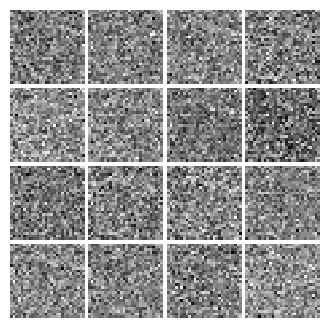

Epoch: 0, Iter: 20, D: 0.6586, G:0.894


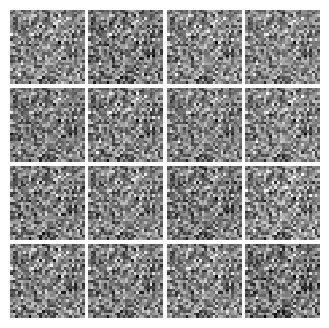

Epoch: 0, Iter: 40, D: 0.6458, G:1.136


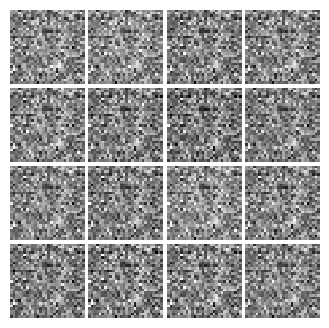

Epoch: 0, Iter: 60, D: 1.124, G:1.305


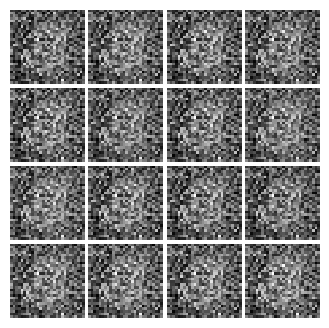

Epoch: 0, Iter: 80, D: 1.56, G:1.013


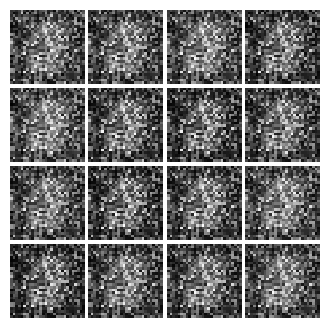

Epoch: 0, Iter: 100, D: 1.807, G:0.5122


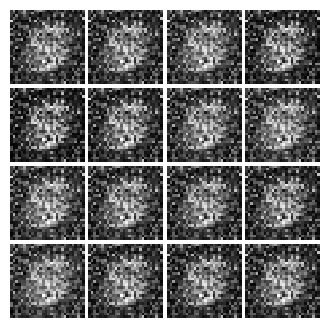

Epoch: 0, Iter: 120, D: 1.079, G:1.204


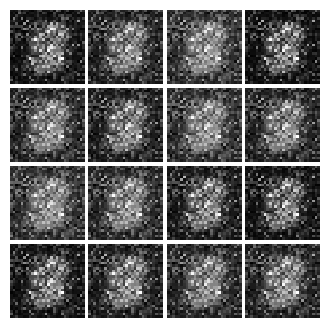

Epoch: 0, Iter: 140, D: 1.326, G:1.406


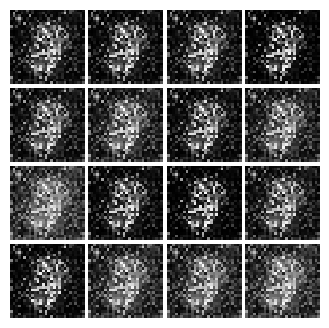

Epoch: 0, Iter: 160, D: 1.764, G:0.9702


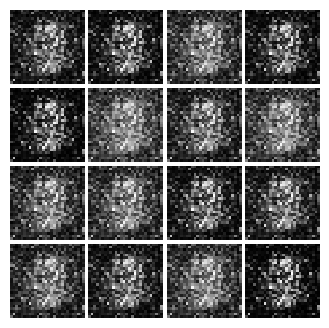

Epoch: 0, Iter: 180, D: 1.422, G:1.224


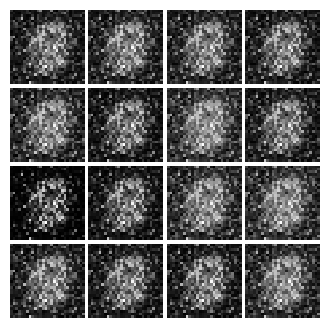

Epoch: 0, Iter: 200, D: 1.241, G:0.6828


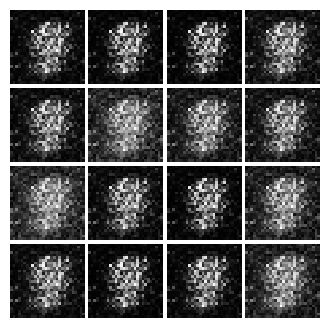

Epoch: 0, Iter: 220, D: 0.9494, G:1.309


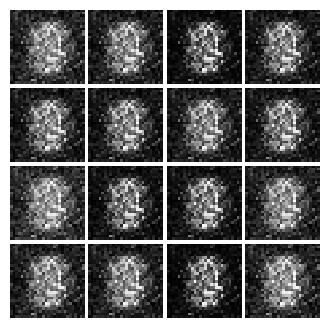

Epoch: 0, Iter: 240, D: 0.4653, G:2.091


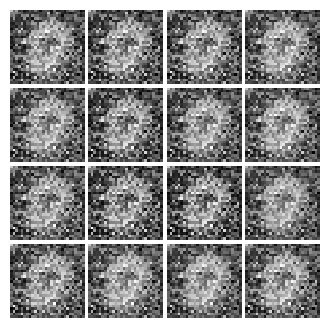

Epoch: 0, Iter: 260, D: 1.212, G:1.757


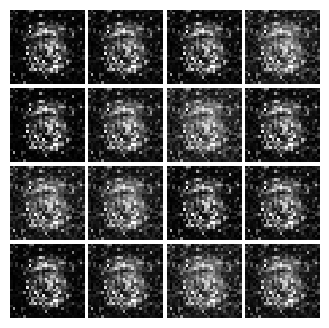

Epoch: 0, Iter: 280, D: 1.007, G:1.171


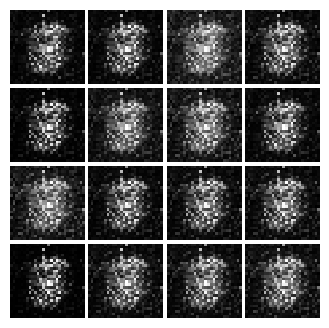

Epoch: 0, Iter: 300, D: 1.516, G:1.192


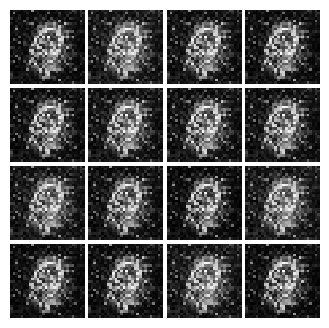

Epoch: 0, Iter: 320, D: 0.9435, G:1.528


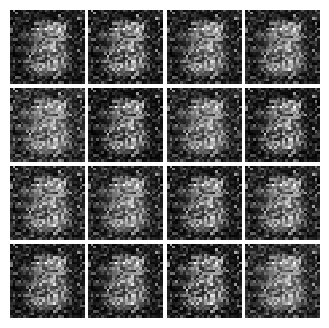

Epoch: 0, Iter: 340, D: 0.8334, G:1.77


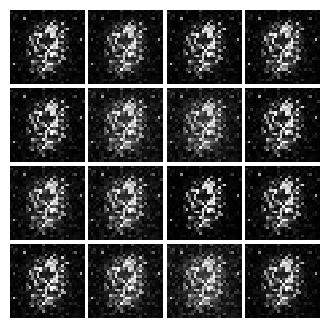

Epoch: 0, Iter: 360, D: 1.681, G:2.547


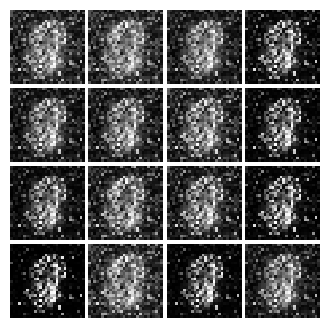

Epoch: 0, Iter: 380, D: 1.142, G:0.8464


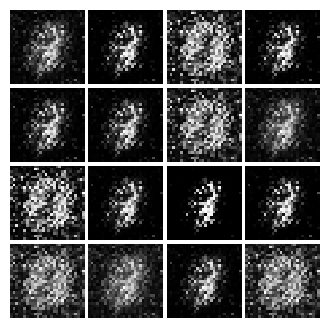

Epoch: 0, Iter: 400, D: 0.9663, G:1.235


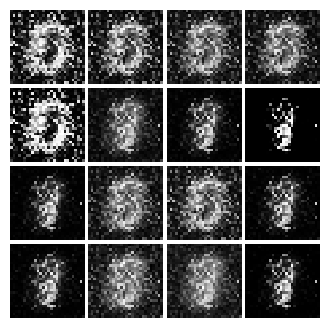

Epoch: 0, Iter: 420, D: 1.024, G:1.391


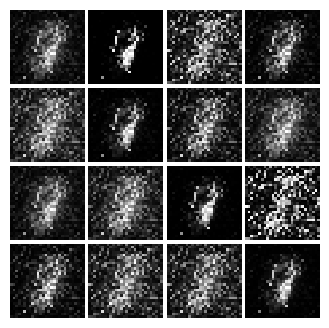

Epoch: 0, Iter: 440, D: 1.007, G:1.117


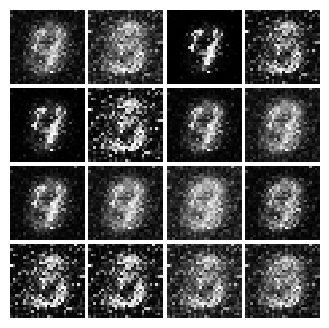

Epoch: 0, Iter: 460, D: 1.209, G:2.716


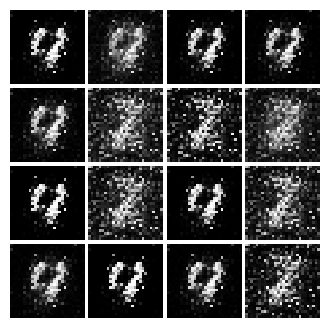

Epoch: 1, Iter: 480, D: 1.328, G:1.491


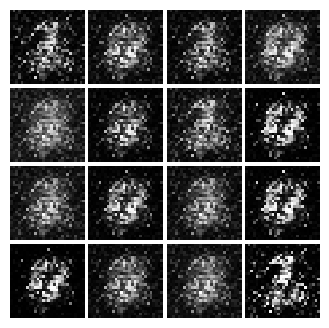

Epoch: 1, Iter: 500, D: 1.03, G:1.244


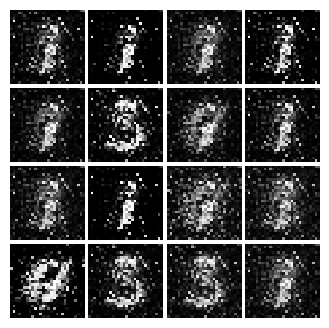

Epoch: 1, Iter: 520, D: 1.064, G:1.522


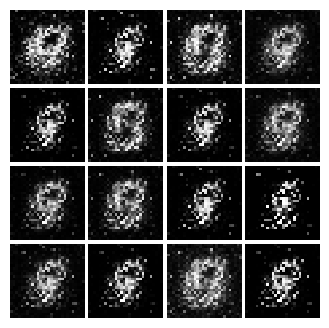

Epoch: 1, Iter: 540, D: 1.095, G:1.108


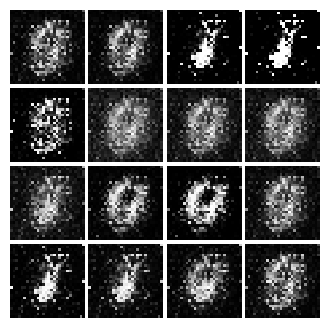

Epoch: 1, Iter: 560, D: 0.9877, G:0.5978


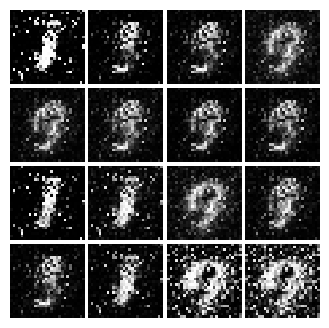

Epoch: 1, Iter: 580, D: 1.029, G:1.356


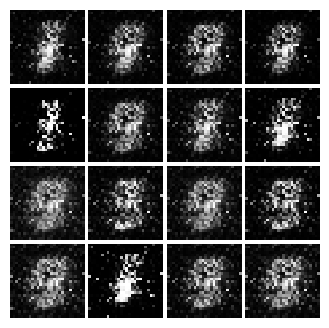

Epoch: 1, Iter: 600, D: 1.26, G:1.576


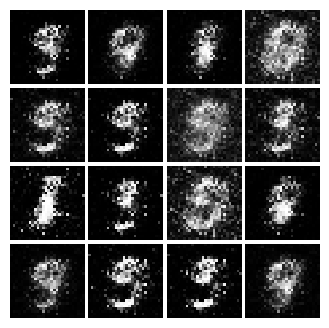

Epoch: 1, Iter: 620, D: 1.163, G:1.171


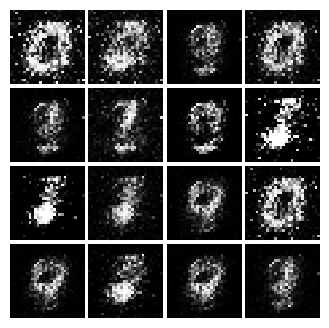

Epoch: 1, Iter: 640, D: 1.069, G:1.239


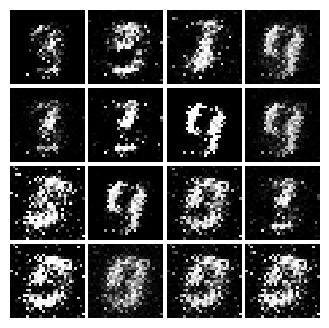

Epoch: 1, Iter: 660, D: 1.511, G:1.015


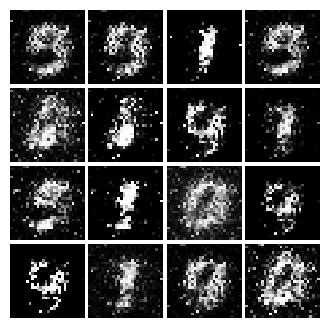

Epoch: 1, Iter: 680, D: 1.107, G:0.383


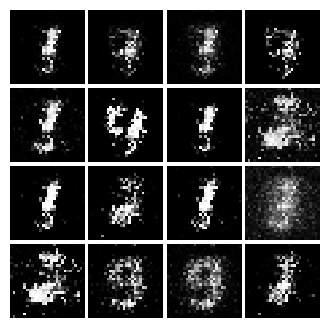

Epoch: 1, Iter: 700, D: 1.206, G:1.176


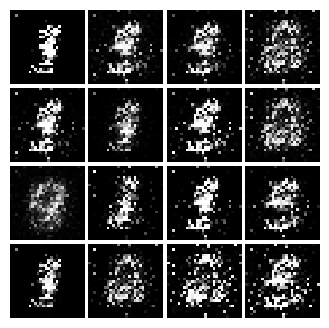

Epoch: 1, Iter: 720, D: 1.165, G:1.475


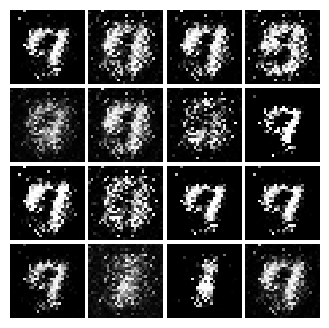

Epoch: 1, Iter: 740, D: 1.062, G:1.028


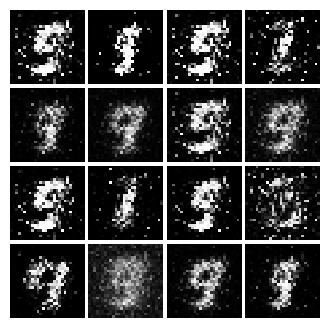

Epoch: 1, Iter: 760, D: 1.038, G:1.169


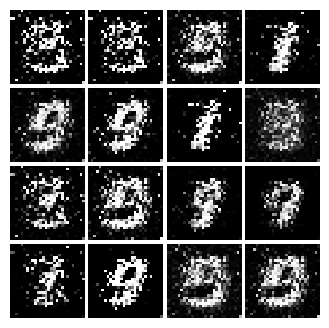

Epoch: 1, Iter: 780, D: 1.313, G:4.098


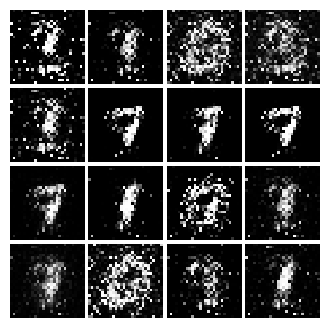

Epoch: 1, Iter: 800, D: 1.151, G:1.03


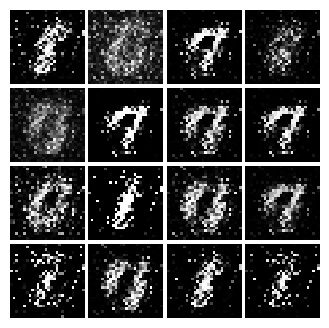

Epoch: 1, Iter: 820, D: 1.421, G:0.9456


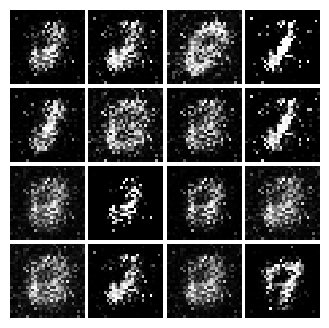

Epoch: 1, Iter: 840, D: 1.213, G:0.9619


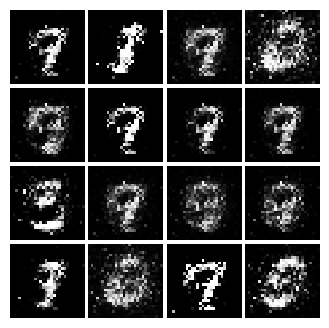

Epoch: 1, Iter: 860, D: 1.243, G:1.601


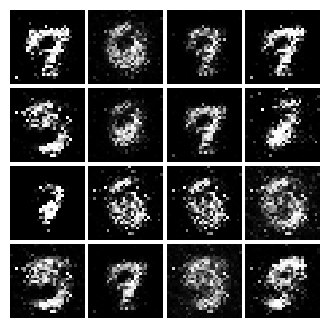

Epoch: 1, Iter: 880, D: 1.046, G:1.221


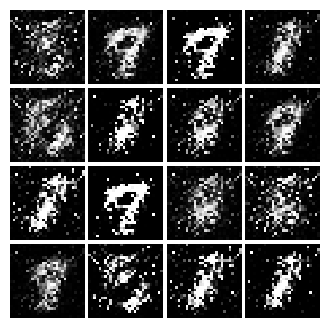

Epoch: 1, Iter: 900, D: 1.251, G:1.11


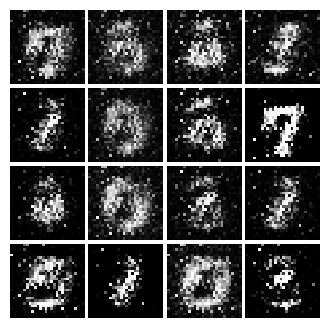

Epoch: 1, Iter: 920, D: 1.401, G:1.349


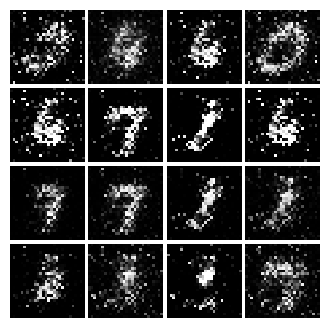

Epoch: 2, Iter: 940, D: 1.204, G:0.8945


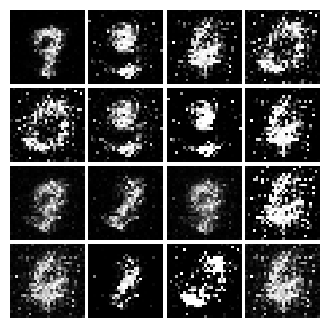

Epoch: 2, Iter: 960, D: 1.278, G:1.34


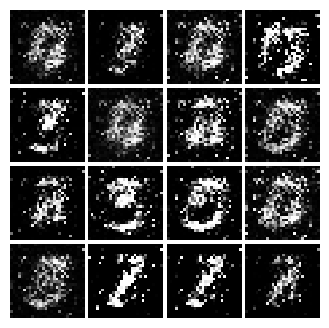

Epoch: 2, Iter: 980, D: 1.25, G:1.032


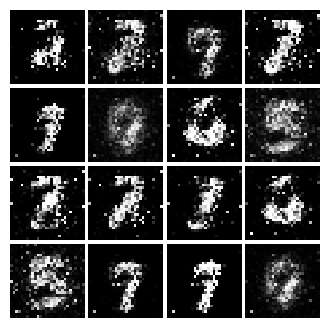

Epoch: 2, Iter: 1000, D: 0.9975, G:1.361


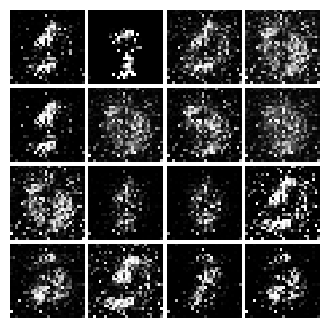

Epoch: 2, Iter: 1020, D: 1.269, G:1.037


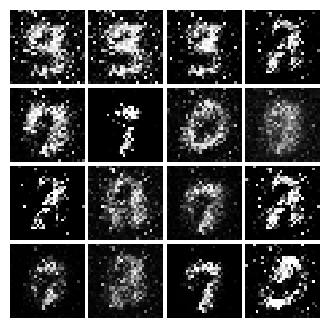

Epoch: 2, Iter: 1040, D: 1.131, G:1.635


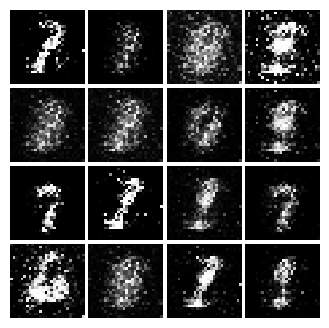

Epoch: 2, Iter: 1060, D: 1.213, G:1.22


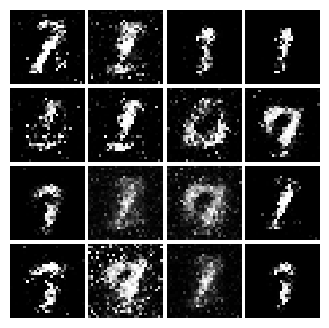

Epoch: 2, Iter: 1080, D: 1.278, G:0.8758


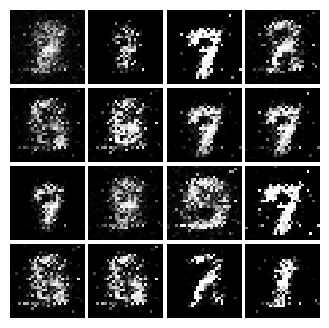

Epoch: 2, Iter: 1100, D: 1.268, G:0.9478


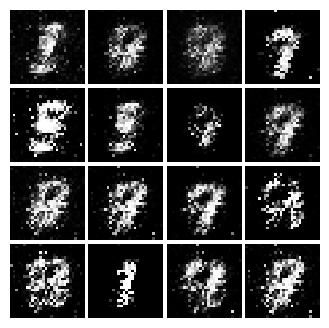

Epoch: 2, Iter: 1120, D: 1.327, G:0.8734


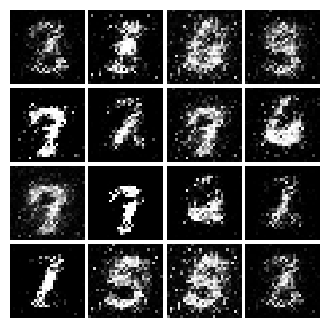

Epoch: 2, Iter: 1140, D: 1.401, G:1.118


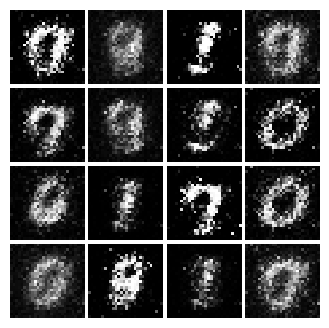

Epoch: 2, Iter: 1160, D: 1.237, G:0.9455


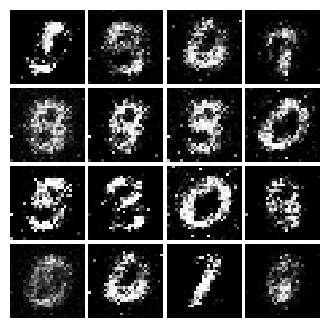

Epoch: 2, Iter: 1180, D: 1.727, G:2.132


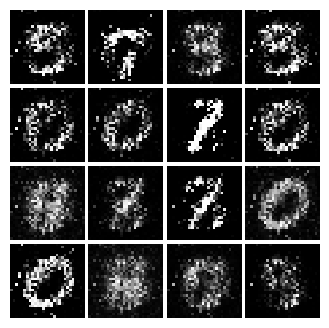

Epoch: 2, Iter: 1200, D: 1.342, G:0.8971


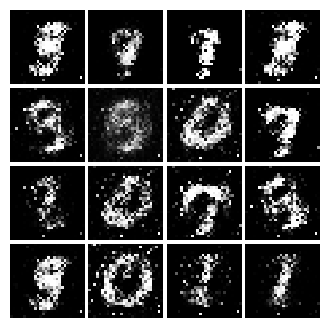

Epoch: 2, Iter: 1220, D: 1.314, G:1.057


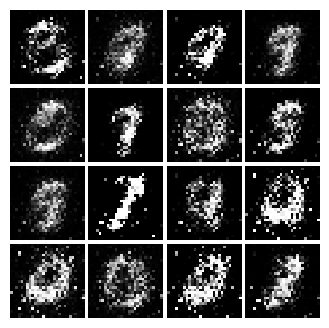

Epoch: 2, Iter: 1240, D: 1.579, G:1.283


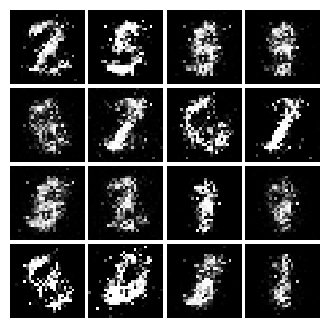

Epoch: 2, Iter: 1260, D: 1.531, G:0.7118


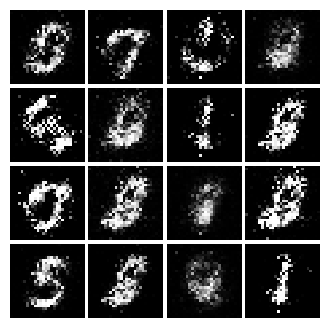

Epoch: 2, Iter: 1280, D: 1.252, G:0.9959


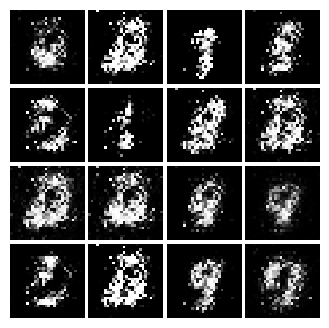

Epoch: 2, Iter: 1300, D: 1.189, G:0.8934


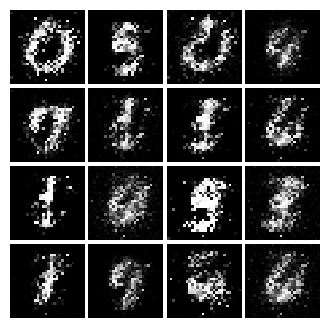

Epoch: 2, Iter: 1320, D: 1.318, G:0.8309


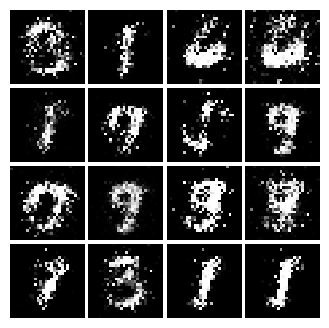

Epoch: 2, Iter: 1340, D: 1.353, G:0.8449


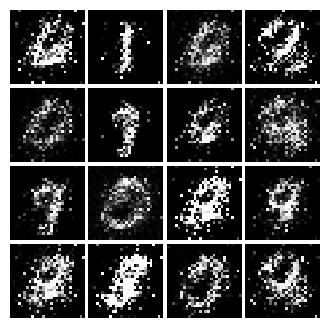

Epoch: 2, Iter: 1360, D: 1.494, G:1.199


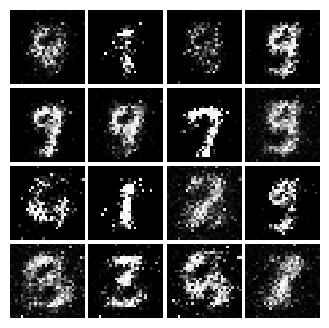

Epoch: 2, Iter: 1380, D: 1.402, G:1.023


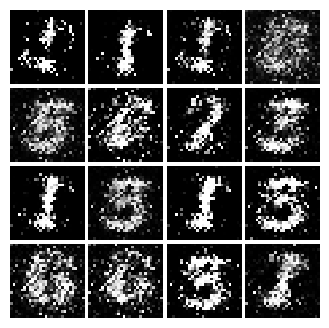

Epoch: 2, Iter: 1400, D: 1.615, G:0.7744


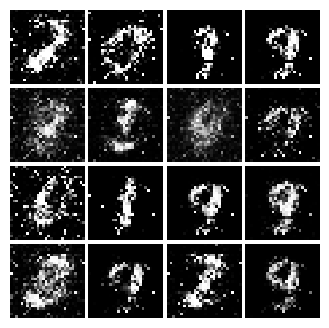

Epoch: 3, Iter: 1420, D: 1.266, G:0.9659


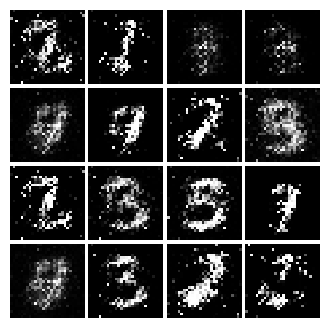

Epoch: 3, Iter: 1440, D: 1.319, G:0.8412


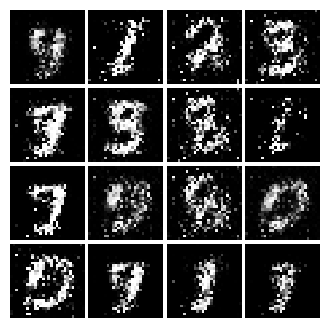

Epoch: 3, Iter: 1460, D: 1.224, G:1.007


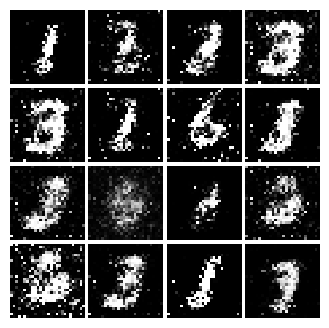

Epoch: 3, Iter: 1480, D: 1.327, G:0.9122


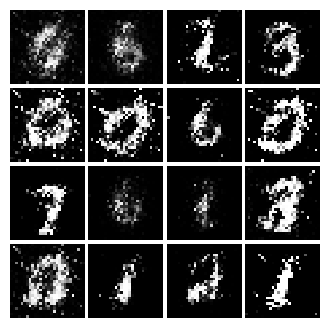

Epoch: 3, Iter: 1500, D: 1.308, G:0.827


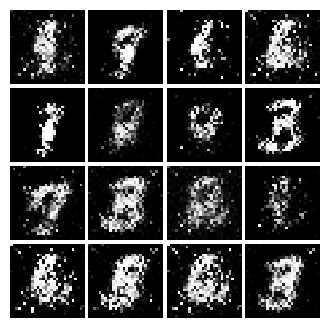

Epoch: 3, Iter: 1520, D: 1.321, G:0.8903


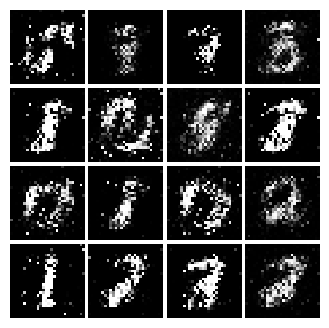

Epoch: 3, Iter: 1540, D: 1.19, G:0.9742


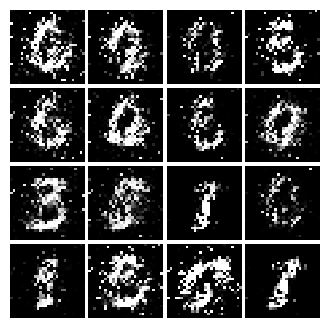

Epoch: 3, Iter: 1560, D: 1.2, G:0.9248


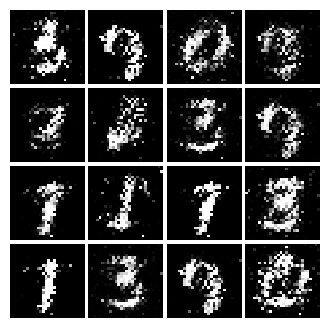

Epoch: 3, Iter: 1580, D: 1.25, G:0.9085


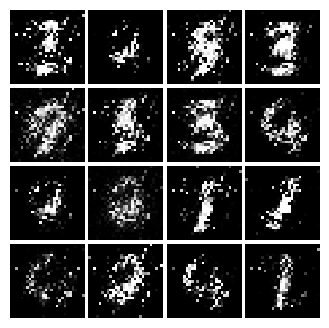

Epoch: 3, Iter: 1600, D: 1.277, G:0.8767


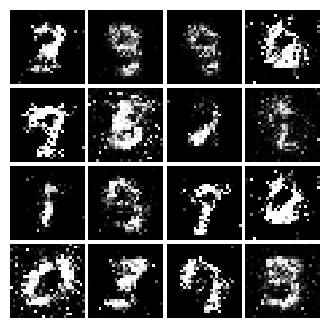

Epoch: 3, Iter: 1620, D: 1.235, G:1.873


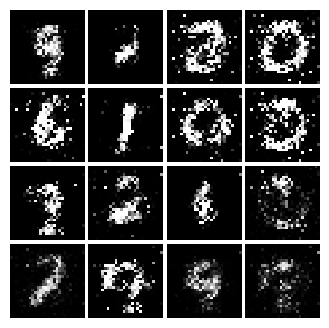

Epoch: 3, Iter: 1640, D: 1.296, G:0.9536


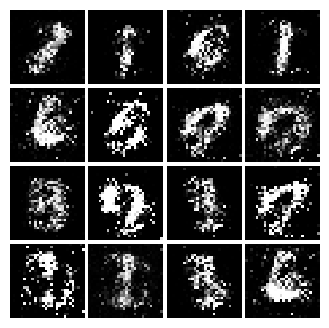

Epoch: 3, Iter: 1660, D: 1.236, G:1.118


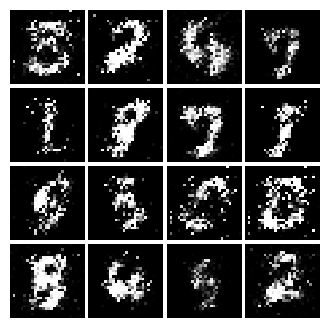

Epoch: 3, Iter: 1680, D: 1.206, G:1.009


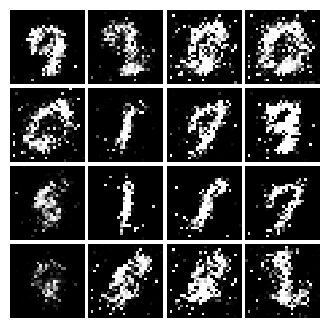

Epoch: 3, Iter: 1700, D: 1.347, G:0.896


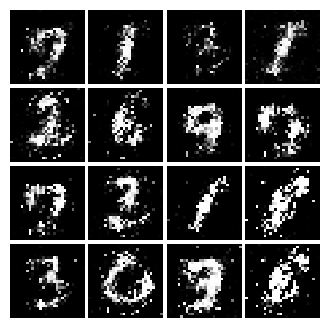

Epoch: 3, Iter: 1720, D: 1.305, G:0.8135


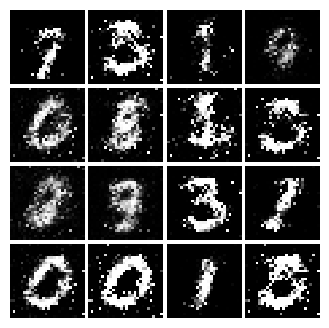

Epoch: 3, Iter: 1740, D: 1.257, G:1.029


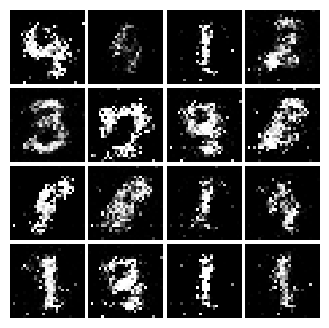

Epoch: 3, Iter: 1760, D: 1.09, G:1.254


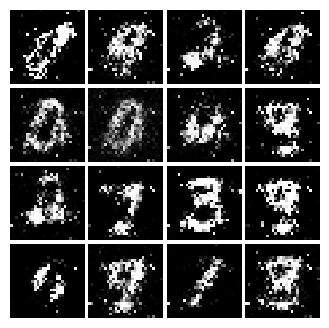

Epoch: 3, Iter: 1780, D: 1.315, G:0.836


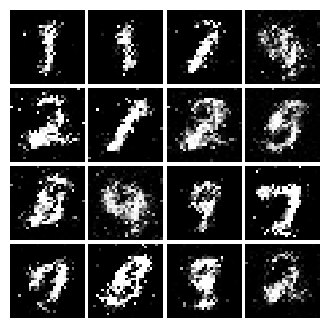

Epoch: 3, Iter: 1800, D: 1.618, G:0.8836


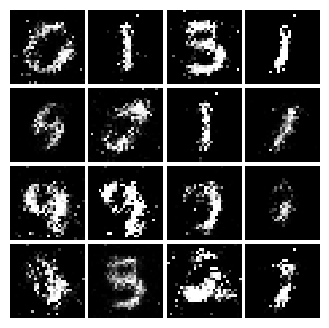

Epoch: 3, Iter: 1820, D: 1.178, G:0.9798


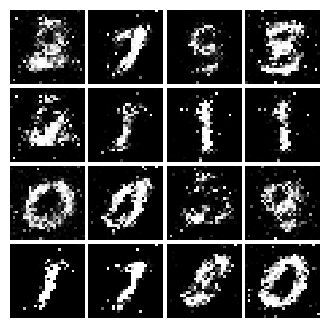

Epoch: 3, Iter: 1840, D: 1.305, G:0.8859


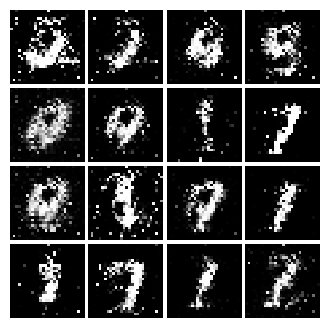

Epoch: 3, Iter: 1860, D: 1.335, G:0.815


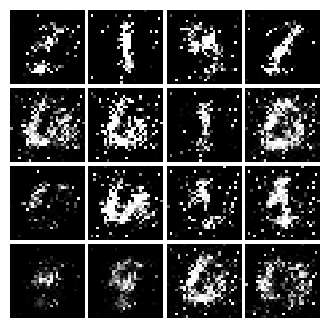

Epoch: 4, Iter: 1880, D: 1.085, G:1.155


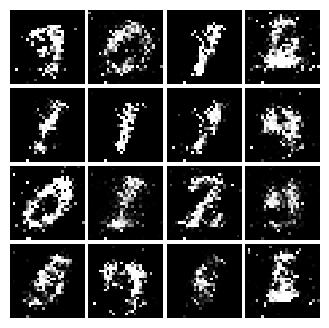

Epoch: 4, Iter: 1900, D: 1.332, G:0.8462


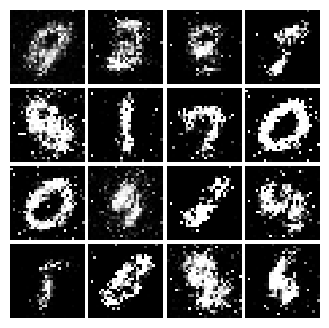

Epoch: 4, Iter: 1920, D: 1.218, G:0.7934


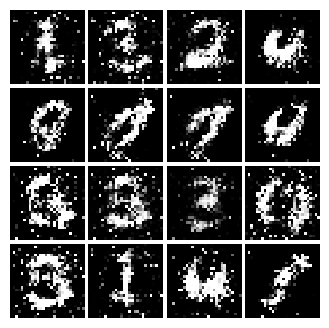

Epoch: 4, Iter: 1940, D: 1.158, G:1.683


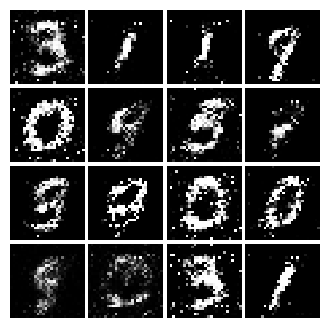

Epoch: 4, Iter: 1960, D: 1.236, G:0.9111


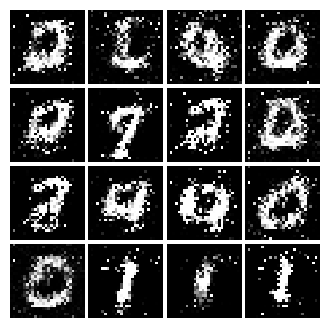

Epoch: 4, Iter: 1980, D: 1.213, G:0.9592


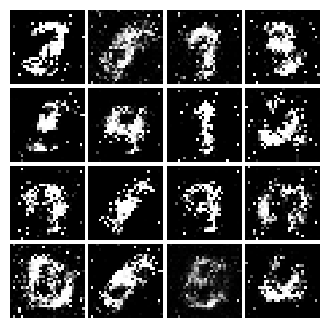

Epoch: 4, Iter: 2000, D: 1.116, G:0.899


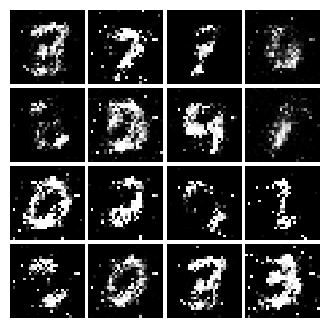

Epoch: 4, Iter: 2020, D: 1.376, G:0.9966


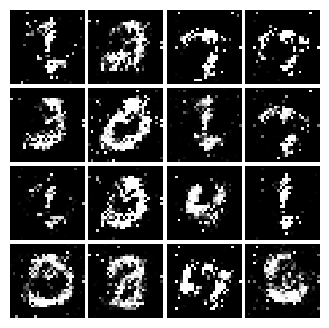

Epoch: 4, Iter: 2040, D: 1.341, G:0.788


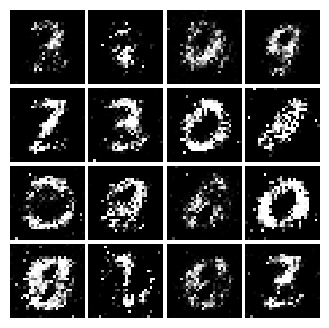

Epoch: 4, Iter: 2060, D: 1.323, G:0.9792


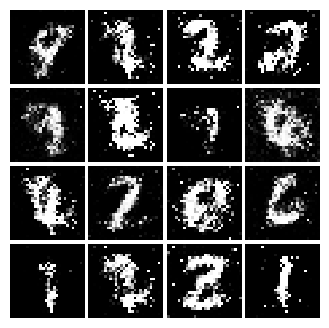

Epoch: 4, Iter: 2080, D: 1.158, G:0.8295


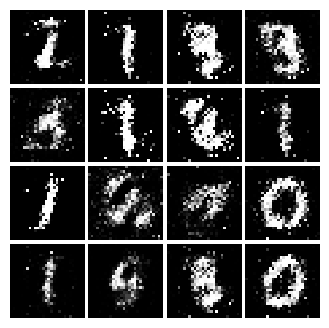

Epoch: 4, Iter: 2100, D: 1.304, G:1.158


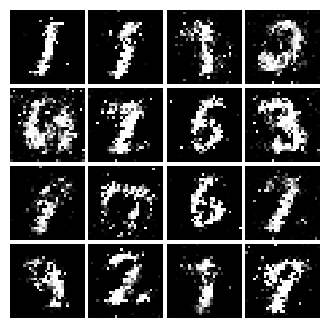

Epoch: 4, Iter: 2120, D: 1.458, G:0.829


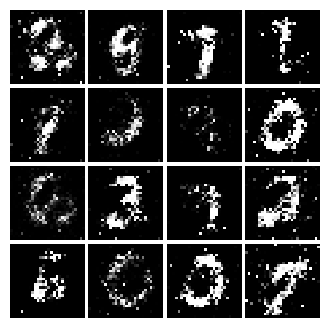

Epoch: 4, Iter: 2140, D: 1.358, G:0.8083


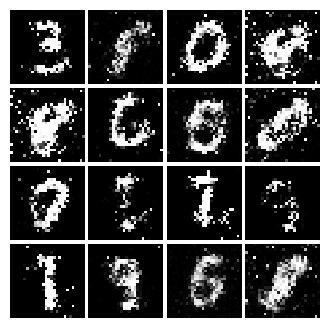

Epoch: 4, Iter: 2160, D: 1.314, G:0.8415


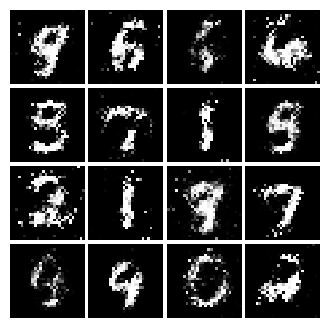

Epoch: 4, Iter: 2180, D: 1.318, G:1.08


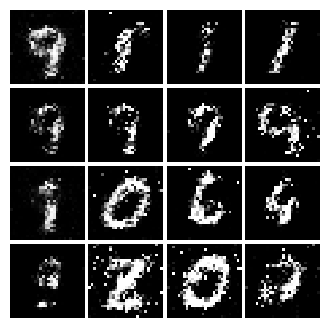

Epoch: 4, Iter: 2200, D: 1.297, G:0.794


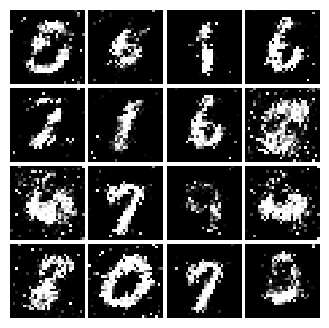

Epoch: 4, Iter: 2220, D: 1.374, G:0.839


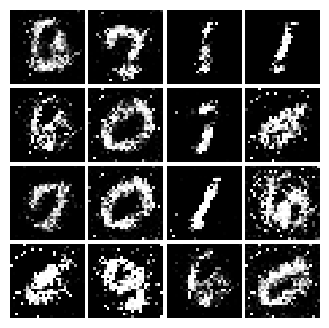

Epoch: 4, Iter: 2240, D: 1.396, G:0.7909


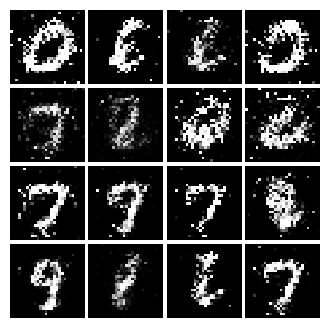

Epoch: 4, Iter: 2260, D: 1.28, G:0.9481


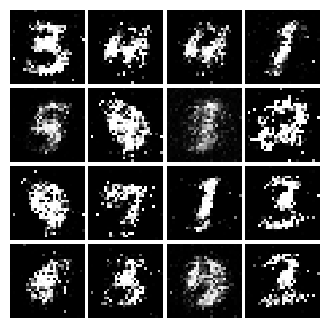

Epoch: 4, Iter: 2280, D: 1.21, G:0.8211


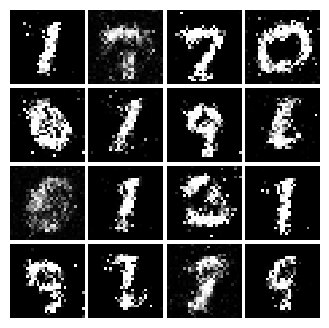

Epoch: 4, Iter: 2300, D: 1.375, G:0.7627


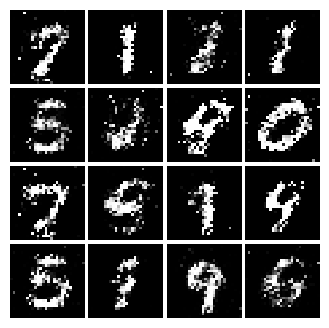

Epoch: 4, Iter: 2320, D: 1.234, G:0.8634


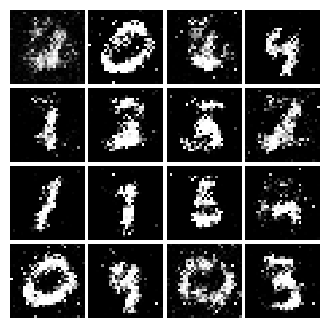

Epoch: 4, Iter: 2340, D: 1.203, G:1.054


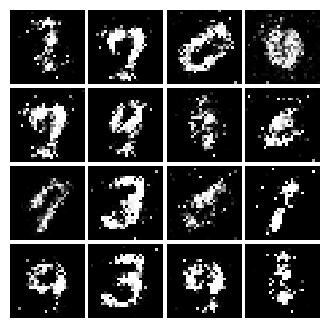

Epoch: 5, Iter: 2360, D: 1.351, G:0.8068


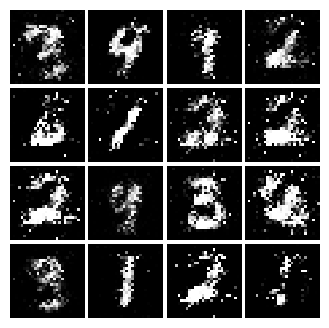

Epoch: 5, Iter: 2380, D: 1.323, G:0.7704


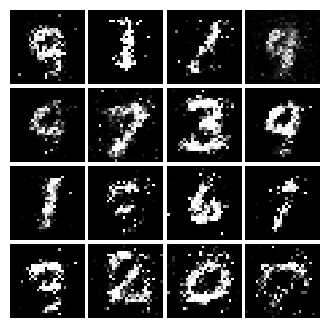

Epoch: 5, Iter: 2400, D: 1.34, G:0.829


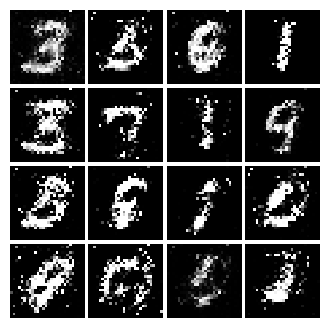

Epoch: 5, Iter: 2420, D: 1.337, G:0.7385


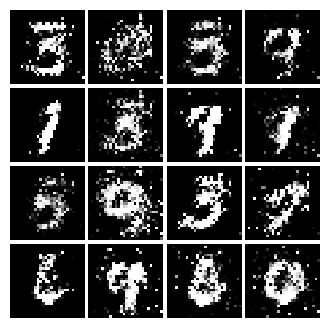

Epoch: 5, Iter: 2440, D: 1.334, G:0.7853


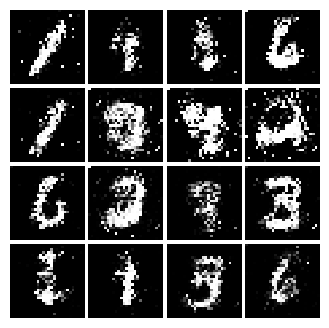

Epoch: 5, Iter: 2460, D: 1.305, G:0.7908


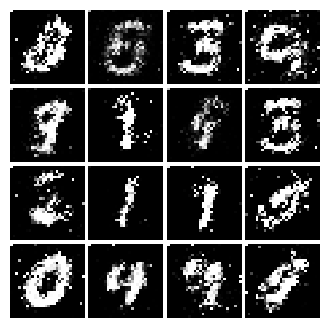

Epoch: 5, Iter: 2480, D: 1.316, G:0.9925


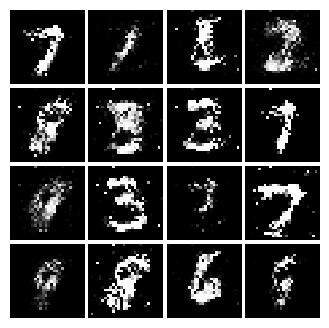

Epoch: 5, Iter: 2500, D: 1.227, G:0.8209


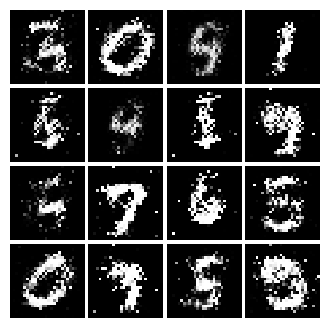

Epoch: 5, Iter: 2520, D: 1.332, G:0.7721


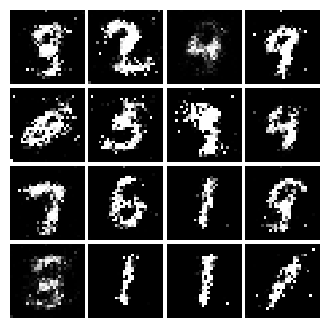

Epoch: 5, Iter: 2540, D: 1.368, G:0.7317


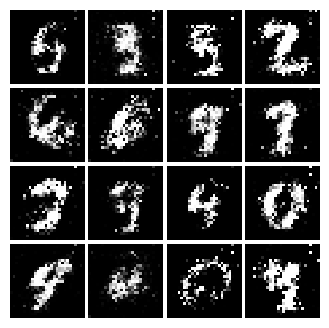

Epoch: 5, Iter: 2560, D: 1.351, G:0.8855


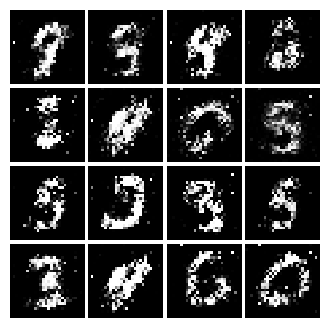

Epoch: 5, Iter: 2580, D: 1.269, G:0.9127


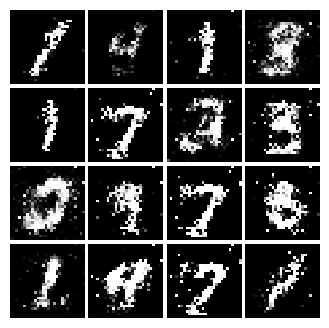

Epoch: 5, Iter: 2600, D: 1.449, G:0.6345


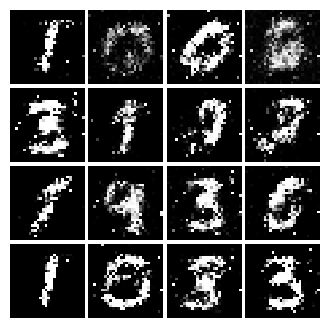

Epoch: 5, Iter: 2620, D: 1.32, G:0.8298


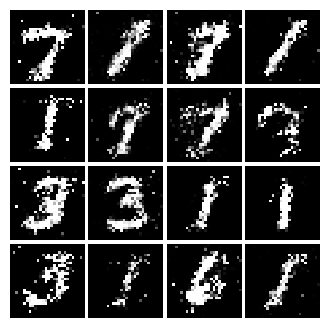

Epoch: 5, Iter: 2640, D: 1.278, G:0.9511


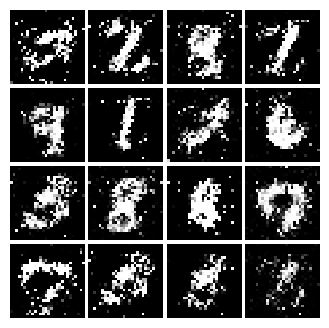

Epoch: 5, Iter: 2660, D: 1.244, G:0.926


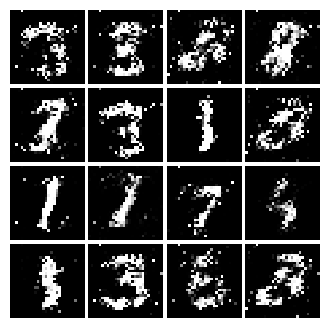

Epoch: 5, Iter: 2680, D: 1.349, G:0.8938


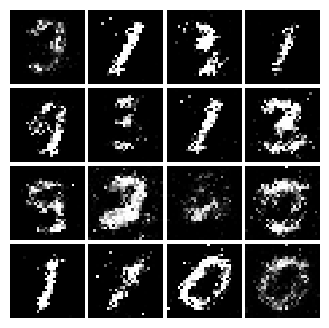

Epoch: 5, Iter: 2700, D: 1.302, G:0.8804


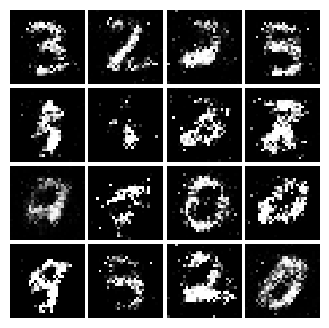

Epoch: 5, Iter: 2720, D: 1.275, G:0.8315


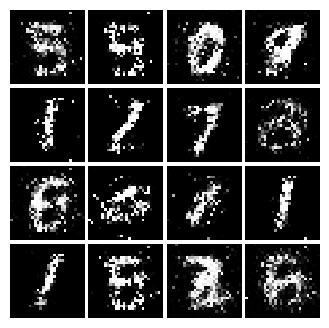

Epoch: 5, Iter: 2740, D: 1.385, G:0.7752


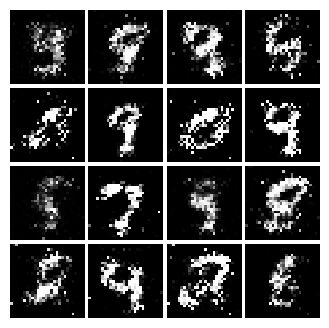

Epoch: 5, Iter: 2760, D: 1.314, G:0.7558


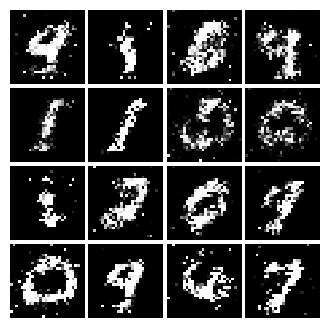

Epoch: 5, Iter: 2780, D: 1.387, G:0.8663


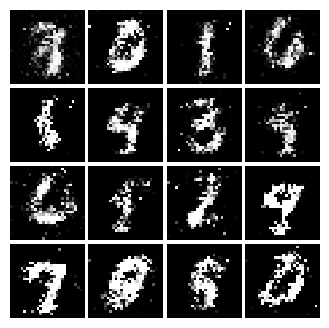

Epoch: 5, Iter: 2800, D: 1.308, G:0.8005


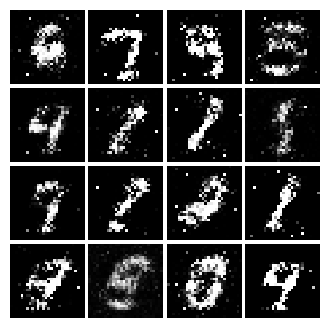

Epoch: 6, Iter: 2820, D: 1.302, G:0.7754


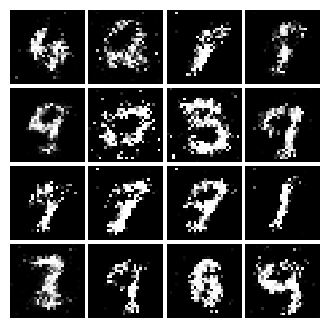

Epoch: 6, Iter: 2840, D: 1.318, G:0.8318


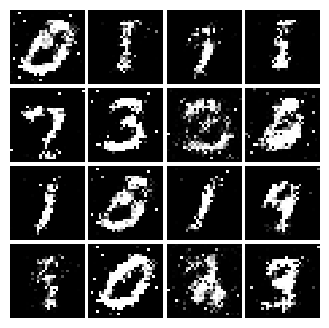

Epoch: 6, Iter: 2860, D: 1.292, G:0.9195


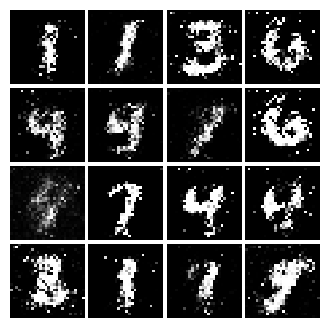

Epoch: 6, Iter: 2880, D: 1.238, G:0.951


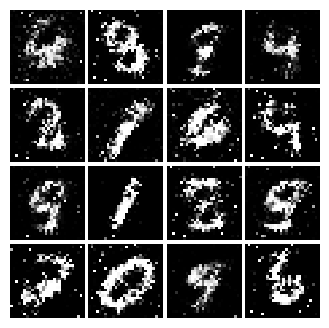

Epoch: 6, Iter: 2900, D: 1.24, G:0.8427


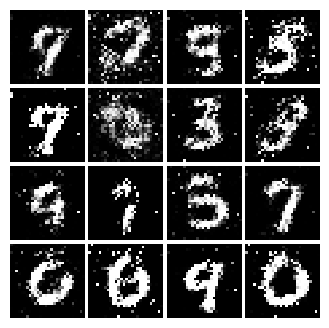

Epoch: 6, Iter: 2920, D: 1.375, G:0.7593


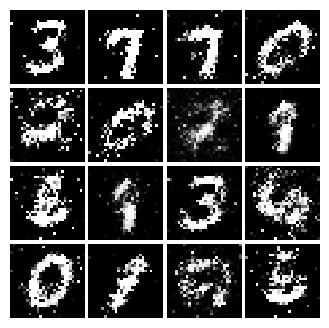

Epoch: 6, Iter: 2940, D: 1.36, G:0.8641


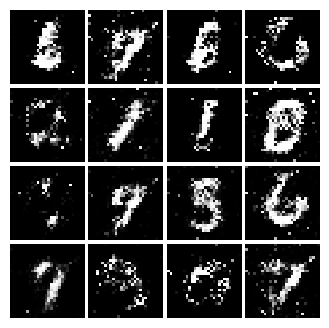

Epoch: 6, Iter: 2960, D: 1.317, G:0.7573


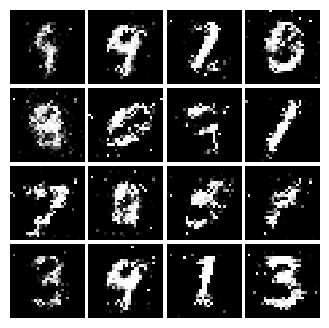

Epoch: 6, Iter: 2980, D: 1.349, G:0.7818


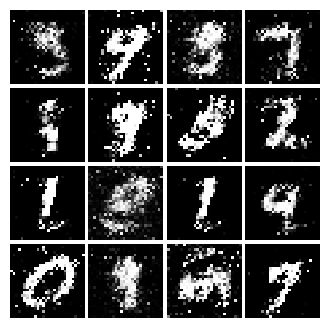

Epoch: 6, Iter: 3000, D: 1.394, G:0.8772


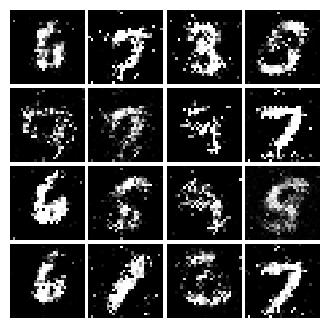

Epoch: 6, Iter: 3020, D: 1.268, G:0.8551


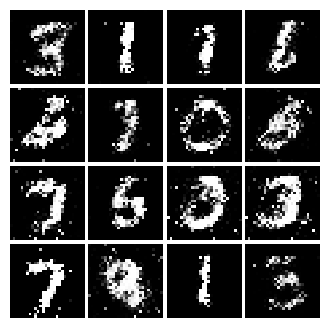

Epoch: 6, Iter: 3040, D: 1.354, G:0.8203


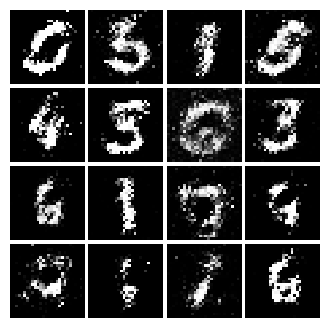

Epoch: 6, Iter: 3060, D: 1.377, G:0.7375


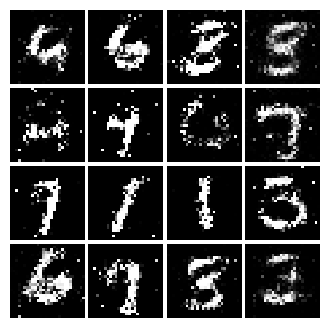

Epoch: 6, Iter: 3080, D: 1.372, G:0.7086


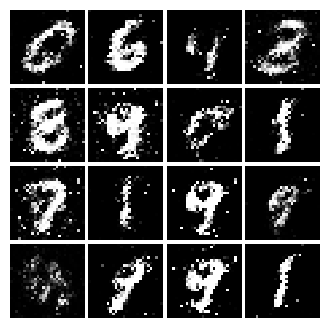

Epoch: 6, Iter: 3100, D: 1.331, G:0.858


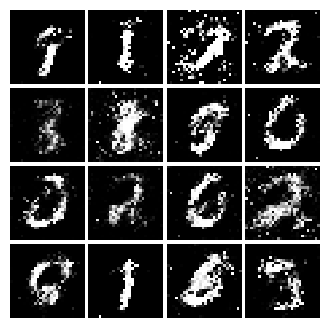

Epoch: 6, Iter: 3120, D: 1.394, G:0.7511


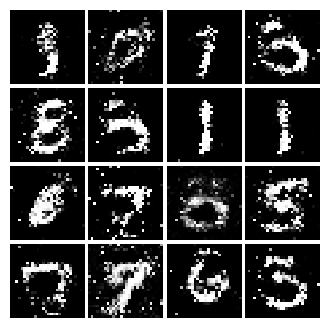

Epoch: 6, Iter: 3140, D: 1.35, G:0.7575


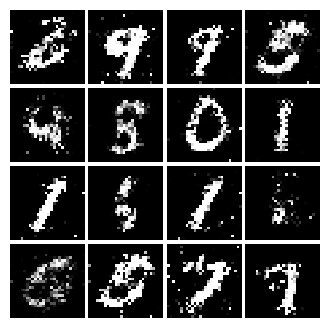

Epoch: 6, Iter: 3160, D: 1.313, G:0.7827


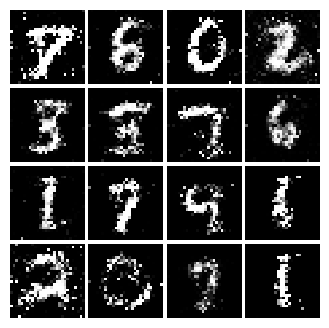

Epoch: 6, Iter: 3180, D: 1.335, G:0.7389


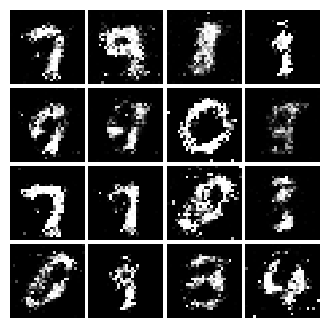

Epoch: 6, Iter: 3200, D: 1.37, G:0.7055


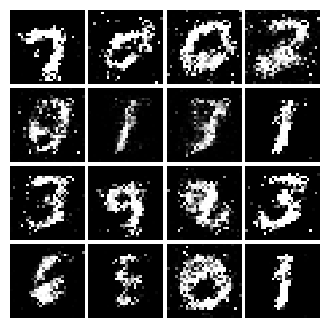

Epoch: 6, Iter: 3220, D: 1.343, G:0.7775


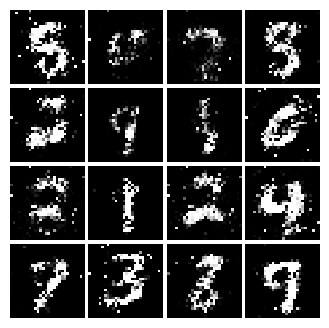

Epoch: 6, Iter: 3240, D: 1.309, G:0.7798


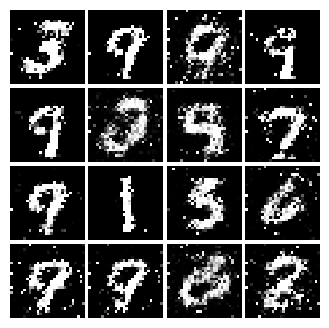

Epoch: 6, Iter: 3260, D: 1.401, G:1.018


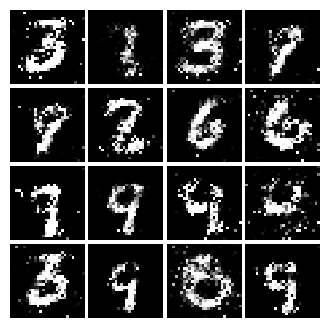

Epoch: 6, Iter: 3280, D: 1.284, G:0.7546


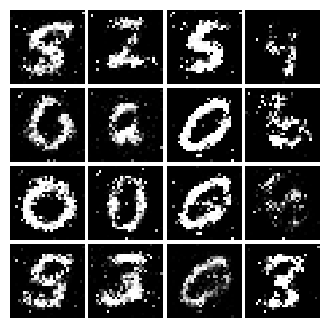

Epoch: 7, Iter: 3300, D: 1.29, G:0.8157


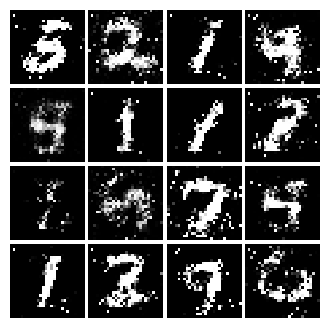

Epoch: 7, Iter: 3320, D: 1.294, G:0.7421


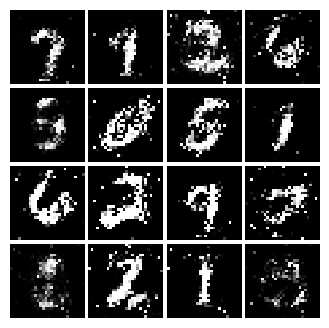

Epoch: 7, Iter: 3340, D: 1.274, G:0.8513


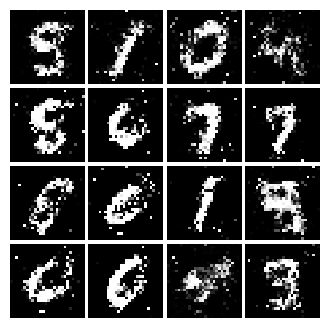

Epoch: 7, Iter: 3360, D: 1.309, G:0.9021


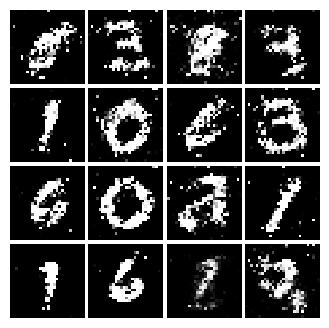

Epoch: 7, Iter: 3380, D: 1.385, G:0.7807


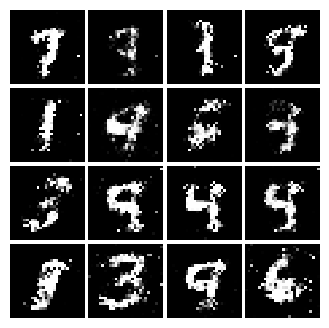

Epoch: 7, Iter: 3400, D: 1.364, G:0.7811


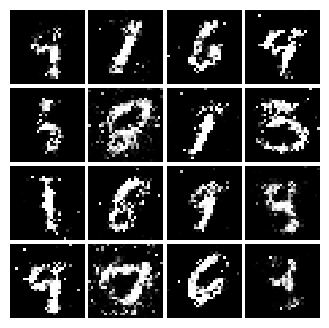

Epoch: 7, Iter: 3420, D: 1.259, G:0.8981


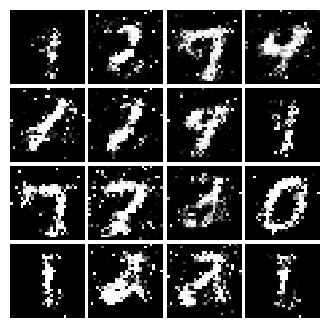

Epoch: 7, Iter: 3440, D: 1.399, G:0.8075


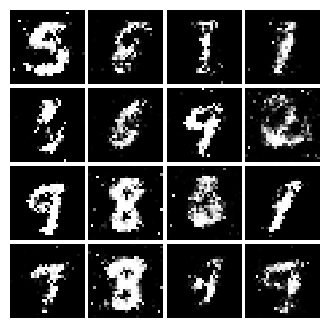

Epoch: 7, Iter: 3460, D: 1.202, G:0.8772


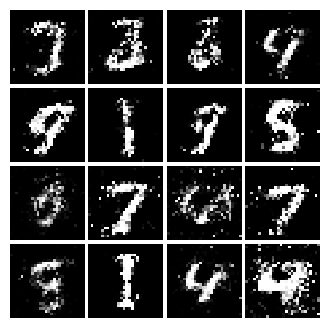

Epoch: 7, Iter: 3480, D: 1.374, G:0.7705


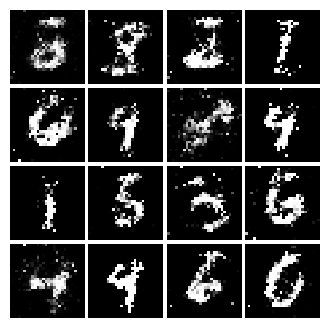

Epoch: 7, Iter: 3500, D: 1.243, G:0.7698


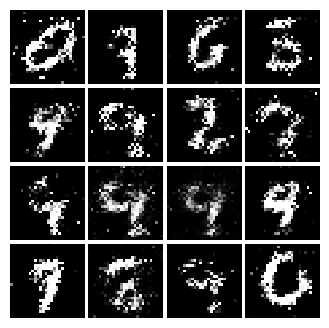

Epoch: 7, Iter: 3520, D: 1.388, G:0.9396


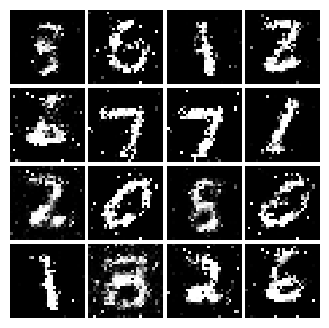

Epoch: 7, Iter: 3540, D: 1.303, G:1.252


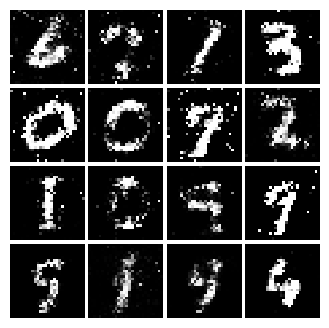

Epoch: 7, Iter: 3560, D: 1.322, G:0.7324


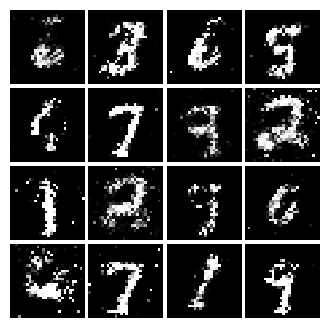

Epoch: 7, Iter: 3580, D: 1.387, G:0.6938


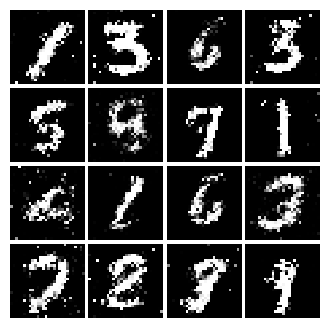

Epoch: 7, Iter: 3600, D: 1.308, G:0.7552


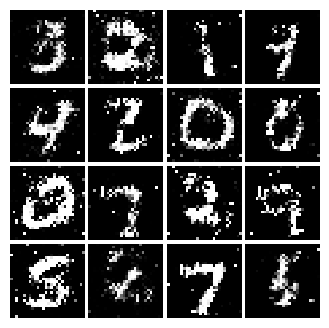

Epoch: 7, Iter: 3620, D: 1.365, G:0.7209


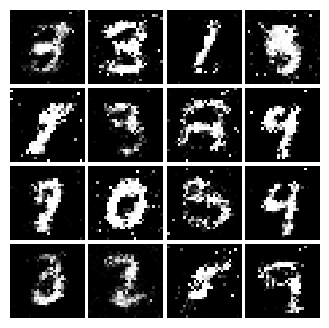

Epoch: 7, Iter: 3640, D: 1.385, G:0.7746


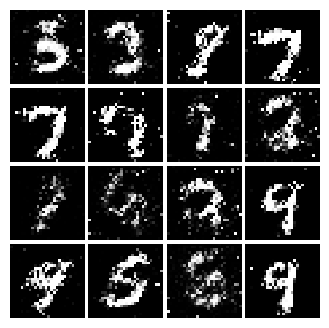

Epoch: 7, Iter: 3660, D: 1.358, G:0.7853


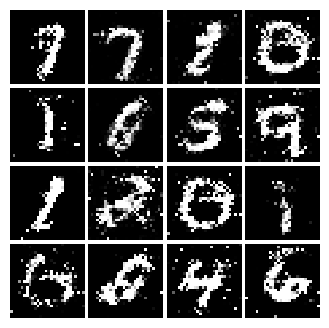

Epoch: 7, Iter: 3680, D: 1.454, G:0.8197


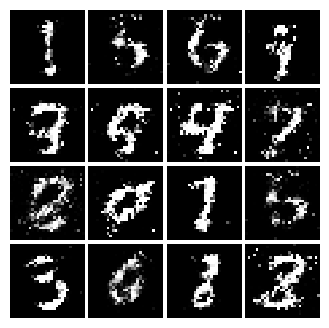

Epoch: 7, Iter: 3700, D: 1.339, G:0.7394


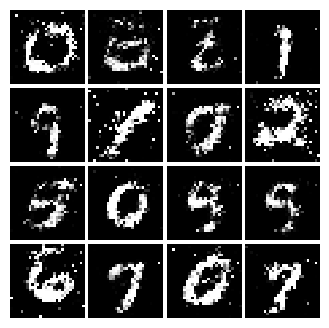

Epoch: 7, Iter: 3720, D: 1.367, G:0.7616


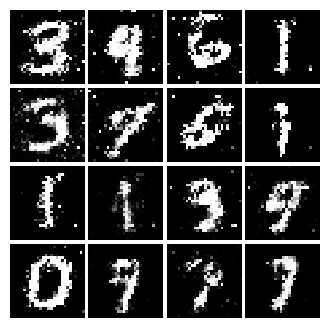

Epoch: 7, Iter: 3740, D: 1.33, G:0.7496


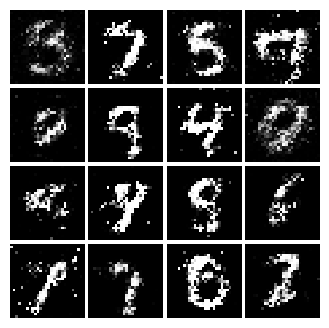

Epoch: 8, Iter: 3760, D: 1.28, G:0.669


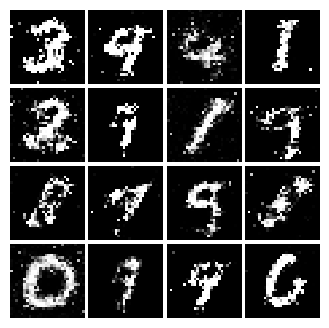

Epoch: 8, Iter: 3780, D: 1.376, G:0.7945


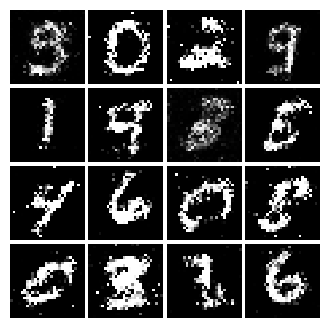

Epoch: 8, Iter: 3800, D: 1.396, G:0.7843


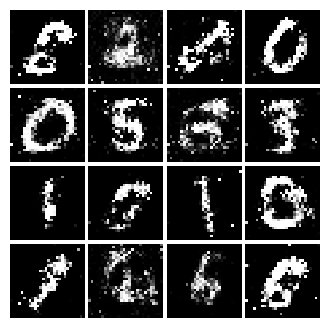

Epoch: 8, Iter: 3820, D: 1.375, G:0.8255


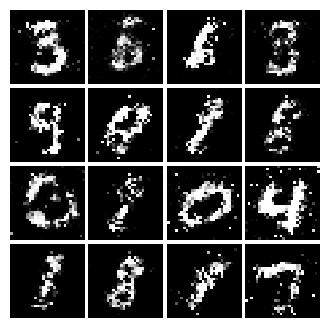

Epoch: 8, Iter: 3840, D: 1.348, G:0.7339


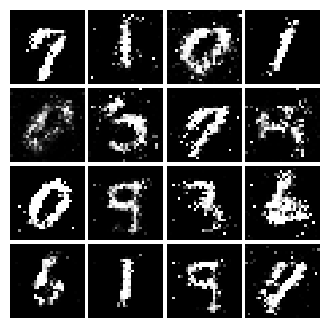

Epoch: 8, Iter: 3860, D: 1.365, G:0.8015


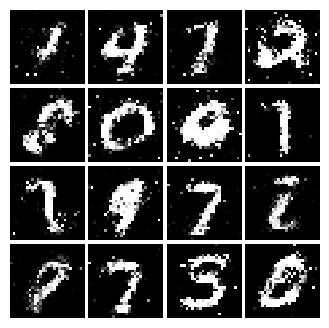

Epoch: 8, Iter: 3880, D: 1.364, G:0.8141


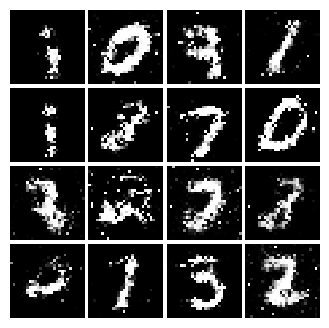

Epoch: 8, Iter: 3900, D: 1.385, G:0.7978


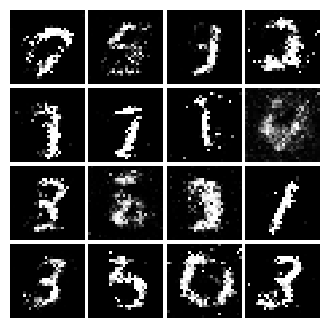

Epoch: 8, Iter: 3920, D: 1.311, G:0.8532


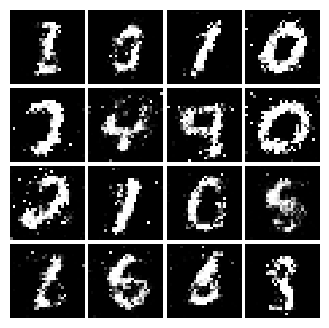

Epoch: 8, Iter: 3940, D: 1.384, G:0.7347


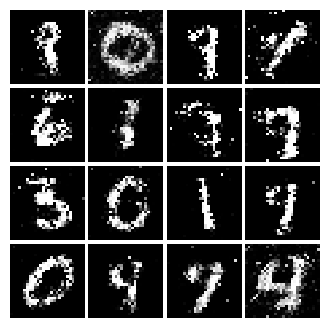

Epoch: 8, Iter: 3960, D: 1.313, G:0.7543


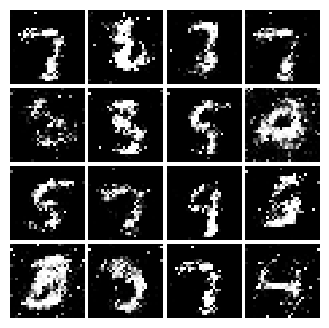

Epoch: 8, Iter: 3980, D: 1.309, G:0.752


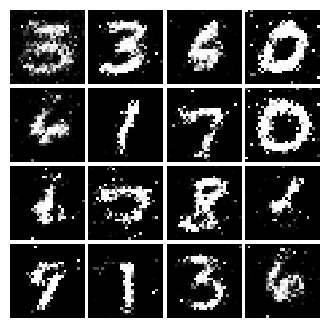

Epoch: 8, Iter: 4000, D: 1.312, G:0.7318


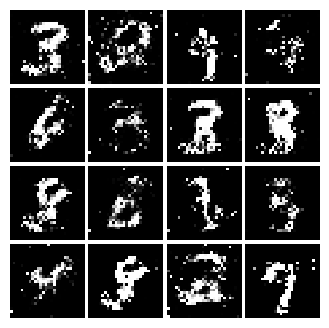

Epoch: 8, Iter: 4020, D: 1.377, G:0.8106


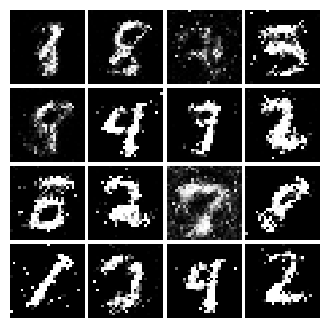

Epoch: 8, Iter: 4040, D: 1.35, G:0.7275


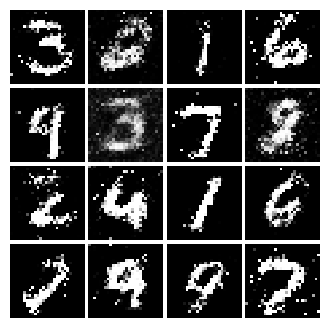

Epoch: 8, Iter: 4060, D: 1.339, G:0.7342


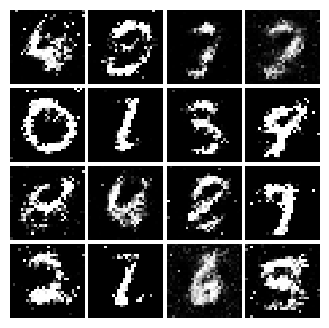

Epoch: 8, Iter: 4080, D: 1.386, G:0.787


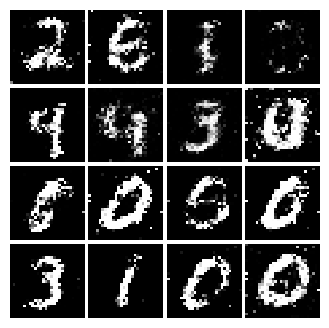

Epoch: 8, Iter: 4100, D: 1.344, G:0.7667


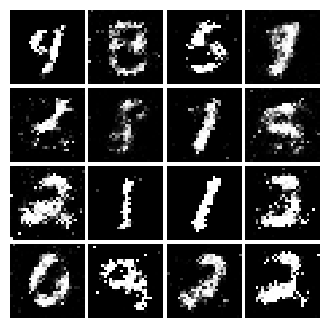

Epoch: 8, Iter: 4120, D: 1.353, G:0.7558


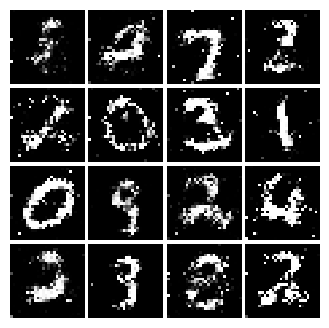

Epoch: 8, Iter: 4140, D: 1.402, G:0.6596


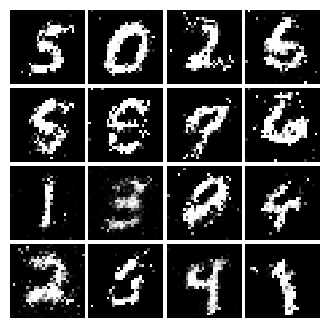

Epoch: 8, Iter: 4160, D: 1.319, G:0.8195


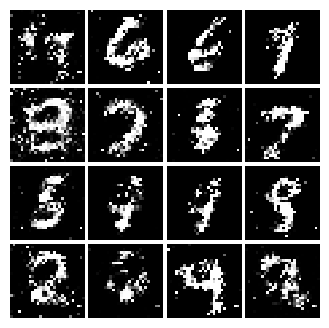

Epoch: 8, Iter: 4180, D: 1.403, G:0.8377


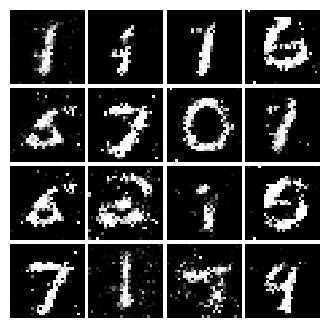

Epoch: 8, Iter: 4200, D: 1.385, G:0.7699


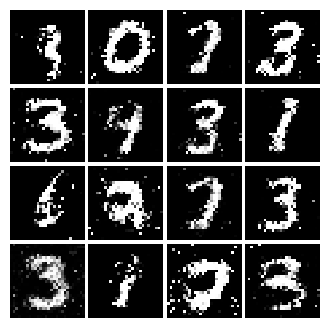

Epoch: 8, Iter: 4220, D: 1.39, G:1.034


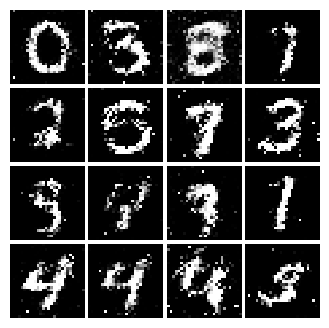

Epoch: 9, Iter: 4240, D: 1.44, G:0.6817


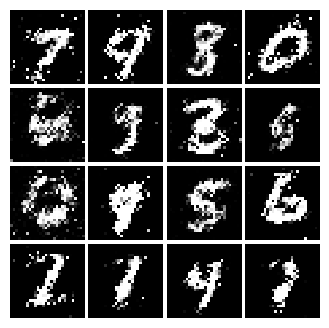

Epoch: 9, Iter: 4260, D: 1.35, G:0.7692


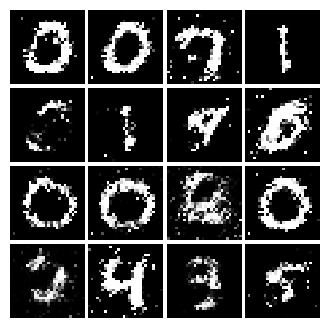

Epoch: 9, Iter: 4280, D: 1.321, G:0.784


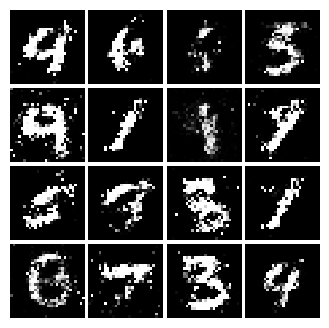

Epoch: 9, Iter: 4300, D: 1.371, G:0.7358


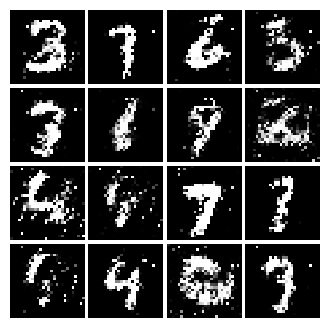

Epoch: 9, Iter: 4320, D: 1.429, G:0.689


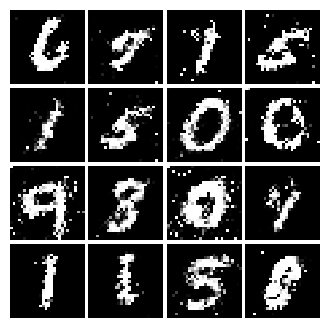

Epoch: 9, Iter: 4340, D: 1.335, G:0.7848


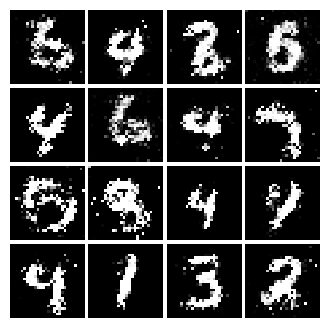

Epoch: 9, Iter: 4360, D: 1.375, G:0.8078


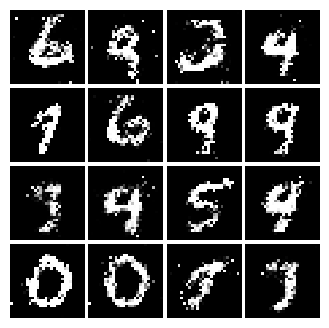

Epoch: 9, Iter: 4380, D: 1.399, G:0.7348


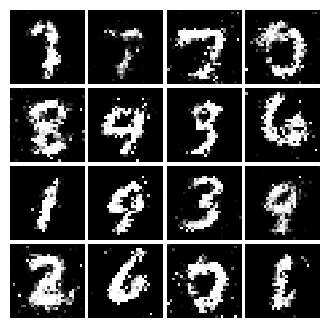

Epoch: 9, Iter: 4400, D: 1.348, G:0.6987


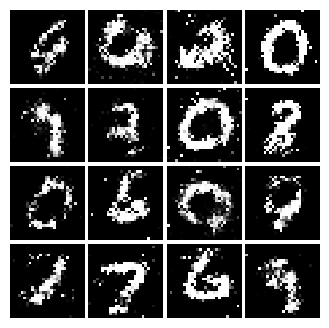

Epoch: 9, Iter: 4420, D: 1.296, G:0.7487


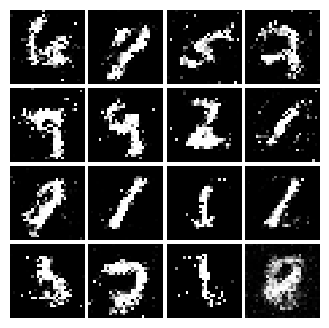

Epoch: 9, Iter: 4440, D: 1.396, G:0.7535


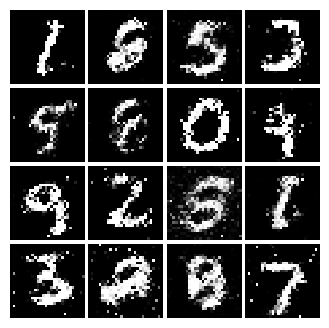

Epoch: 9, Iter: 4460, D: 1.362, G:0.782


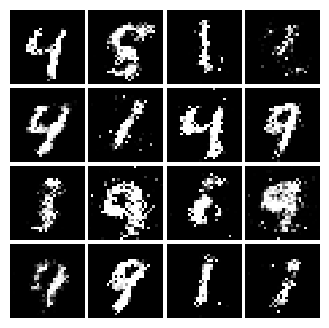

Epoch: 9, Iter: 4480, D: 1.293, G:0.7419


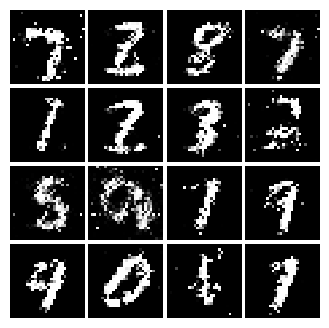

Epoch: 9, Iter: 4500, D: 1.402, G:0.7041


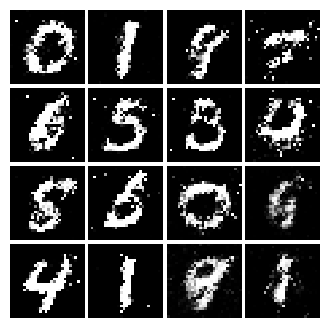

Epoch: 9, Iter: 4520, D: 1.317, G:0.8307


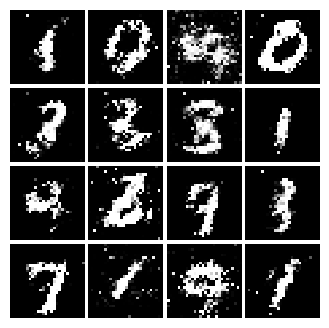

Epoch: 9, Iter: 4540, D: 1.294, G:0.8043


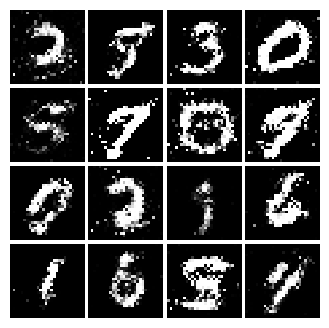

Epoch: 9, Iter: 4560, D: 1.326, G:0.7368


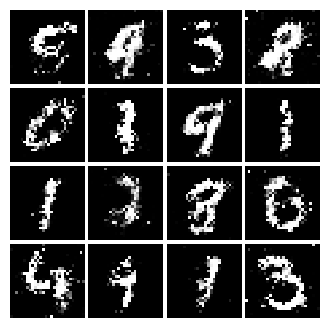

Epoch: 9, Iter: 4580, D: 1.353, G:0.8093


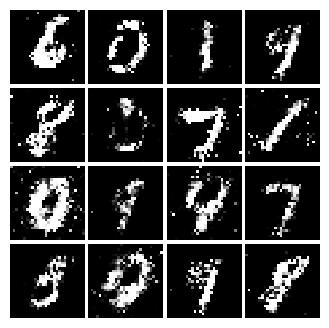

Epoch: 9, Iter: 4600, D: 1.365, G:0.7711


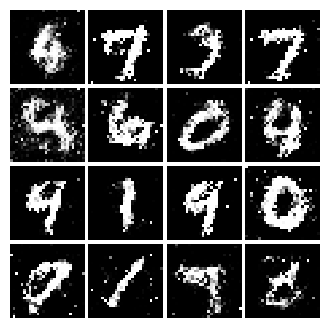

Epoch: 9, Iter: 4620, D: 1.396, G:0.747


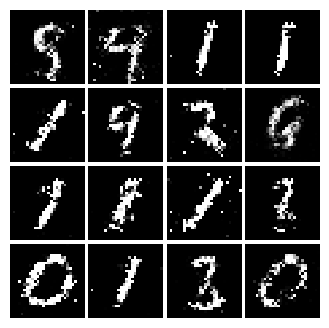

Epoch: 9, Iter: 4640, D: 1.425, G:0.7569


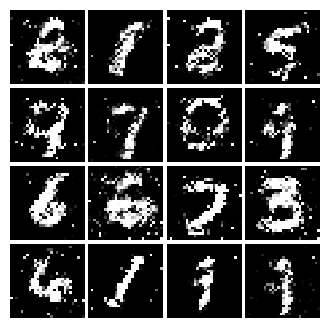

Epoch: 9, Iter: 4660, D: 1.384, G:0.7426


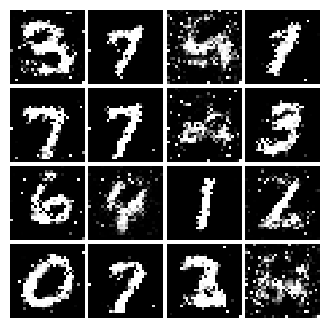

Epoch: 9, Iter: 4680, D: 1.365, G:0.7983


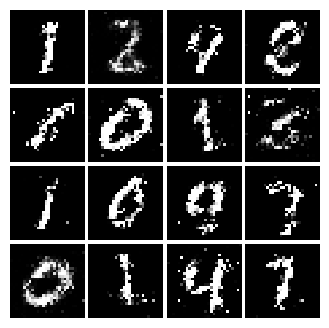

Final images


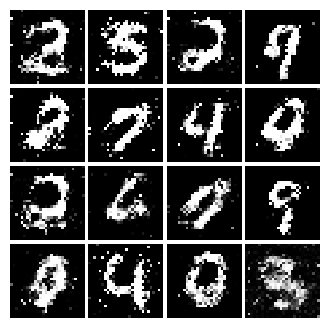

In [36]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_optimizer, G_optimizer = get_optimizers()

# Run it!
run_a_gan(D, G, D_optimizer, G_optimizer, discriminator_loss, generator_loss)

# Least Squares GAN
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alternative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`score_real` and `score_fake`).

In [37]:
def ls_discriminator_loss(scores_real, scores_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.

    Inputs:
    - scores_real: Tensor of shape (N, 1) giving scores for the real data.
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.

    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    ###############################################################
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ###############################################################

    # Calculate the target values for real and fake data
    target_real = tf.ones_like(scores_real)
    target_fake = tf.zeros_like(scores_fake)

    # Compute the loss for real and fake data
    loss_real = tf.reduce_mean(tf.square(scores_real - target_real))
    loss_fake = tf.reduce_mean(tf.square(scores_fake - target_fake))

    # The total loss is the average of the losses for real and fake data
    loss = 0.5 * (loss_real + loss_fake)

    #############################################################
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    #############################################################
    return loss

def ls_generator_loss(scores_fake):
    """
    Computes the Least-Squares GAN loss for the generator.

    Inputs:
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.

    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    ###############################################################
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ###############################################################

    # Calculate the target values for real and fake data
    target_fake = tf.ones_like(scores_fake)

    # Compute the loss for fake data
    loss = 0.5 * tf.reduce_mean(tf.square(scores_fake - target_fake))

    #############################################################
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    #############################################################
    return loss

Test your LSGAN loss. You should see errors less than 1e-8.

In [38]:
def test_lsgan_loss(score_real, score_fake, d_loss_true, g_loss_true):

    d_loss = ls_discriminator_loss(tf.constant(score_real), tf.constant(score_fake))
    g_loss = ls_generator_loss(tf.constant(score_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_lsgan_loss(answers['logits_real'], answers['logits_fake'],
                answers['d_loss_lsgan_true'], answers['g_loss_lsgan_true'])

Maximum error in d_loss: 0
Maximum error in g_loss: 0


Create new training steps so we instead minimize the LSGAN loss:

Epoch: 0, Iter: 0, D: 0.2452, G:0.3017


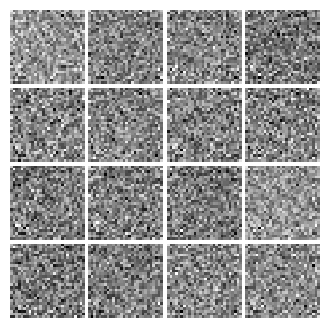

Epoch: 0, Iter: 20, D: 0.1462, G:1.951


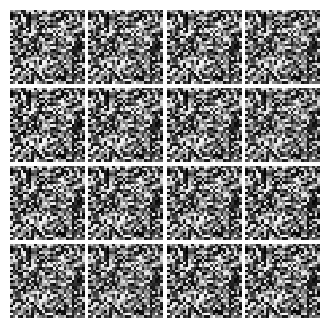

Epoch: 0, Iter: 40, D: 0.03331, G:0.9909


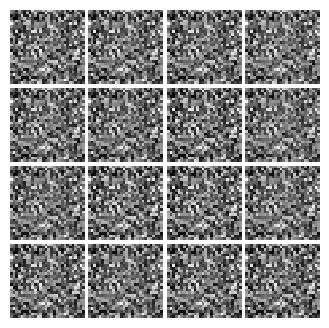

Epoch: 0, Iter: 60, D: 0.1036, G:0.5158


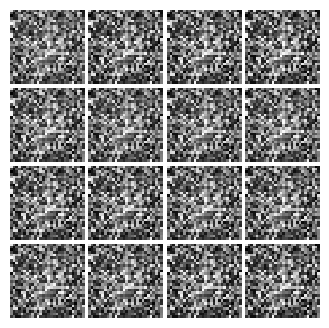

Epoch: 0, Iter: 80, D: 0.03816, G:0.5798


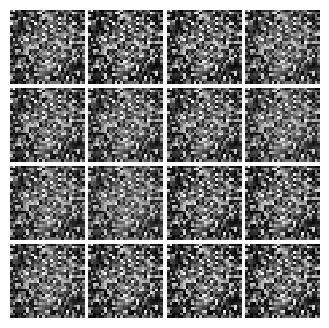

Epoch: 0, Iter: 100, D: 0.0177, G:0.5719


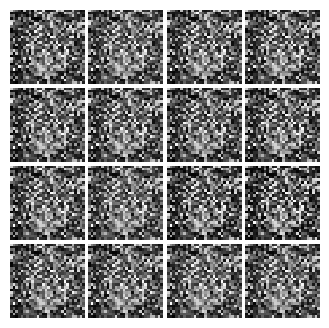

Epoch: 0, Iter: 120, D: 0.01744, G:0.8068


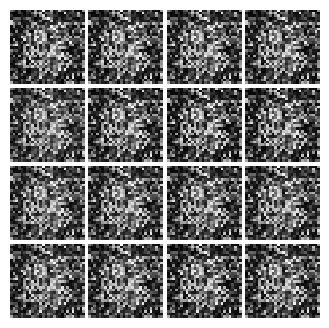

Epoch: 0, Iter: 140, D: 1.085, G:3.384


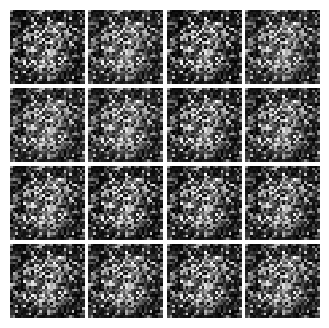

Epoch: 0, Iter: 160, D: 0.04372, G:0.5404


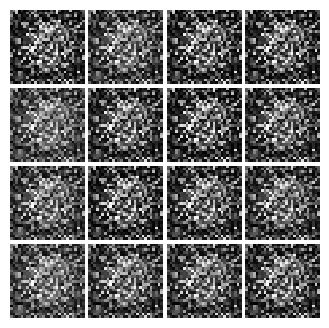

Epoch: 0, Iter: 180, D: 0.07955, G:0.6618


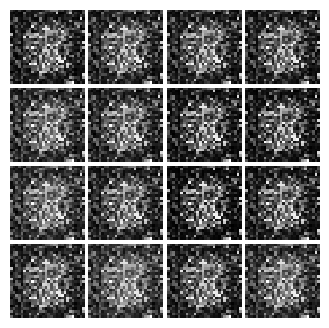

Epoch: 0, Iter: 200, D: 0.6799, G:1.994


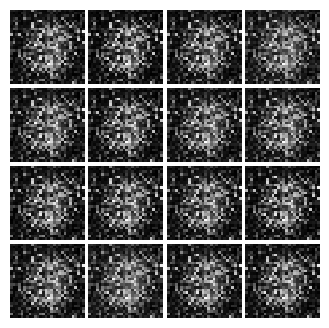

Epoch: 0, Iter: 220, D: 0.1528, G:0.3754


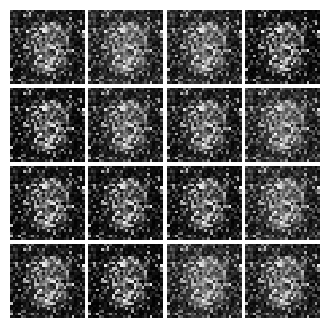

Epoch: 0, Iter: 240, D: 0.05994, G:0.5224


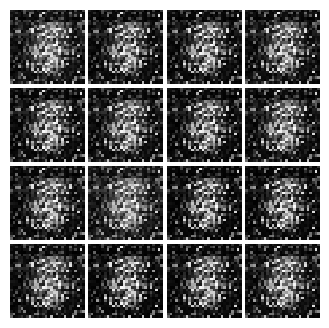

Epoch: 0, Iter: 260, D: 0.08653, G:0.4169


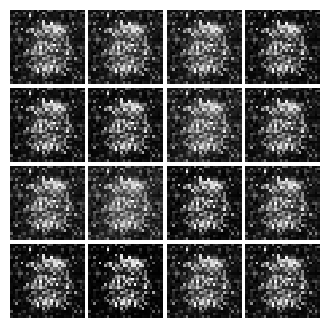

Epoch: 0, Iter: 280, D: 0.1996, G:1.176


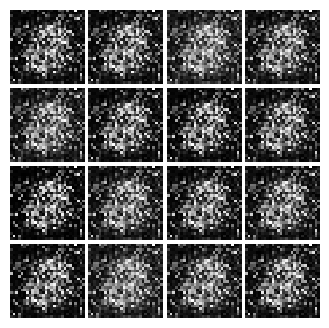

Epoch: 0, Iter: 300, D: 0.2563, G:0.3112


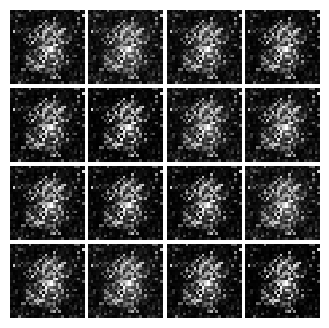

Epoch: 0, Iter: 320, D: 0.2254, G:0.3393


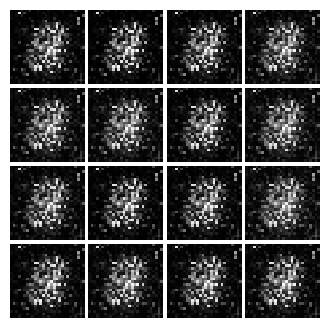

Epoch: 0, Iter: 340, D: 0.03573, G:0.5092


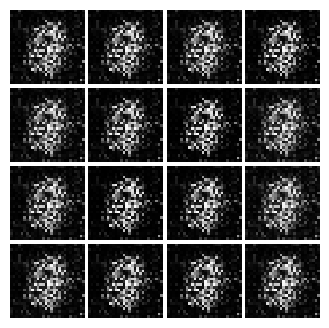

Epoch: 0, Iter: 360, D: 0.1323, G:0.3759


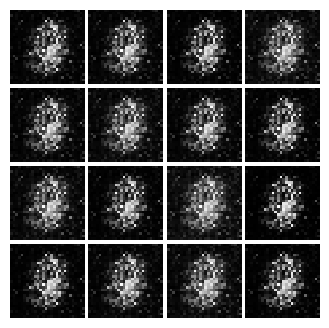

Epoch: 0, Iter: 380, D: 0.109, G:0.4243


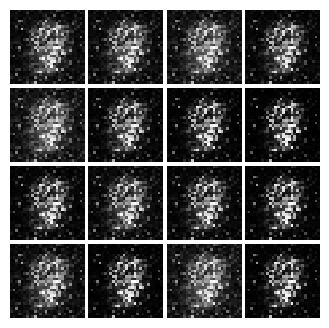

Epoch: 0, Iter: 400, D: 0.0952, G:0.4873


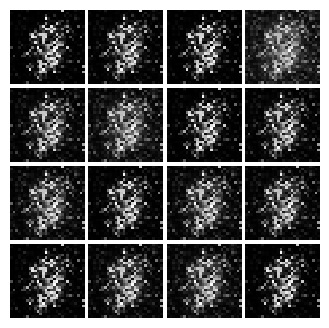

Epoch: 0, Iter: 420, D: 0.1029, G:0.6165


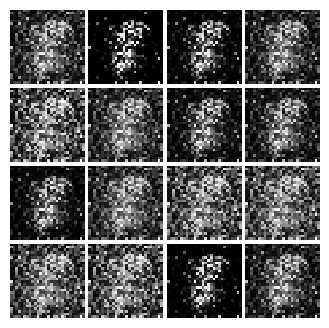

Epoch: 0, Iter: 440, D: 0.1401, G:1.304


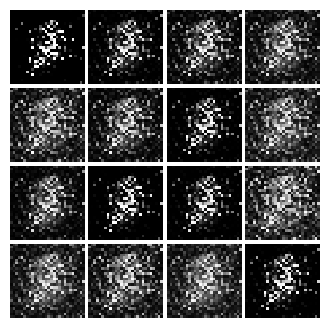

Epoch: 0, Iter: 460, D: 0.1827, G:0.3827


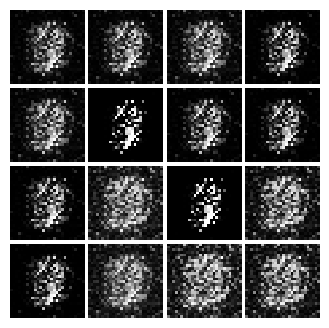

Epoch: 1, Iter: 480, D: 0.168, G:0.4832


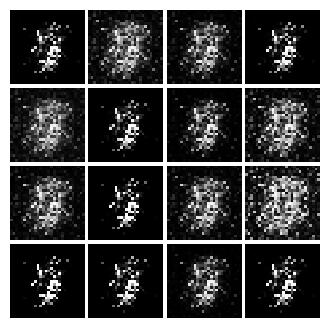

Epoch: 1, Iter: 500, D: 0.1696, G:0.2693


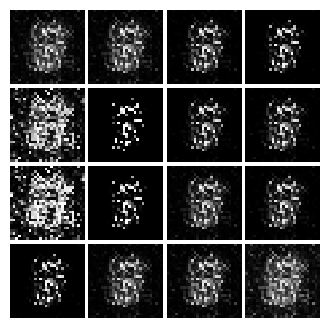

Epoch: 1, Iter: 520, D: 0.2018, G:0.5716


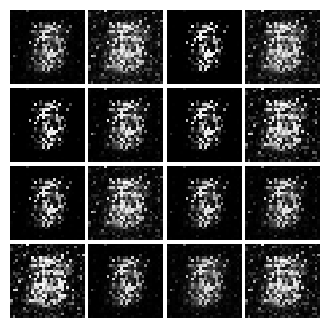

Epoch: 1, Iter: 540, D: 0.1379, G:0.4347


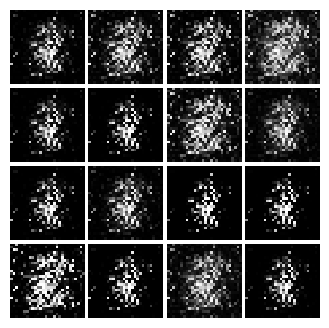

Epoch: 1, Iter: 560, D: 0.2726, G:0.4961


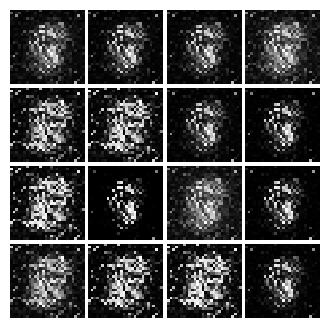

Epoch: 1, Iter: 580, D: 0.09974, G:0.3954


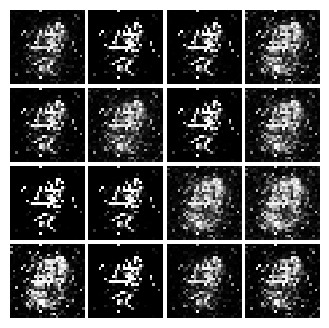

Epoch: 1, Iter: 600, D: 0.1454, G:0.354


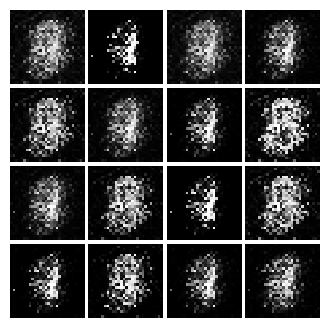

Epoch: 1, Iter: 620, D: 0.1738, G:0.3619


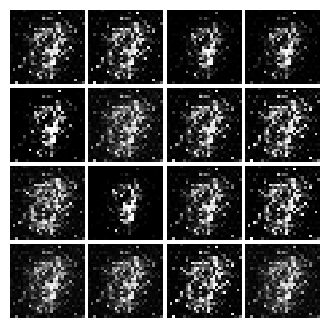

Epoch: 1, Iter: 640, D: 0.1168, G:0.3278


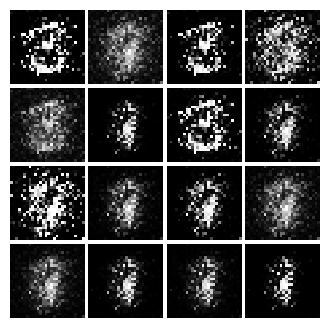

Epoch: 1, Iter: 660, D: 0.1054, G:0.5936


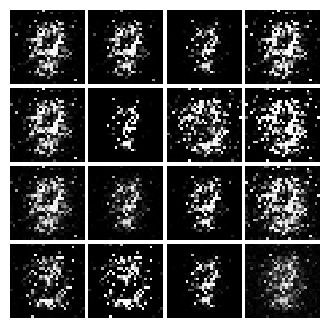

Epoch: 1, Iter: 680, D: 0.1932, G:0.6146


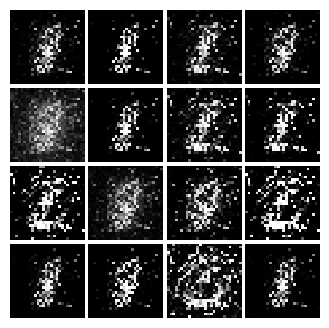

Epoch: 1, Iter: 700, D: 0.1625, G:0.331


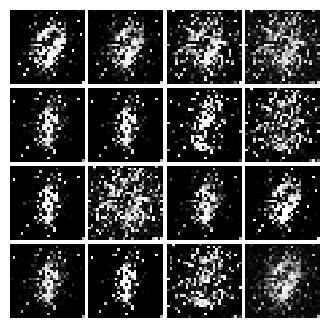

Epoch: 1, Iter: 720, D: 0.123, G:0.4051


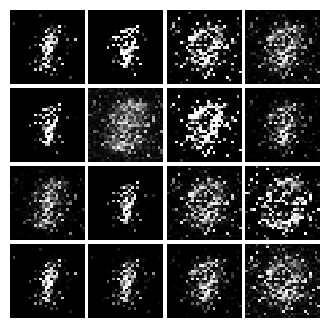

Epoch: 1, Iter: 740, D: 0.1868, G:0.2454


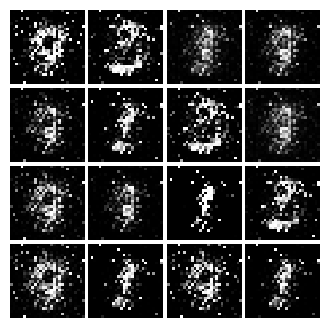

Epoch: 1, Iter: 760, D: 0.173, G:0.122


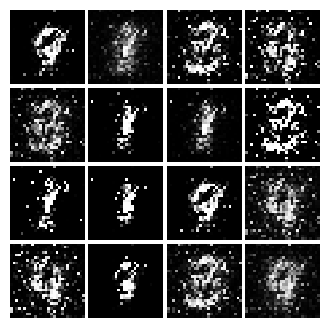

Epoch: 1, Iter: 780, D: 0.2077, G:0.3337


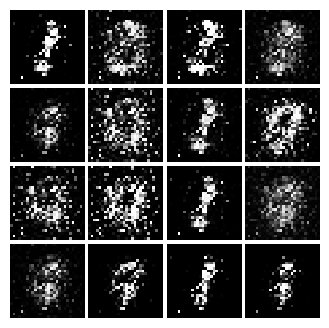

Epoch: 1, Iter: 800, D: 0.1486, G:0.262


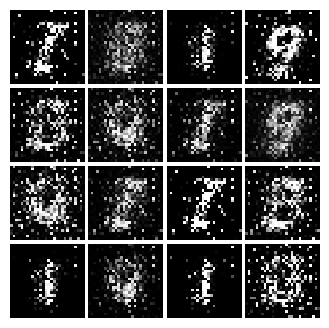

Epoch: 1, Iter: 820, D: 0.1196, G:0.4101


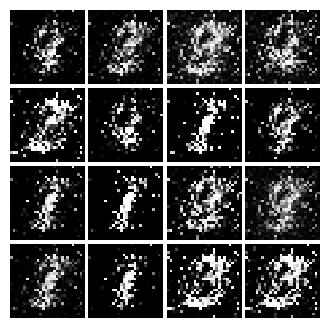

Epoch: 1, Iter: 840, D: 0.1946, G:1.05


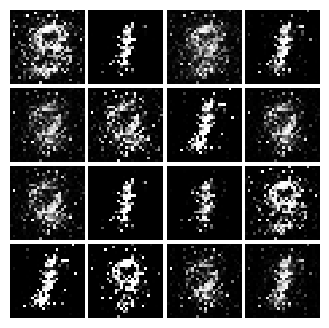

Epoch: 1, Iter: 860, D: 0.1303, G:0.3839


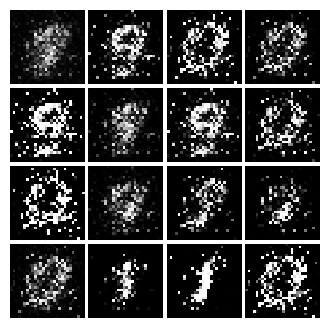

Epoch: 1, Iter: 880, D: 0.1583, G:0.5211


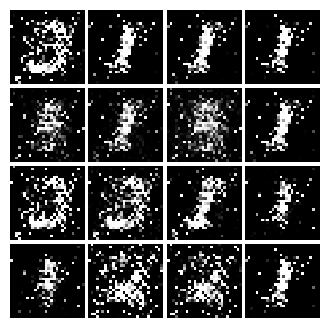

Epoch: 1, Iter: 900, D: 0.07603, G:0.3824


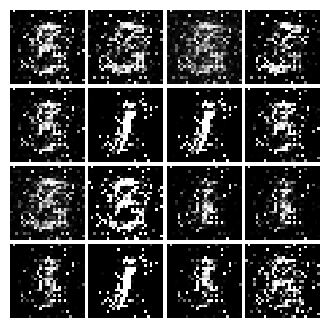

Epoch: 1, Iter: 920, D: 0.4774, G:0.06342


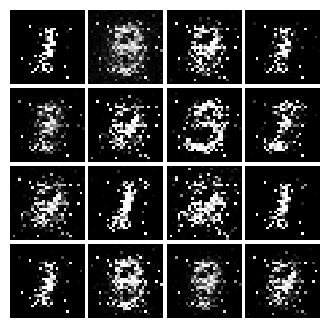

Epoch: 2, Iter: 940, D: 0.1277, G:0.4114


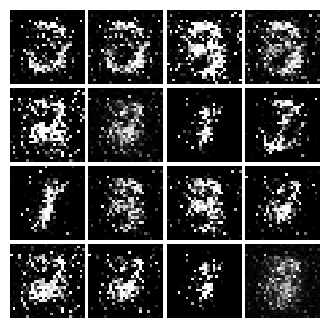

Epoch: 2, Iter: 960, D: 0.08852, G:0.4186


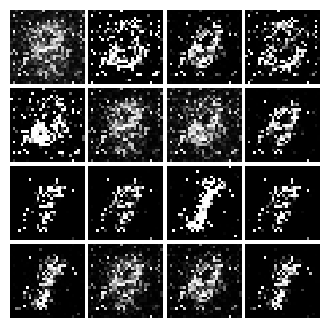

Epoch: 2, Iter: 980, D: 0.1729, G:0.5698


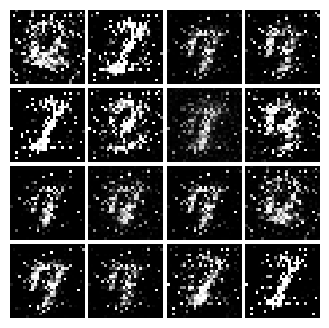

Epoch: 2, Iter: 1000, D: 0.1397, G:0.4281


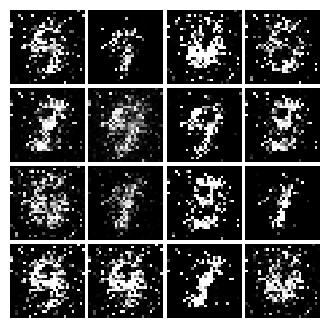

Epoch: 2, Iter: 1020, D: 0.1218, G:0.282


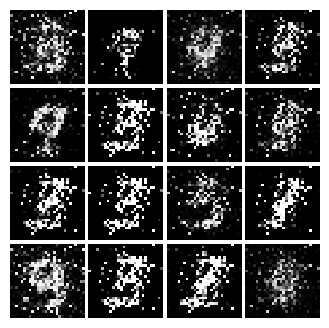

Epoch: 2, Iter: 1040, D: 0.1313, G:0.3428


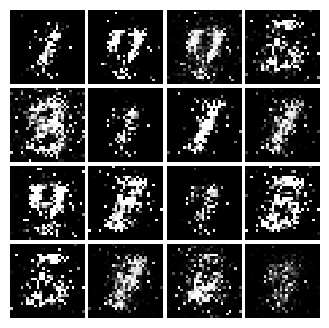

Epoch: 2, Iter: 1060, D: 0.1332, G:0.3233


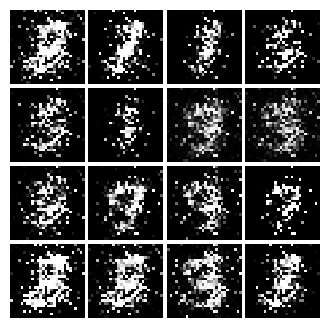

Epoch: 2, Iter: 1080, D: 0.1011, G:0.3694


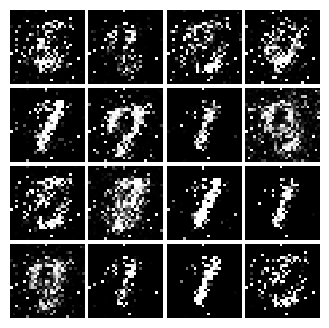

Epoch: 2, Iter: 1100, D: 0.159, G:0.3687


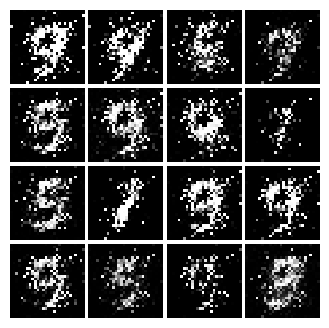

Epoch: 2, Iter: 1120, D: 0.1385, G:0.3544


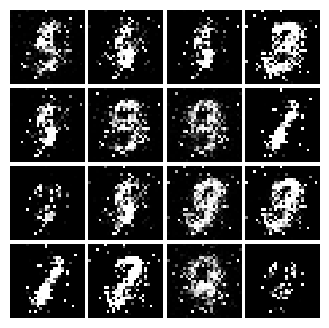

Epoch: 2, Iter: 1140, D: 0.2536, G:0.1489


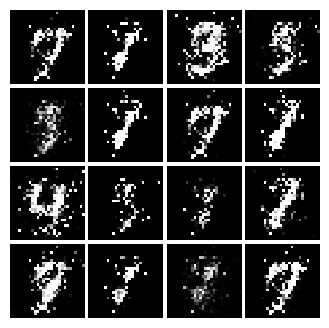

Epoch: 2, Iter: 1160, D: 0.128, G:0.3201


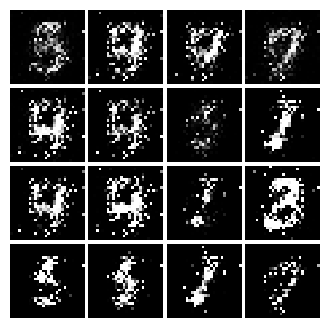

Epoch: 2, Iter: 1180, D: 0.1046, G:0.4751


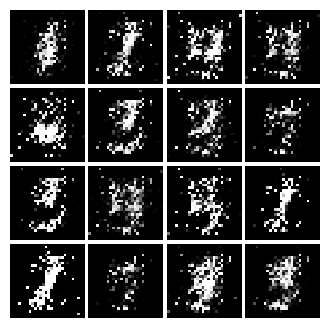

Epoch: 2, Iter: 1200, D: 0.1667, G:0.3982


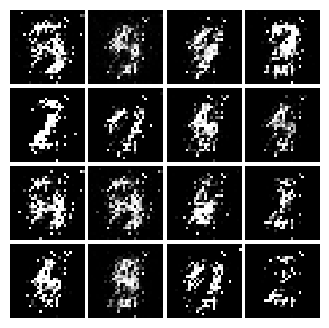

Epoch: 2, Iter: 1220, D: 0.1216, G:0.791


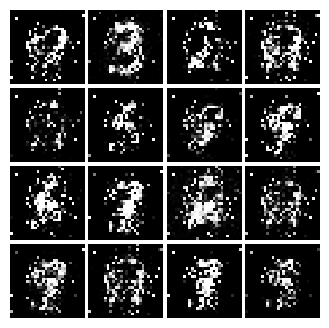

Epoch: 2, Iter: 1240, D: 0.1759, G:0.05005


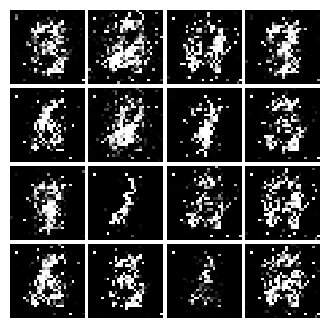

Epoch: 2, Iter: 1260, D: 0.1059, G:0.2903


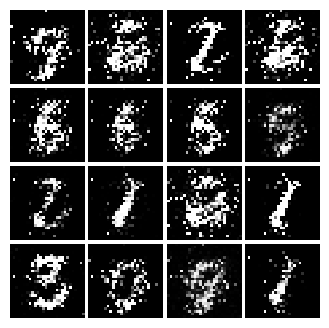

Epoch: 2, Iter: 1280, D: 0.1252, G:0.1804


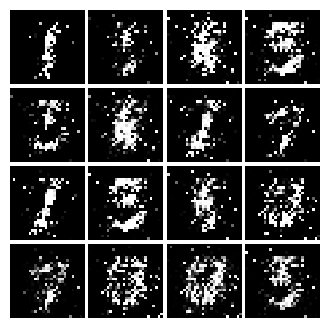

Epoch: 2, Iter: 1300, D: 0.09318, G:0.5404


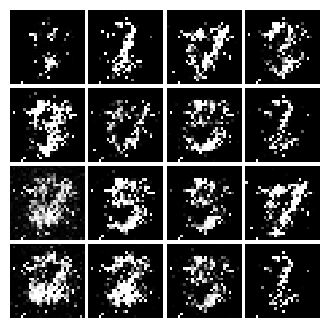

Epoch: 2, Iter: 1320, D: 0.1677, G:0.2183


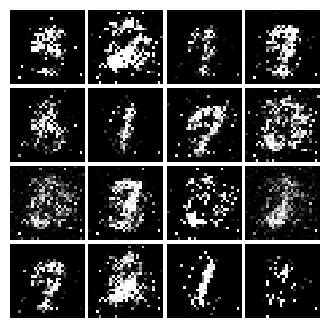

Epoch: 2, Iter: 1340, D: 0.1333, G:0.2891


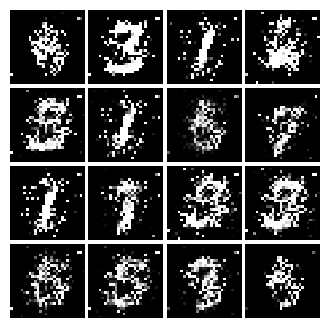

Epoch: 2, Iter: 1360, D: 0.1348, G:0.2901


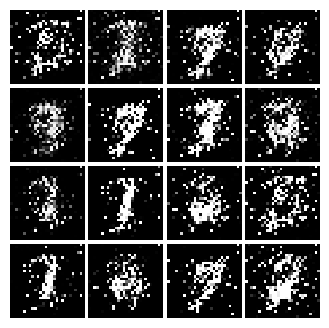

Epoch: 2, Iter: 1380, D: 0.1471, G:0.4909


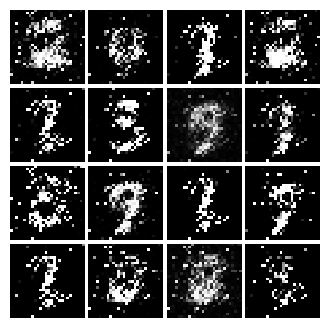

Epoch: 2, Iter: 1400, D: 0.1281, G:0.3879


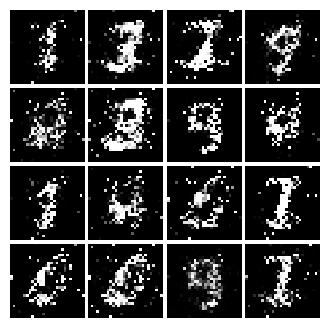

Epoch: 3, Iter: 1420, D: 0.1692, G:0.3196


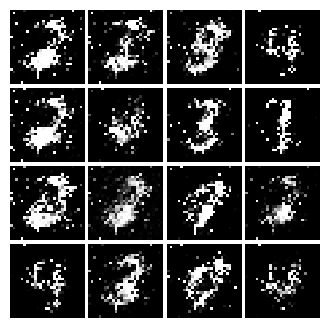

Epoch: 3, Iter: 1440, D: 0.1279, G:0.3037


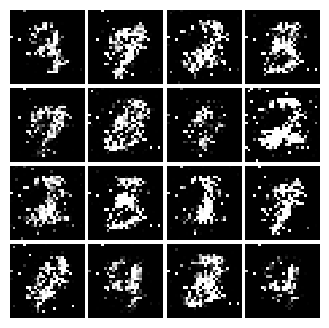

Epoch: 3, Iter: 1460, D: 0.1798, G:0.3118


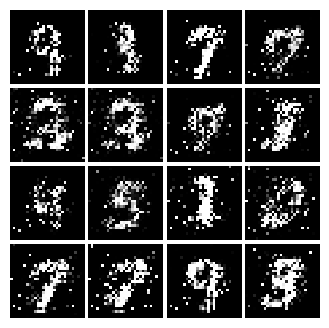

Epoch: 3, Iter: 1480, D: 0.1483, G:0.3283


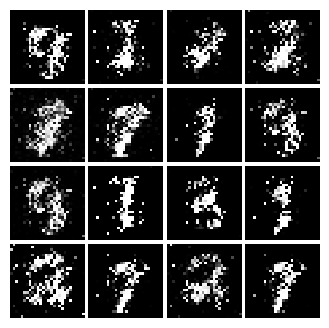

Epoch: 3, Iter: 1500, D: 0.1386, G:0.6098


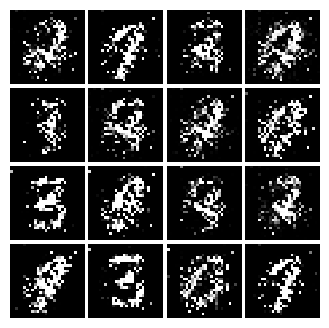

Epoch: 3, Iter: 1520, D: 0.1753, G:0.2806


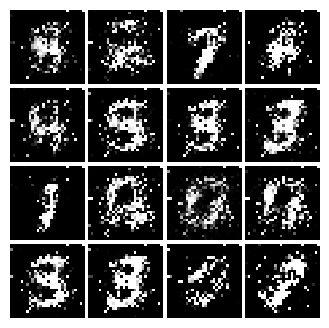

Epoch: 3, Iter: 1540, D: 0.1667, G:0.4625


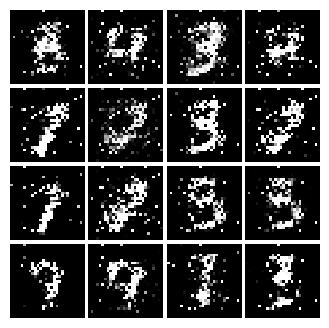

Epoch: 3, Iter: 1560, D: 0.1812, G:0.2337


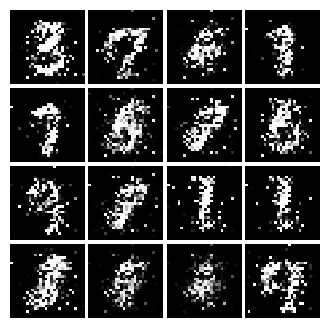

Epoch: 3, Iter: 1580, D: 0.1575, G:0.2938


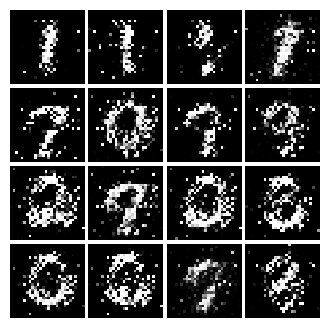

Epoch: 3, Iter: 1600, D: 0.1605, G:0.3534


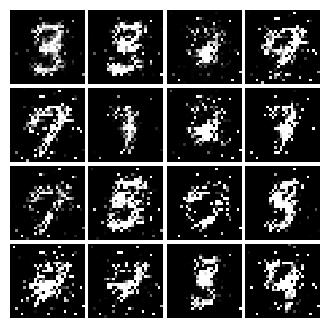

Epoch: 3, Iter: 1620, D: 0.1361, G:0.3833


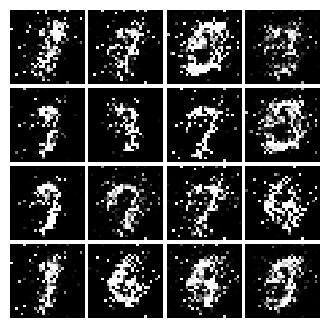

Epoch: 3, Iter: 1640, D: 0.1723, G:1.084


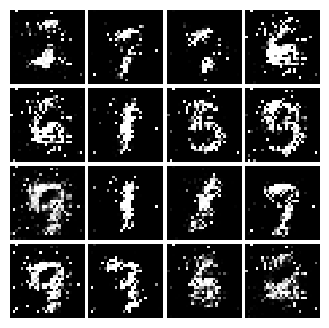

Epoch: 3, Iter: 1660, D: 0.1646, G:0.2745


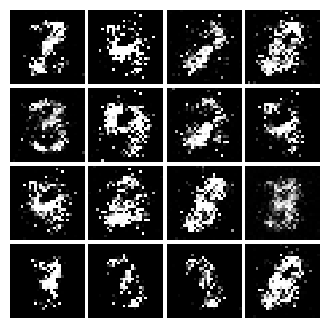

Epoch: 3, Iter: 1680, D: 0.1827, G:0.2151


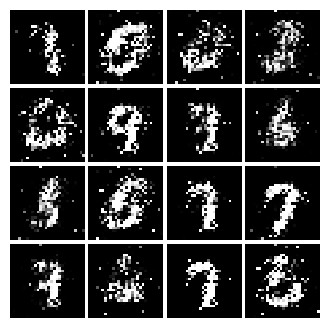

Epoch: 3, Iter: 1700, D: 0.2322, G:0.06796


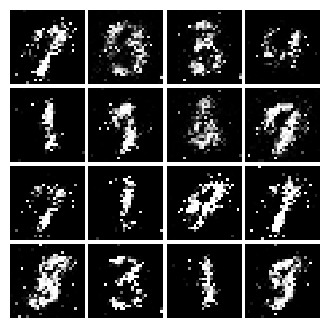

Epoch: 3, Iter: 1720, D: 0.1726, G:0.2547


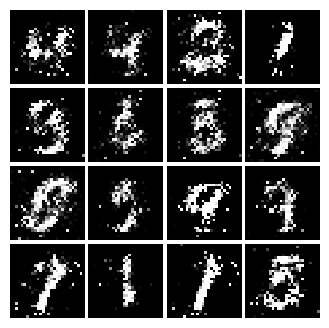

Epoch: 3, Iter: 1740, D: 0.1568, G:0.2657


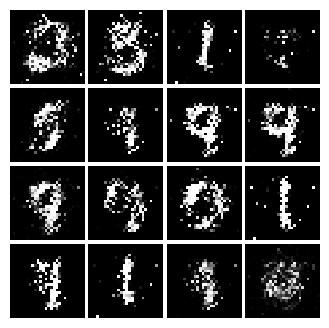

Epoch: 3, Iter: 1760, D: 0.1652, G:0.2544


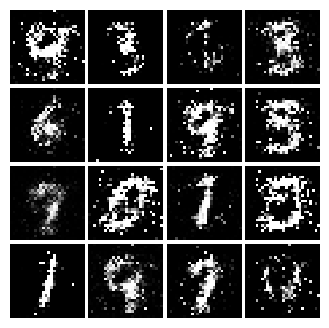

Epoch: 3, Iter: 1780, D: 0.171, G:0.3235


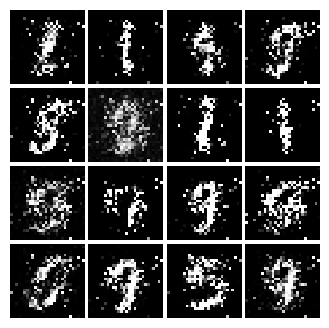

Epoch: 3, Iter: 1800, D: 0.1657, G:0.1917


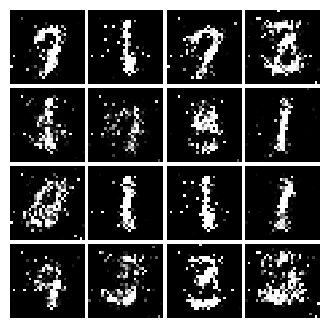

Epoch: 3, Iter: 1820, D: 0.2094, G:0.2907


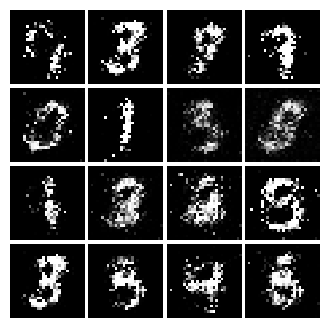

Epoch: 3, Iter: 1840, D: 0.1888, G:0.2478


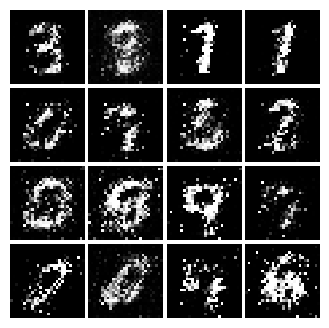

Epoch: 3, Iter: 1860, D: 0.1917, G:0.1937


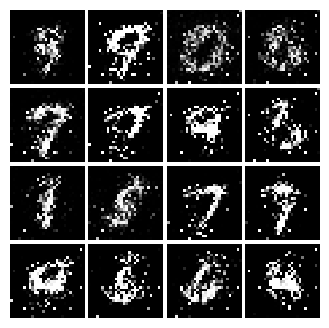

Epoch: 4, Iter: 1880, D: 0.1855, G:0.2841


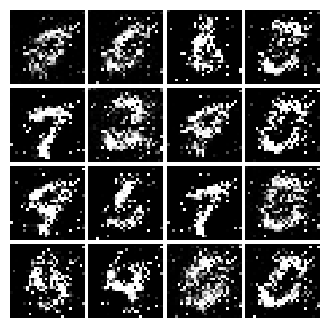

Epoch: 4, Iter: 1900, D: 0.1803, G:0.2391


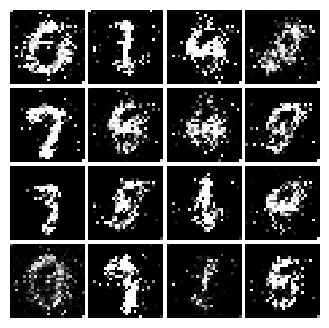

Epoch: 4, Iter: 1920, D: 0.1773, G:0.2745


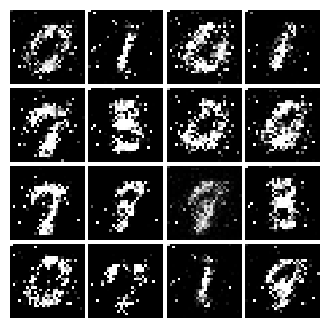

Epoch: 4, Iter: 1940, D: 0.2333, G:0.2696


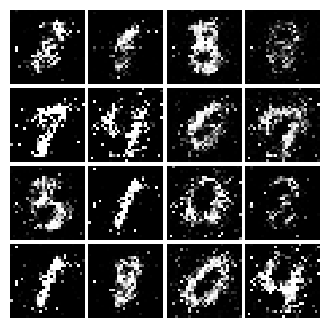

Epoch: 4, Iter: 1960, D: 0.2029, G:0.2012


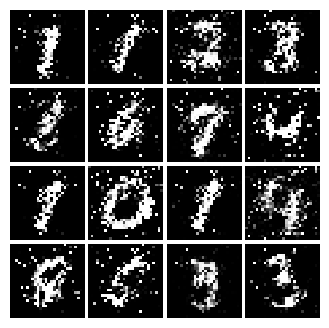

Epoch: 4, Iter: 1980, D: 0.1893, G:0.2414


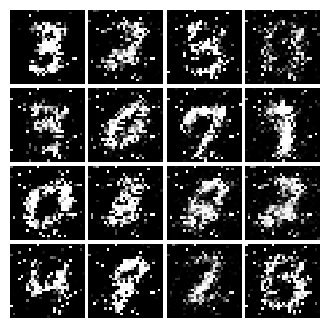

Epoch: 4, Iter: 2000, D: 0.2095, G:0.2207


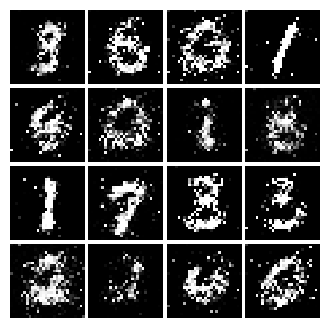

Epoch: 4, Iter: 2020, D: 0.1906, G:0.1845


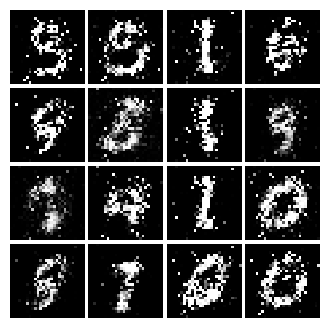

Epoch: 4, Iter: 2040, D: 0.2422, G:0.2235


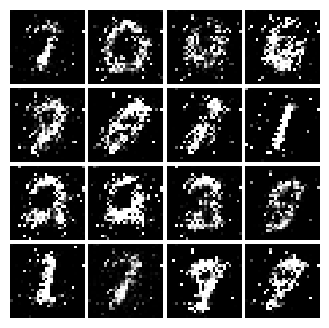

Epoch: 4, Iter: 2060, D: 0.2476, G:0.2433


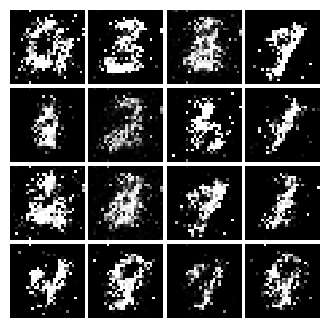

Epoch: 4, Iter: 2080, D: 0.2152, G:0.1778


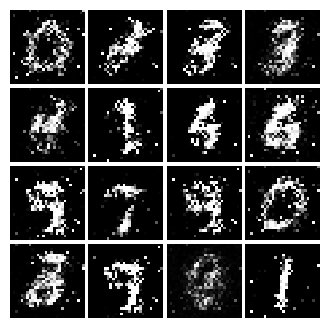

Epoch: 4, Iter: 2100, D: 0.2204, G:0.2281


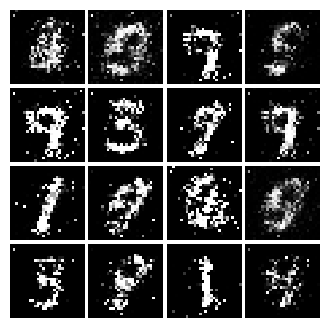

Epoch: 4, Iter: 2120, D: 0.2324, G:0.1869


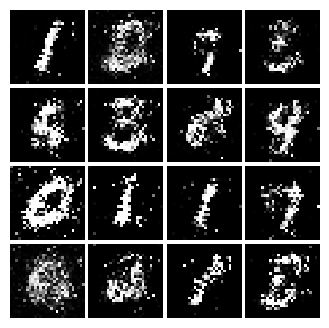

Epoch: 4, Iter: 2140, D: 0.2221, G:0.2078


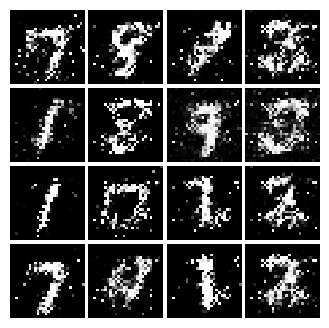

Epoch: 4, Iter: 2160, D: 0.2136, G:0.2182


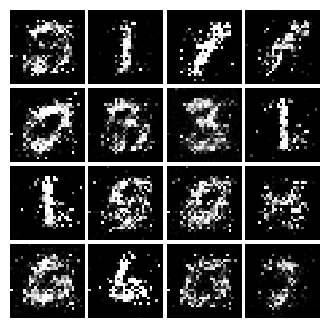

Epoch: 4, Iter: 2180, D: 0.2171, G:0.1646


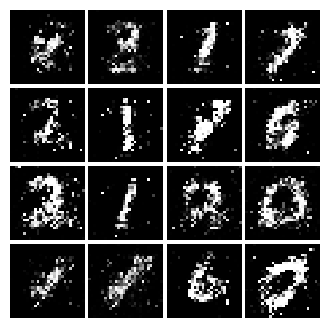

Epoch: 4, Iter: 2200, D: 0.1996, G:0.2184


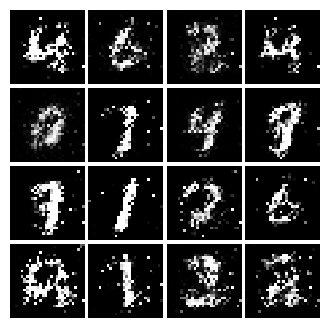

Epoch: 4, Iter: 2220, D: 0.2104, G:0.1945


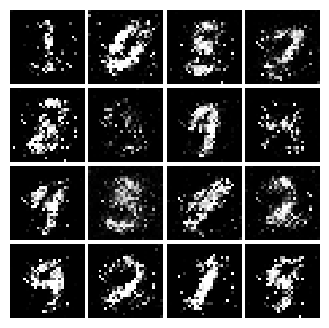

Epoch: 4, Iter: 2240, D: 0.9937, G:0.3063


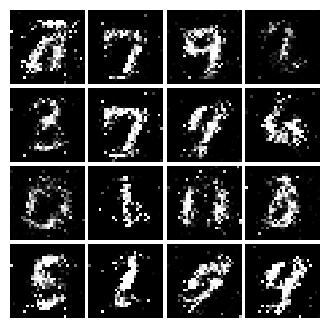

Epoch: 4, Iter: 2260, D: 0.228, G:0.213


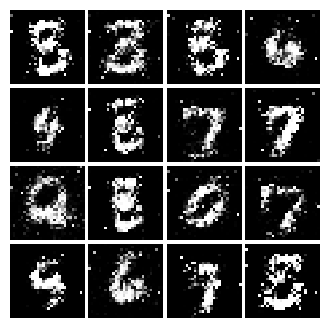

Epoch: 4, Iter: 2280, D: 0.2254, G:0.1657


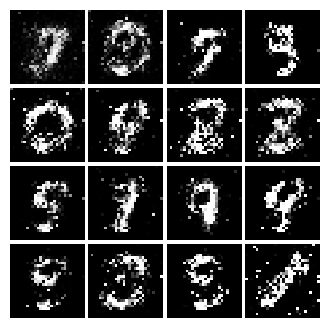

Epoch: 4, Iter: 2300, D: 0.2232, G:0.1826


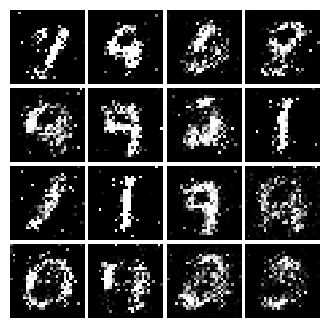

Epoch: 4, Iter: 2320, D: 0.2084, G:0.2089


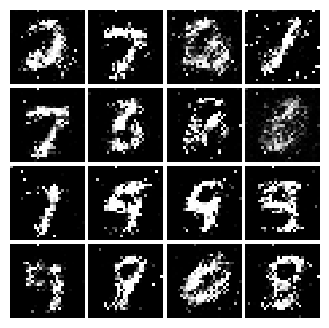

Epoch: 4, Iter: 2340, D: 0.2021, G:0.1763


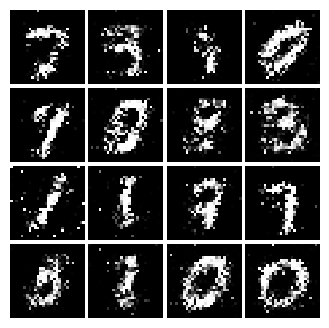

Epoch: 5, Iter: 2360, D: 0.1987, G:0.2009


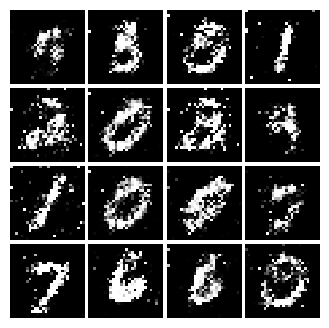

Epoch: 5, Iter: 2380, D: 0.253, G:0.1984


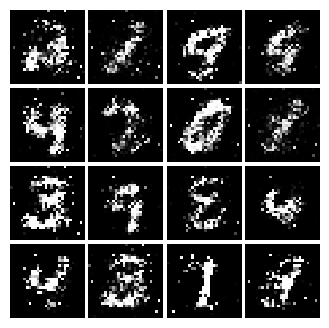

Epoch: 5, Iter: 2400, D: 0.2222, G:0.1893


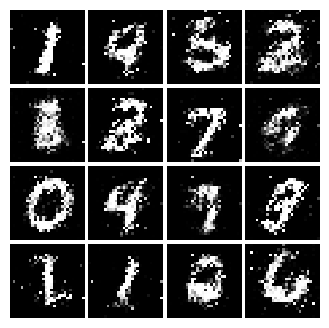

Epoch: 5, Iter: 2420, D: 0.2083, G:0.1764


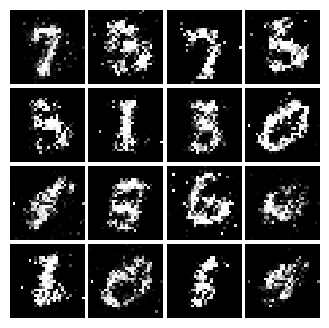

Epoch: 5, Iter: 2440, D: 0.2388, G:0.1683


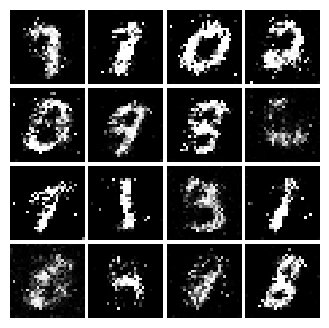

Epoch: 5, Iter: 2460, D: 0.1894, G:0.2019


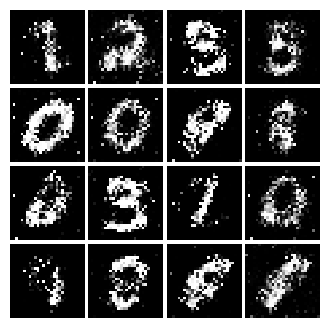

Epoch: 5, Iter: 2480, D: 0.2103, G:0.1548


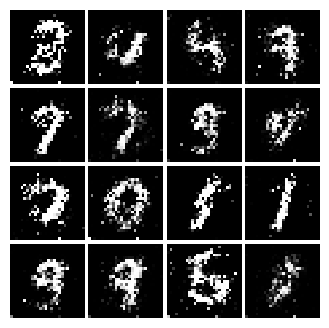

Epoch: 5, Iter: 2500, D: 0.2054, G:0.2536


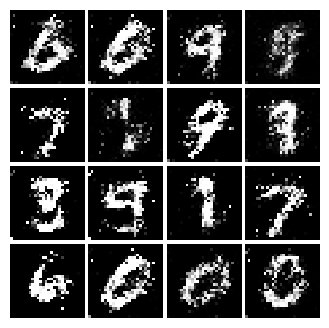

Epoch: 5, Iter: 2520, D: 0.248, G:0.1606


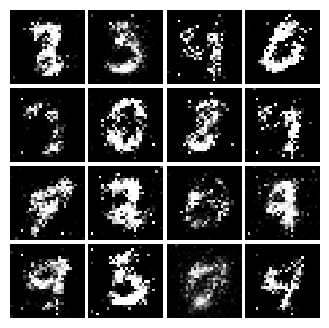

Epoch: 5, Iter: 2540, D: 0.2382, G:0.1669


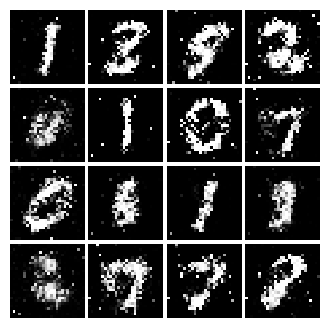

Epoch: 5, Iter: 2560, D: 0.2239, G:0.1946


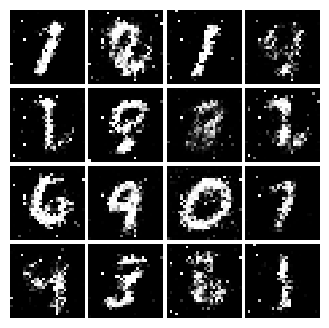

Epoch: 5, Iter: 2580, D: 0.2304, G:0.1976


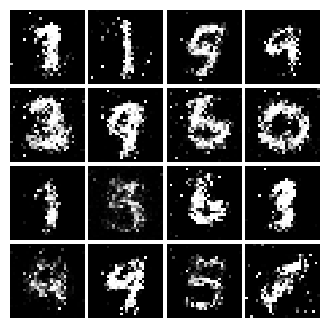

Epoch: 5, Iter: 2600, D: 0.2536, G:0.1624


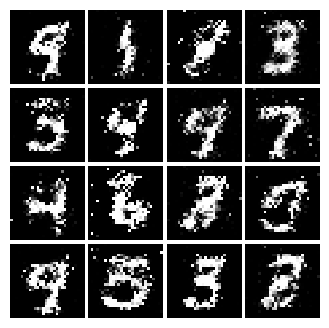

Epoch: 5, Iter: 2620, D: 0.2237, G:0.1576


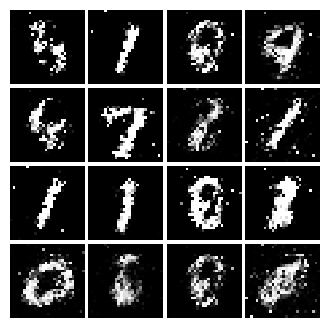

Epoch: 5, Iter: 2640, D: 0.219, G:0.2096


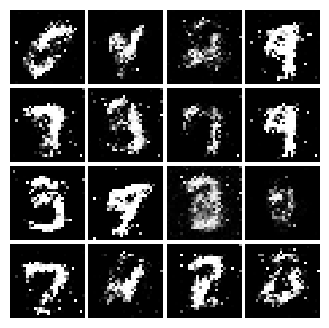

Epoch: 5, Iter: 2660, D: 0.221, G:0.1765


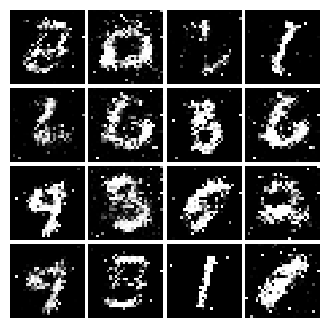

Epoch: 5, Iter: 2680, D: 0.2355, G:0.174


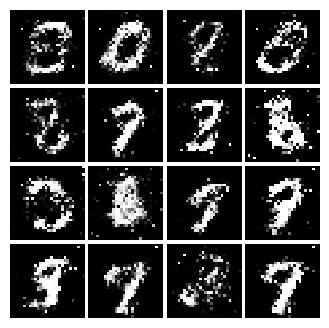

Epoch: 5, Iter: 2700, D: 0.1884, G:0.1885


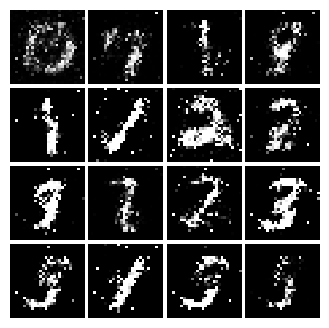

Epoch: 5, Iter: 2720, D: 0.2313, G:0.1486


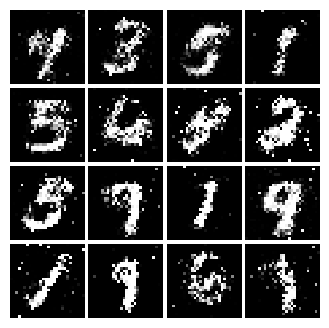

Epoch: 5, Iter: 2740, D: 0.2034, G:0.2274


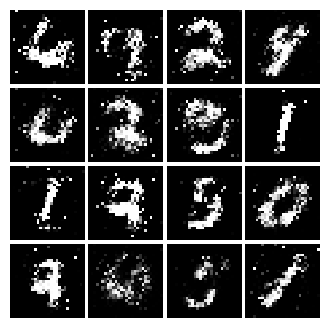

Epoch: 5, Iter: 2760, D: 0.2195, G:0.1641


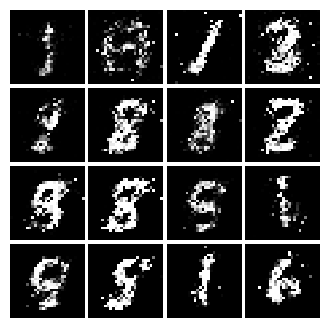

Epoch: 5, Iter: 2780, D: 0.2283, G:0.188


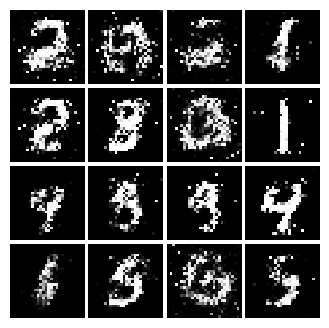

Epoch: 5, Iter: 2800, D: 0.2225, G:0.2128


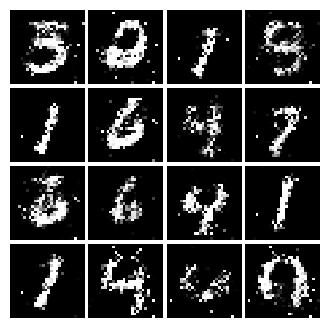

Epoch: 6, Iter: 2820, D: 0.222, G:0.156


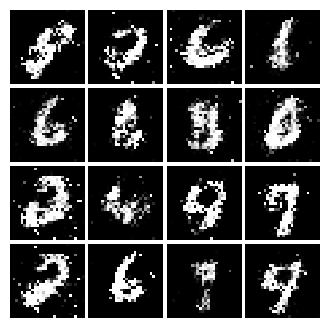

Epoch: 6, Iter: 2840, D: 0.2218, G:0.192


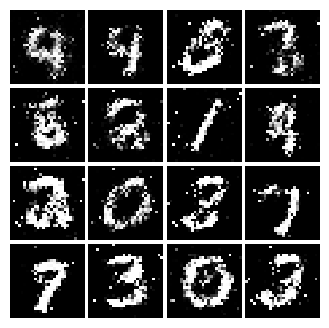

Epoch: 6, Iter: 2860, D: 0.198, G:0.1647


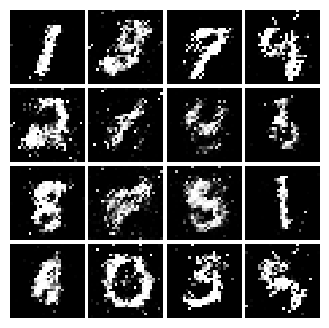

Epoch: 6, Iter: 2880, D: 0.2107, G:0.2288


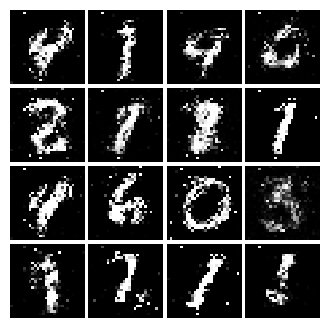

Epoch: 6, Iter: 2900, D: 0.2091, G:0.1844


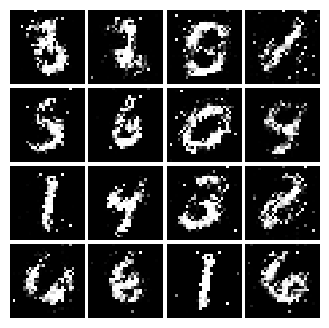

Epoch: 6, Iter: 2920, D: 0.2595, G:0.1718


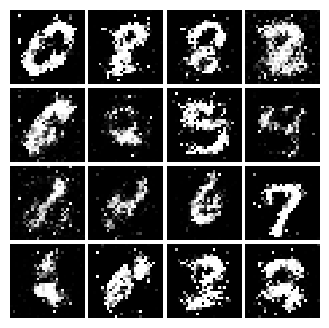

Epoch: 6, Iter: 2940, D: 0.2158, G:0.1775


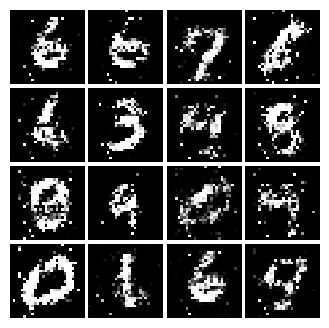

Epoch: 6, Iter: 2960, D: 0.2112, G:0.1782


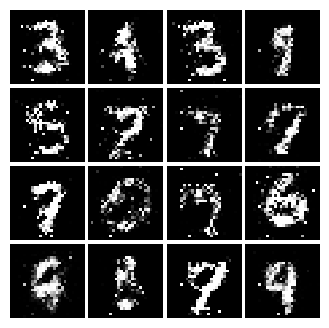

Epoch: 6, Iter: 2980, D: 0.2395, G:0.1794


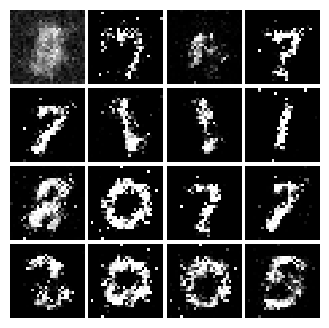

Epoch: 6, Iter: 3000, D: 0.225, G:0.1158


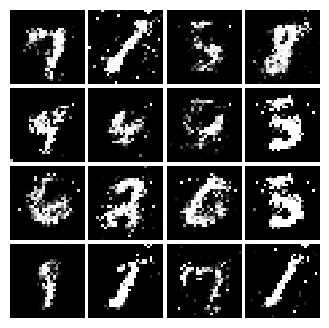

Epoch: 6, Iter: 3020, D: 0.2411, G:0.1797


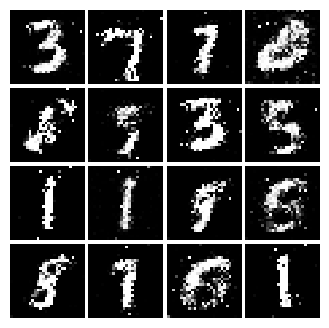

Epoch: 6, Iter: 3040, D: 0.2353, G:0.1636


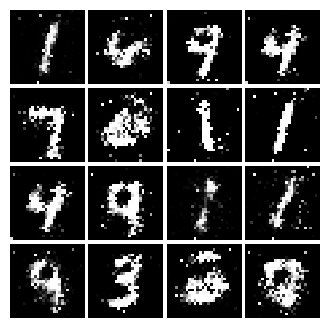

Epoch: 6, Iter: 3060, D: 0.2279, G:0.1607


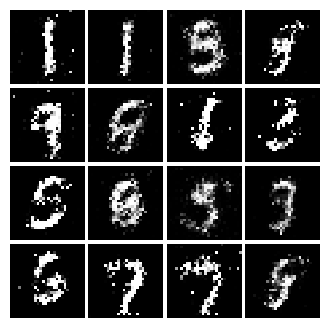

Epoch: 6, Iter: 3080, D: 0.2116, G:0.2073


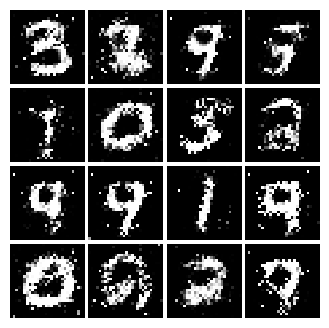

Epoch: 6, Iter: 3100, D: 0.2051, G:0.1527


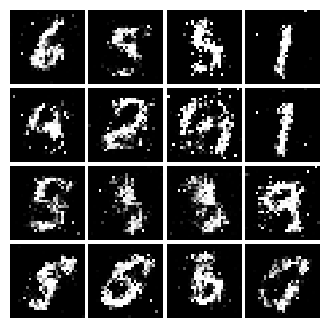

Epoch: 6, Iter: 3120, D: 0.2282, G:0.165


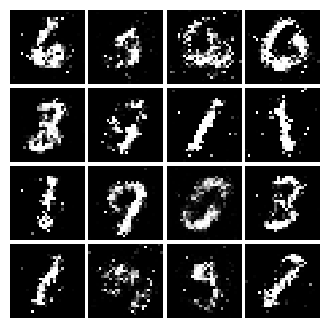

Epoch: 6, Iter: 3140, D: 0.2258, G:0.1505


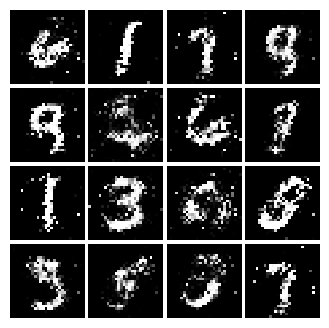

Epoch: 6, Iter: 3160, D: 0.2226, G:0.1727


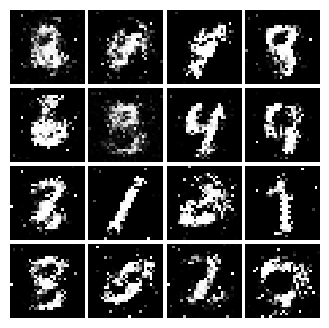

Epoch: 6, Iter: 3180, D: 0.1995, G:0.2008


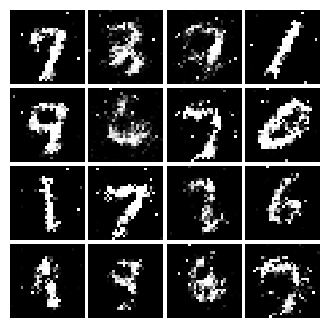

Epoch: 6, Iter: 3200, D: 0.2109, G:0.1861


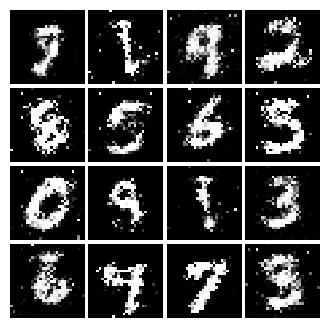

Epoch: 6, Iter: 3220, D: 0.2232, G:0.1704


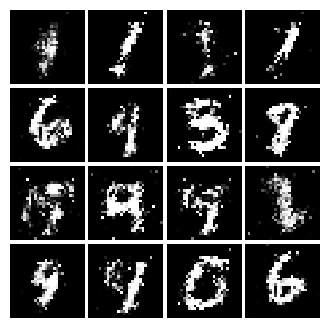

Epoch: 6, Iter: 3240, D: 0.2019, G:0.1492


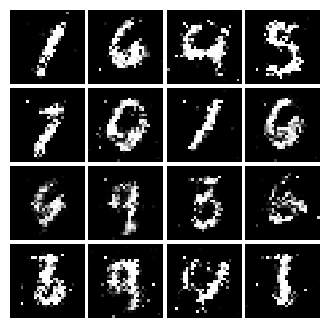

Epoch: 6, Iter: 3260, D: 0.2625, G:0.1749


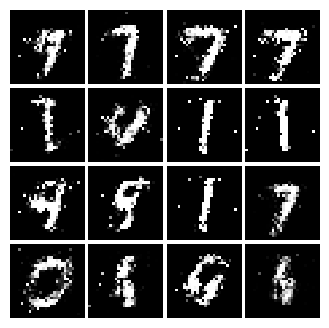

Epoch: 6, Iter: 3280, D: 0.2049, G:0.2105


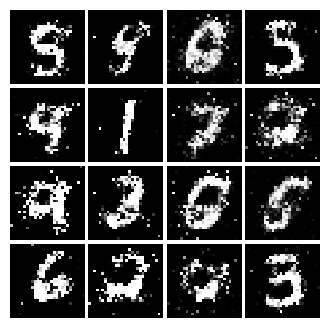

Epoch: 7, Iter: 3300, D: 0.1984, G:0.2156


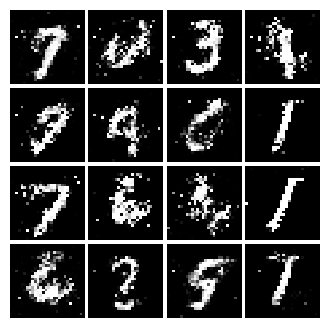

Epoch: 7, Iter: 3320, D: 0.219, G:0.1391


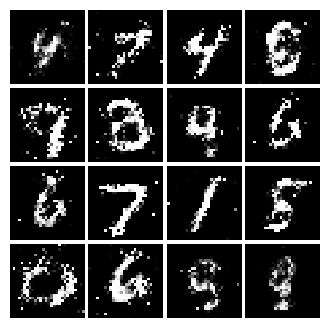

Epoch: 7, Iter: 3340, D: 0.2093, G:0.2212


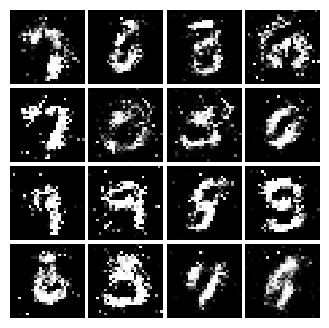

Epoch: 7, Iter: 3360, D: 0.2239, G:0.1931


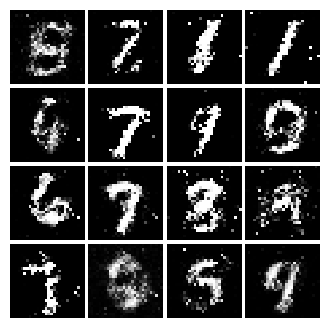

Epoch: 7, Iter: 3380, D: 0.223, G:0.1504


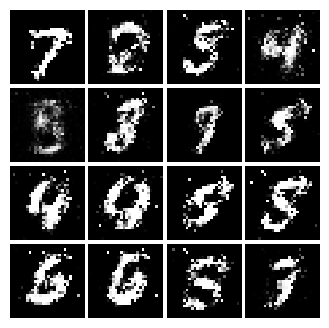

Epoch: 7, Iter: 3400, D: 0.2307, G:0.178


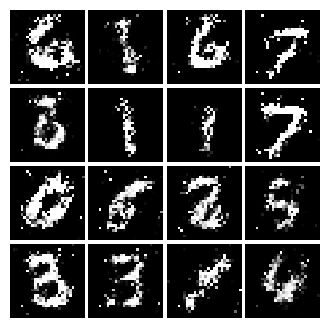

Epoch: 7, Iter: 3420, D: 0.2159, G:0.1845


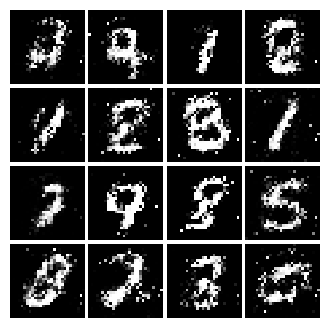

Epoch: 7, Iter: 3440, D: 0.237, G:0.1786


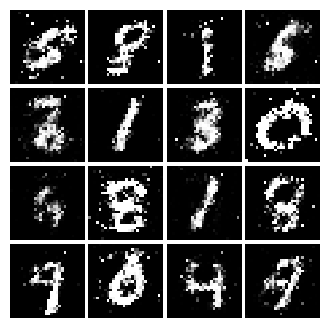

Epoch: 7, Iter: 3460, D: 0.1951, G:0.1959


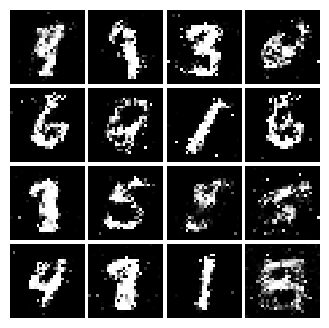

Epoch: 7, Iter: 3480, D: 0.2297, G:0.1726


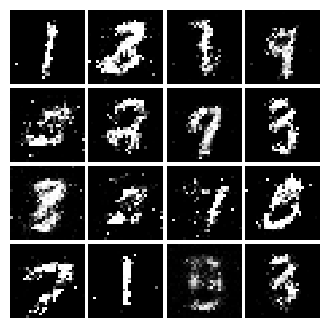

Epoch: 7, Iter: 3500, D: 0.2453, G:0.2096


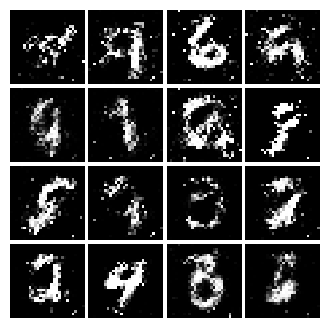

Epoch: 7, Iter: 3520, D: 0.2428, G:0.1471


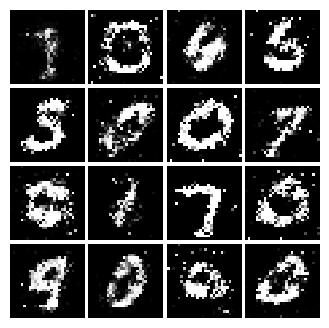

Epoch: 7, Iter: 3540, D: 0.2125, G:0.1799


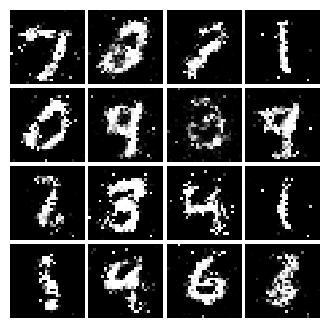

Epoch: 7, Iter: 3560, D: 0.2092, G:0.1631


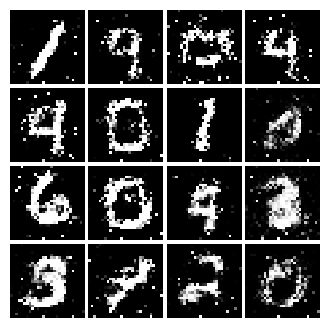

Epoch: 7, Iter: 3580, D: 0.2351, G:0.1814


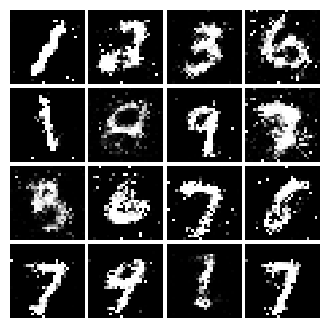

Epoch: 7, Iter: 3600, D: 0.2381, G:0.1817


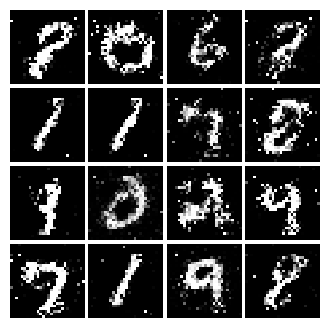

Epoch: 7, Iter: 3620, D: 0.2206, G:0.1853


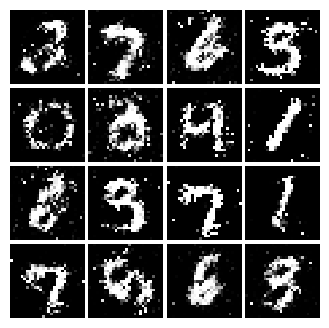

Epoch: 7, Iter: 3640, D: 0.2387, G:0.1677


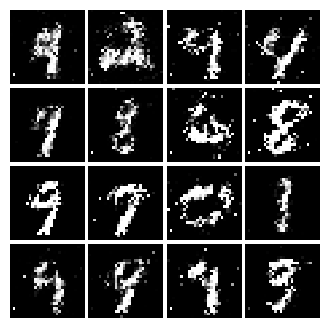

Epoch: 7, Iter: 3660, D: 0.2159, G:0.1758


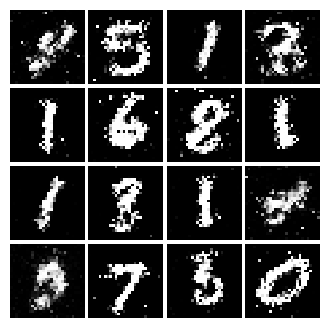

Epoch: 7, Iter: 3680, D: 0.2292, G:0.1656


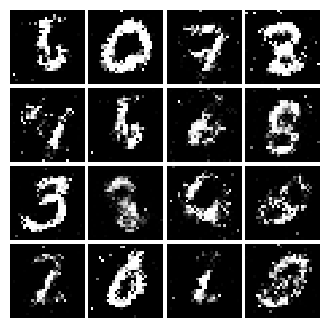

Epoch: 7, Iter: 3700, D: 0.216, G:0.2103


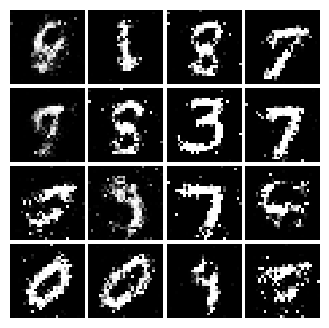

Epoch: 7, Iter: 3720, D: 0.2256, G:0.185


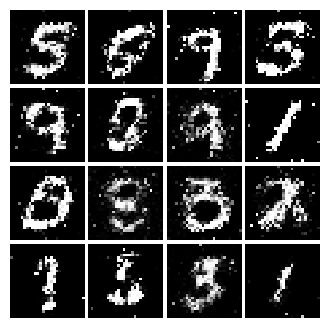

Epoch: 7, Iter: 3740, D: 0.2547, G:0.1622


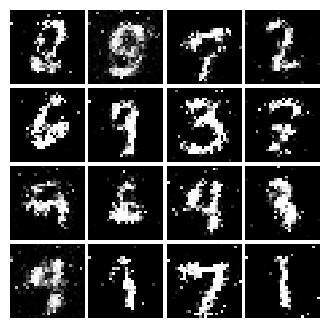

Epoch: 8, Iter: 3760, D: 0.2293, G:0.2189


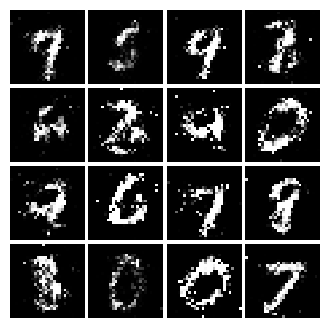

Epoch: 8, Iter: 3780, D: 0.2156, G:0.1688


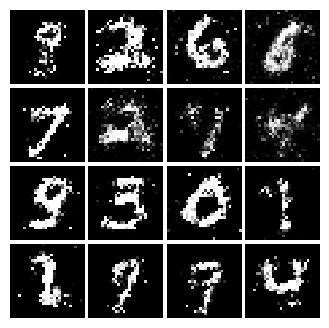

Epoch: 8, Iter: 3800, D: 0.2405, G:0.1768


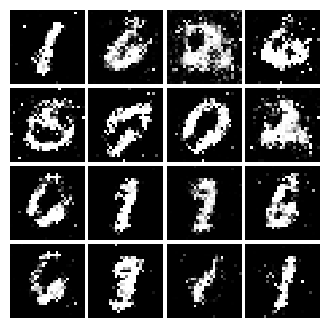

Epoch: 8, Iter: 3820, D: 0.2293, G:0.1646


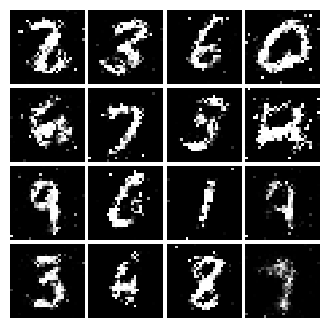

Epoch: 8, Iter: 3840, D: 0.2235, G:0.1699


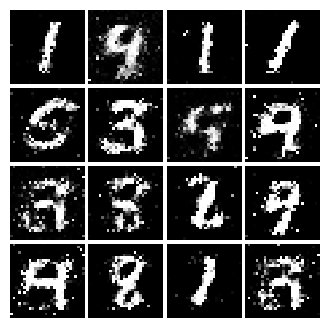

Epoch: 8, Iter: 3860, D: 0.2222, G:0.1886


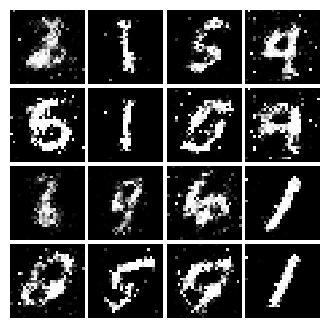

Epoch: 8, Iter: 3880, D: 0.2373, G:0.1545


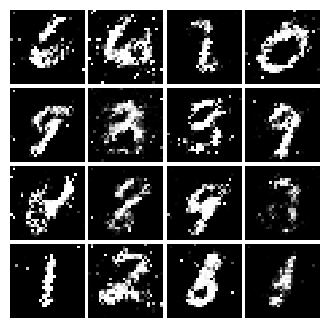

Epoch: 8, Iter: 3900, D: 0.2498, G:0.1684


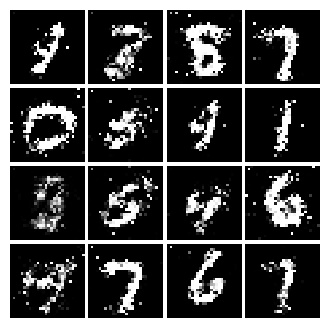

Epoch: 8, Iter: 3920, D: 0.2105, G:0.1637


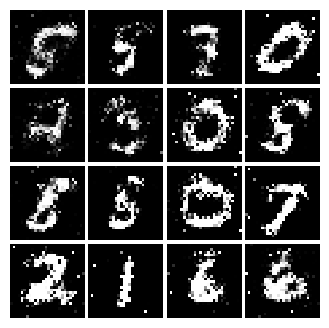

Epoch: 8, Iter: 3940, D: 0.2437, G:0.1597


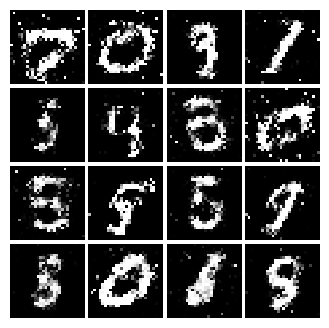

Epoch: 8, Iter: 3960, D: 0.2138, G:0.1747


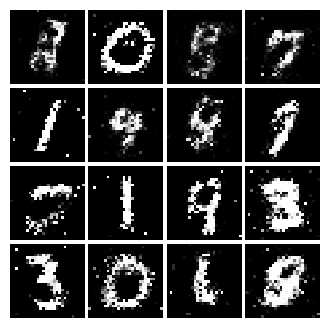

Epoch: 8, Iter: 3980, D: 0.2125, G:0.1771


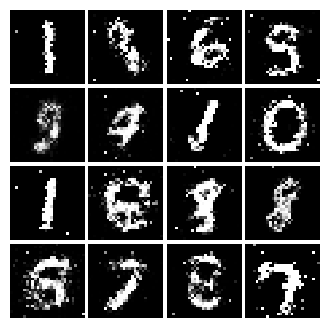

Epoch: 8, Iter: 4000, D: 0.2309, G:0.1637


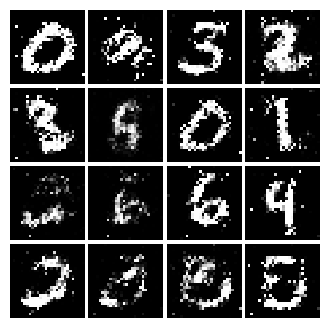

Epoch: 8, Iter: 4020, D: 0.2055, G:0.1833


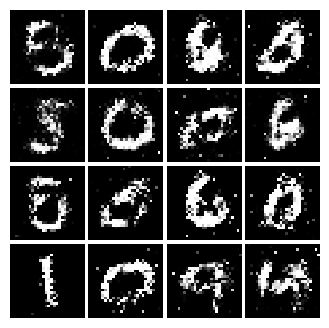

Epoch: 8, Iter: 4040, D: 0.2556, G:0.185


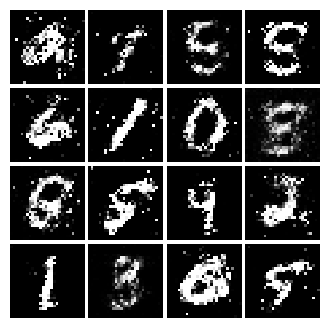

Epoch: 8, Iter: 4060, D: 0.2221, G:0.1579


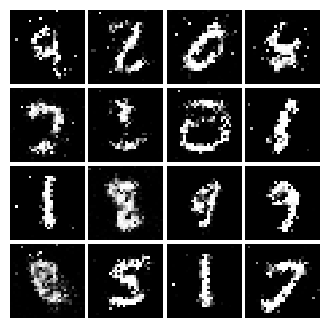

Epoch: 8, Iter: 4080, D: 0.2433, G:0.1365


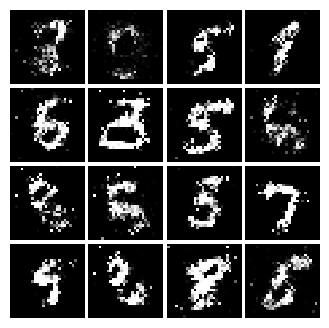

Epoch: 8, Iter: 4100, D: 0.2255, G:0.175


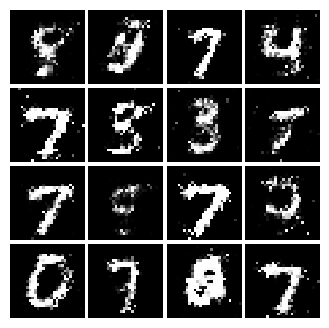

Epoch: 8, Iter: 4120, D: 0.23, G:0.2068


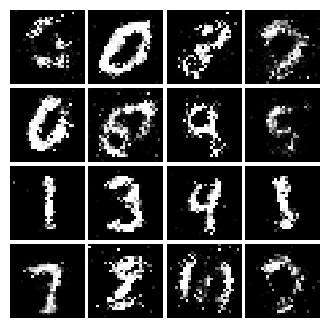

Epoch: 8, Iter: 4140, D: 0.2257, G:0.1669


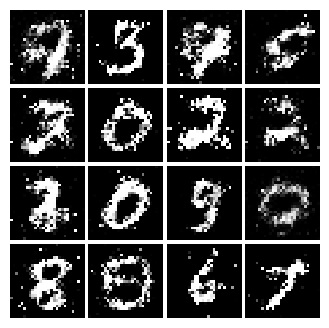

Epoch: 8, Iter: 4160, D: 0.2415, G:0.1793


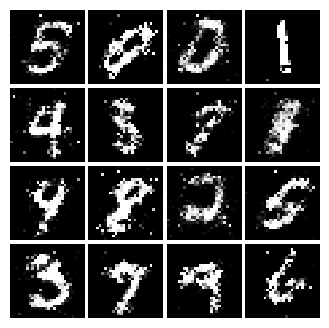

Epoch: 8, Iter: 4180, D: 0.2274, G:0.1408


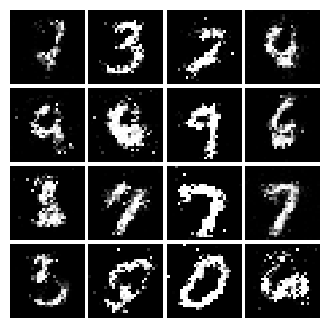

Epoch: 8, Iter: 4200, D: 0.2231, G:0.175


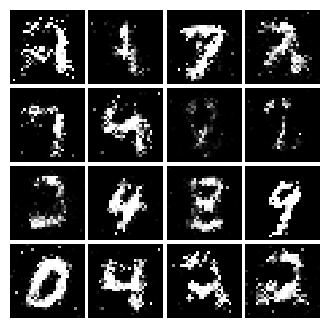

Epoch: 8, Iter: 4220, D: 0.2034, G:0.2004


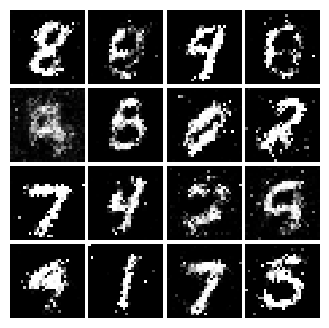

Epoch: 9, Iter: 4240, D: 0.2485, G:0.1594


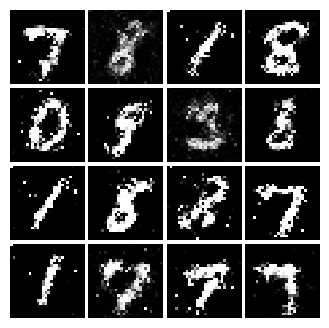

Epoch: 9, Iter: 4260, D: 0.2333, G:0.1438


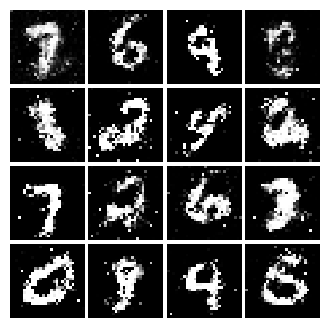

Epoch: 9, Iter: 4280, D: 0.2351, G:0.1981


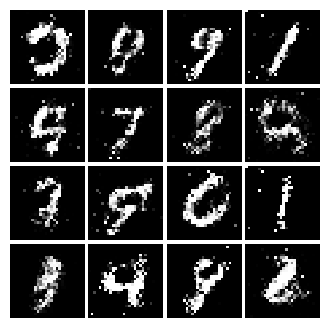

Epoch: 9, Iter: 4300, D: 0.2339, G:0.1522


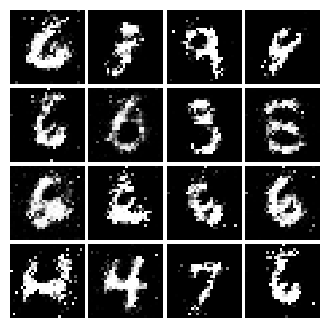

Epoch: 9, Iter: 4320, D: 0.2438, G:0.1299


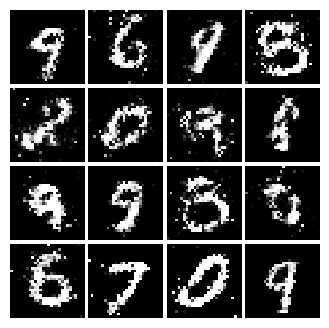

Epoch: 9, Iter: 4340, D: 0.2482, G:0.1586


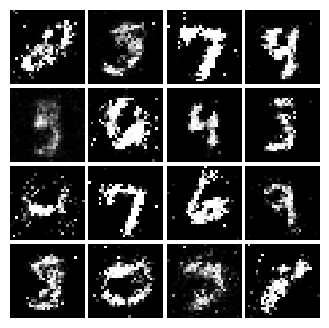

Epoch: 9, Iter: 4360, D: 0.2307, G:0.1733


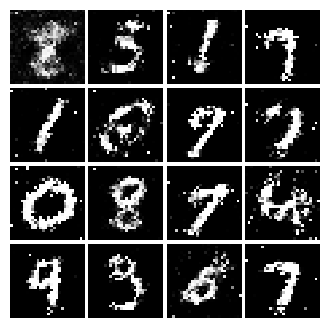

Epoch: 9, Iter: 4380, D: 0.2426, G:0.1573


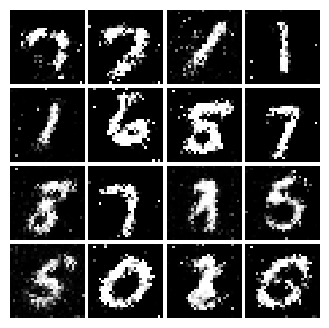

Epoch: 9, Iter: 4400, D: 0.2187, G:0.1911


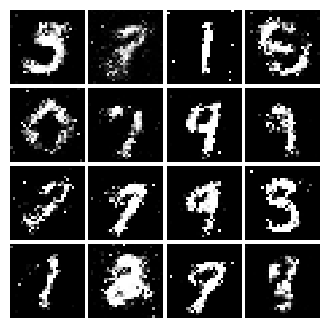

Epoch: 9, Iter: 4420, D: 0.2274, G:0.1748


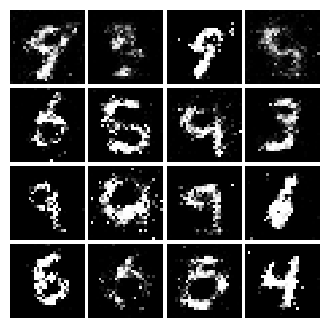

Epoch: 9, Iter: 4440, D: 0.2447, G:0.1559


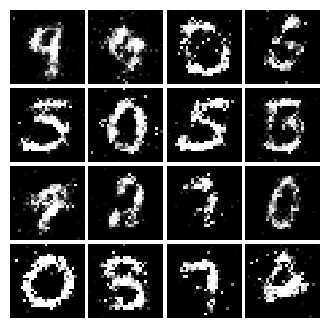

Epoch: 9, Iter: 4460, D: 0.2249, G:0.161


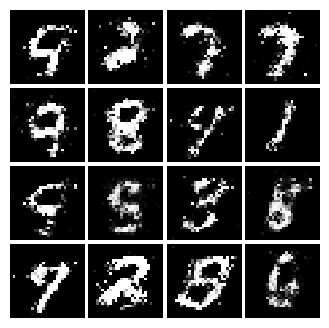

Epoch: 9, Iter: 4480, D: 0.2492, G:0.179


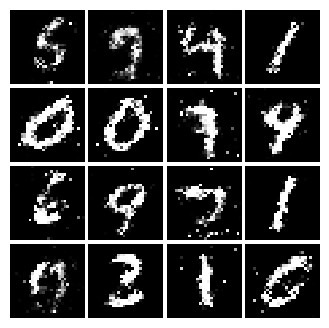

Epoch: 9, Iter: 4500, D: 0.2817, G:0.1701


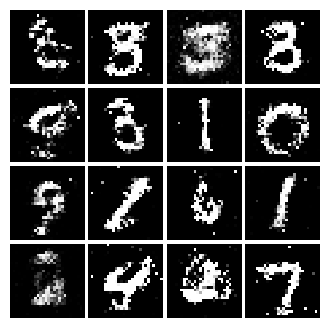

Epoch: 9, Iter: 4520, D: 0.2662, G:0.1651


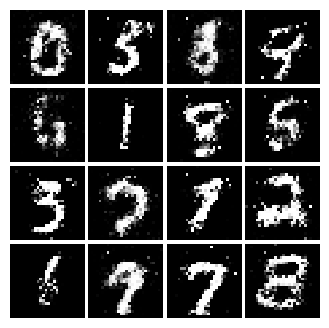

Epoch: 9, Iter: 4540, D: 0.2399, G:0.1816


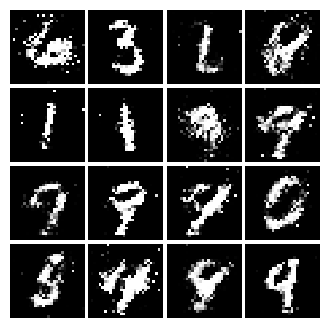

Epoch: 9, Iter: 4560, D: 0.2484, G:0.1501


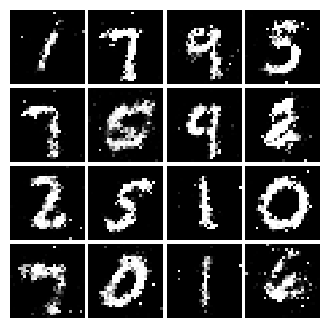

Epoch: 9, Iter: 4580, D: 0.2609, G:0.1652


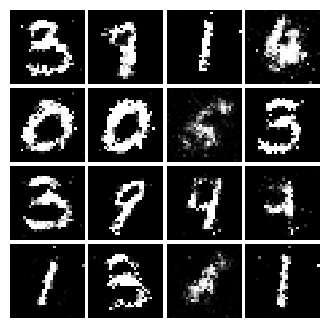

Epoch: 9, Iter: 4600, D: 0.2353, G:0.1777


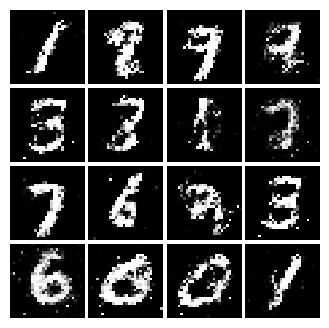

Epoch: 9, Iter: 4620, D: 0.2412, G:0.1548


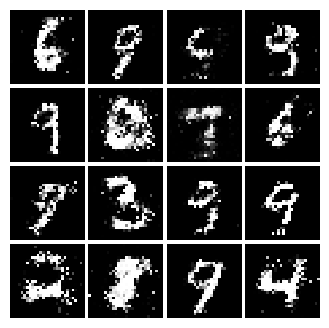

Epoch: 9, Iter: 4640, D: 0.2349, G:0.167


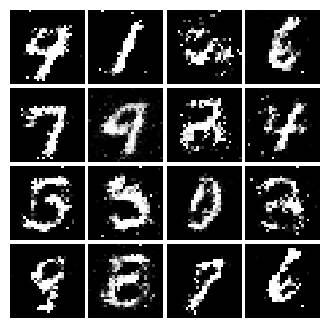

Epoch: 9, Iter: 4660, D: 0.2464, G:0.1494


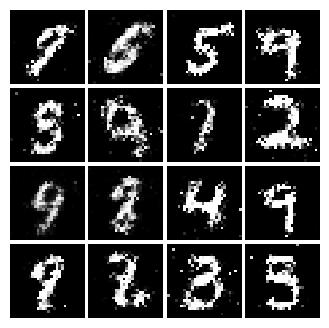

Epoch: 9, Iter: 4680, D: 0.2184, G:0.1721


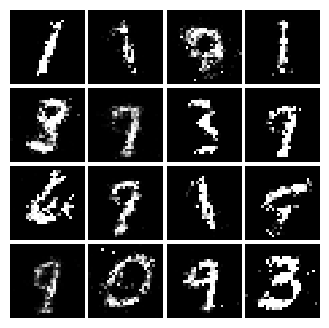

Final images


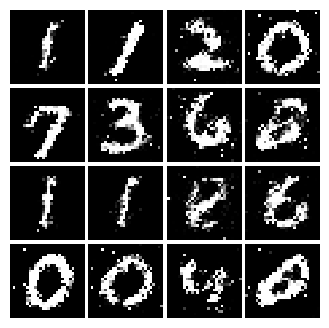

In [39]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_optimizer, G_optimizer = get_optimizers()

# Run it!
run_a_gan(D, G, D_optimizer, G_optimizer, ls_discriminator_loss, ls_generator_loss)

# Part II - Deep Convolutional GANs
In the first part of the notebook, we implemented an almost direct copy of the original GAN network from Ian Goodfellow. However, this network architecture allows no real spatial reasoning. It is unable to reason about things like "sharp edges" in general because it lacks any convolutional layers. Thus, in this section, we will implement some of the ideas from [DCGAN](https://arxiv.org/abs/1511.06434), where we use convolutional networks as our discriminators and generators.

#### Discriminator
We will use a discriminator inspired by the TensorFlow MNIST classification [tutorial](https://www.tensorflow.org/get_started/mnist/pros), which is able to get above 99% accuracy on the MNIST dataset fairly quickly. *Be sure to check the dimensions of x and reshape when needed*, fully connected blocks expect [N,D] Tensors while conv2d blocks expect [N,H,W,C] Tensors. Please use `tf.keras.layers` to define the following architecture:

Architecture:
* Conv2D: 32 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Conv2D: 64 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Flatten
* Fully Connected with output size 4 x 4 x 64
* Leaky ReLU(alpha=0.01)
* Fully Connected with output size 1

Once again, please use biases for all convolutional and fully connected layers, and use the default parameter initializers. Note that a padding of 0 can be accomplished with the 'VALID' padding option.

In [40]:
def discriminator():
    """Compute discriminator score for a batch of input images.

    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]

    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        ###############################################################
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        ###############################################################

        # Conv2D: 32 Filters, 5x5, Stride 1, padding 0
        tf.keras.layers.Reshape((28, 28, 1), input_shape=(784,)),
        tf.keras.layers.Conv2D(32, (5, 5), strides=(1, 1), padding='valid'),

        # Leaky ReLU(alpha=0.01)
        tf.keras.layers.LeakyReLU(alpha=0.01),

        # Max Pool 2x2, Stride 2
        tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=(2, 2)),

        # Conv2D: 64 Filters, 5x5, Stride 1, padding 0
        tf.keras.layers.Conv2D(64, (5, 5), strides=(1, 1), padding='valid'),

        # Leaky ReLU(alpha=0.01)
        tf.keras.layers.LeakyReLU(alpha=0.01),

        # Max Pool 2x2, Stride 2
        tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=(2, 2)),

        # Flatten
        tf.keras.layers.Flatten(),

        # Fully Connected with output size 4 x 4 x 64
        tf.keras.layers.Dense(4*4*64),

        # Leaky ReLU(alpha=0.01)
        tf.keras.layers.LeakyReLU(alpha=0.01),

        # Fully Connected with output size 1
        tf.keras.layers.Dense(1)

        #############################################################
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        #############################################################
    ])

    return model

model = discriminator()
test_discriminator(1102721)

Correct number of parameters in discriminator.


#### Generator
For the generator, we will copy the architecture exactly from the [InfoGAN paper](https://arxiv.org/pdf/1606.03657.pdf). See Appendix C.1 MNIST. Please use `tf.keras.layers` for your implementation. You might find the documentation for [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers/Conv2DTranspose) useful. The architecture is as follows.

Architecture:
* Fully connected with output size 1024
* `ReLU`
* BatchNorm
* Fully connected with output size 7 x 7 x 128
* `ReLU`
* BatchNorm
* Resize into Image Tensor of size 7, 7, 128
* Conv2D^T (transpose): 64 filters of 4x4, stride 2
* `ReLU`
* BatchNorm
* Conv2d^T (transpose): 1 filter of 4x4, stride 2
* `TanH`

Once again, use biases for the fully connected and transpose convolutional layers. Please use the default initializers for your parameters. For padding, choose the 'same' option for transpose convolutions. For Batch Normalization, assume we are always in 'training' mode.

In [41]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.

    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]

    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        ###############################################################
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        ###############################################################

        # Fully connected with output size 1024
        tf.keras.layers.Dense(1024, input_shape=(noise_dim,)),

        # ReLU
        tf.keras.layers.ReLU(),

        # BatchNorm
        tf.keras.layers.BatchNormalization(),

        # Fully connected with output size 7 x 7 x 128
        tf.keras.layers.Dense(7*7*128),

        # ReLU
        tf.keras.layers.ReLU(),

        # BatchNorm
        tf.keras.layers.BatchNormalization(),

        # Resize into Image Tensor of size 7, 7, 128
        tf.keras.layers.Reshape((7, 7, 128)),

        # Conv2D^T (transpose): 64 filters of 4x4, stride 2
        tf.keras.layers.Conv2DTranspose(64, (4, 4), strides=(2, 2), padding='same'),

        # ReLU
        tf.keras.layers.ReLU(),

        # BatchNorm
        tf.keras.layers.BatchNormalization(),

        # Conv2d^T (transpose): 1 filter of 4x4, stride 2
        tf.keras.layers.Conv2DTranspose(1, (4, 4), strides=(2, 2), padding='same'),

        # TanH
        tf.keras.layers.Activation('tanh')

        #############################################################
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        #############################################################
    ])

    return model

test_generator(6595521)

Correct number of parameters in generator.


We have to recreate our network since we've changed our functions.

### Train and evaluate a DCGAN
This is the one part of A3 that significantly benefits from using a GPU. It takes 3 minutes on a GPU for the requested five epochs. Or about 50 minutes on a dual core laptop on CPU (feel free to use 3 epochs if you do it on CPU).

Epoch: 0, Iter: 0, D: 1.423, G:0.6561


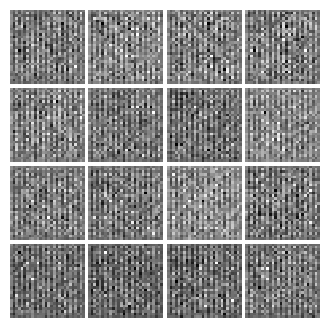

Epoch: 0, Iter: 20, D: 0.26, G:1.785


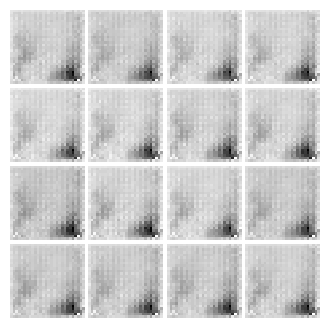

Epoch: 0, Iter: 40, D: 0.006828, G:5.112


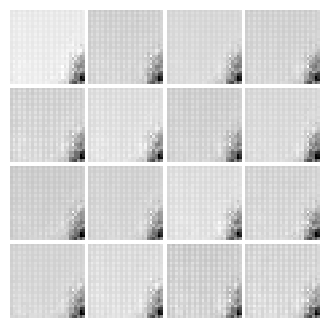

Epoch: 0, Iter: 60, D: 0.001555, G:6.536


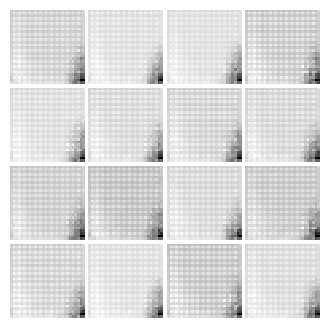

Epoch: 0, Iter: 80, D: 0.0007277, G:7.269


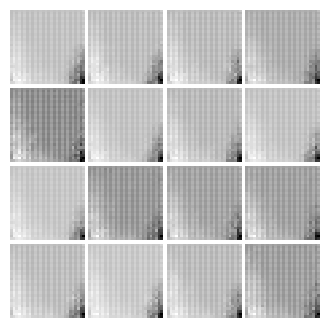

Epoch: 0, Iter: 100, D: 0.000428, G:7.8


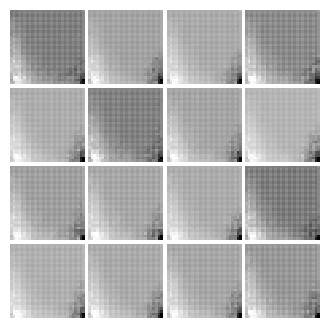

Epoch: 0, Iter: 120, D: 0.0002832, G:8.2


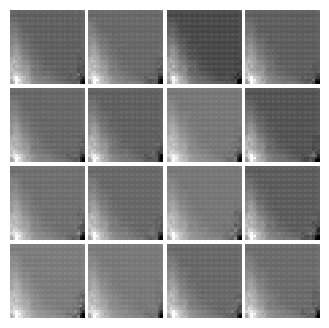

Epoch: 0, Iter: 140, D: 0.0001997, G:8.541


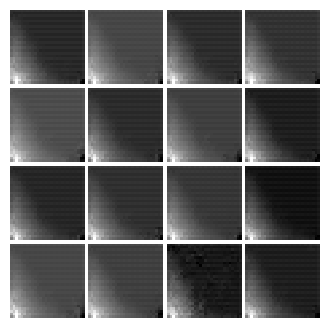

Epoch: 0, Iter: 160, D: 0.0001473, G:8.857


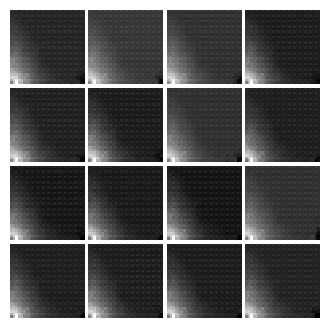

Epoch: 0, Iter: 180, D: 0.0001151, G:9.1


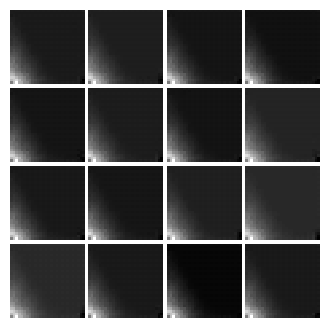

Epoch: 0, Iter: 200, D: 9.097e-05, G:9.323


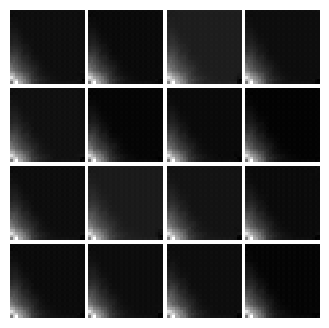

Epoch: 0, Iter: 220, D: 7.572e-05, G:9.519


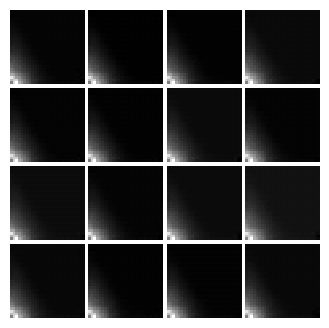

Epoch: 0, Iter: 240, D: 6.436e-05, G:9.696


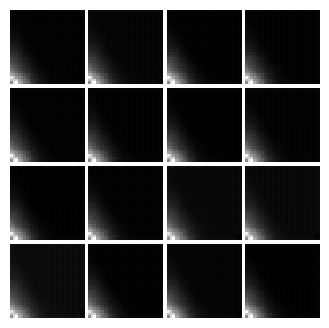

Epoch: 0, Iter: 260, D: 5.638e-05, G:9.866


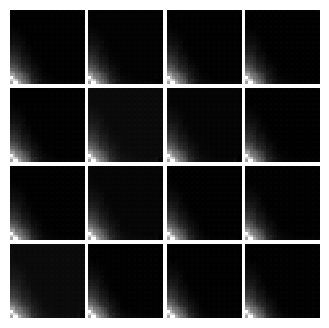

Epoch: 0, Iter: 280, D: 4.523e-05, G:10.03


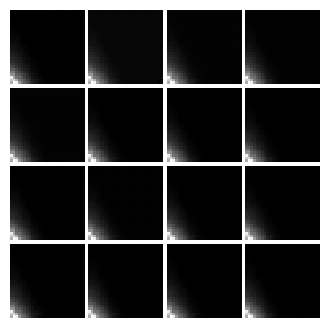

Epoch: 0, Iter: 300, D: 3.859e-05, G:10.19


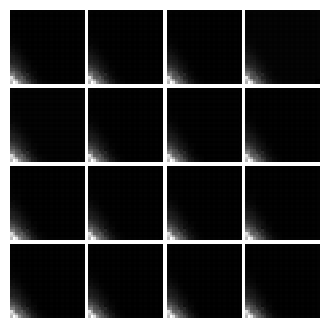

Epoch: 0, Iter: 320, D: 3.441e-05, G:10.31


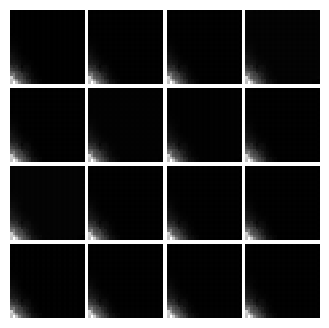

Epoch: 0, Iter: 340, D: 3.092e-05, G:10.4


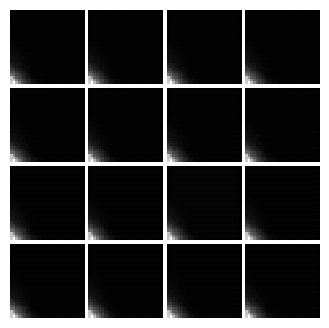

Epoch: 0, Iter: 360, D: 2.857e-05, G:10.53


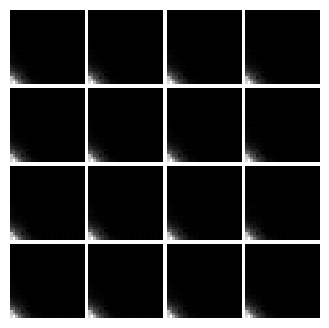

Epoch: 0, Iter: 380, D: 2.419e-05, G:10.64


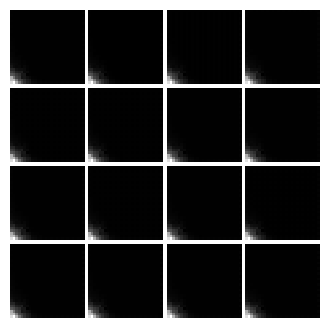

Epoch: 0, Iter: 400, D: 2.201e-05, G:10.74


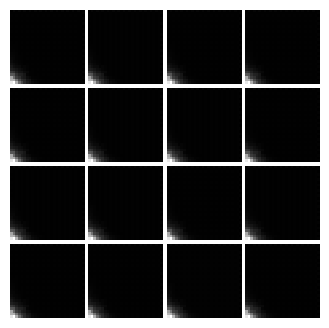

Epoch: 0, Iter: 420, D: 2.033e-05, G:10.84


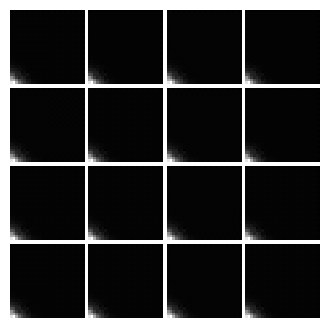

Epoch: 0, Iter: 440, D: 1.791e-05, G:10.95


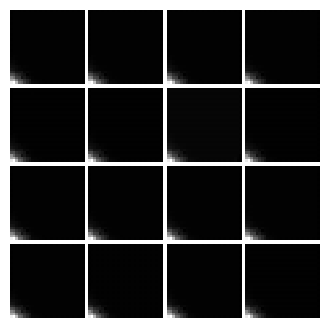

Epoch: 0, Iter: 460, D: 1.714e-05, G:11.01


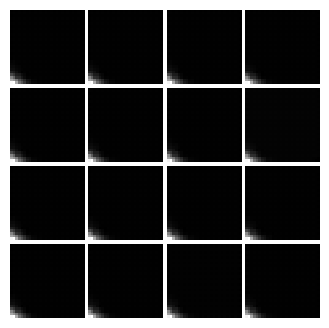

Epoch: 1, Iter: 480, D: 1.574e-05, G:11.11


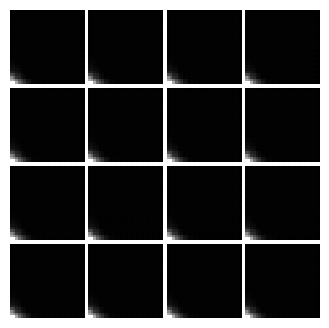

Epoch: 1, Iter: 500, D: 1.378e-05, G:11.21


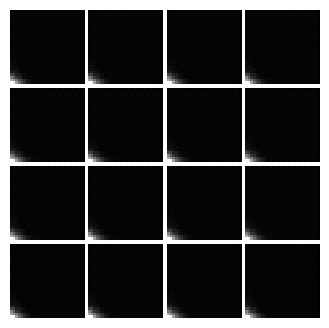

Epoch: 1, Iter: 520, D: 1.252e-05, G:11.3


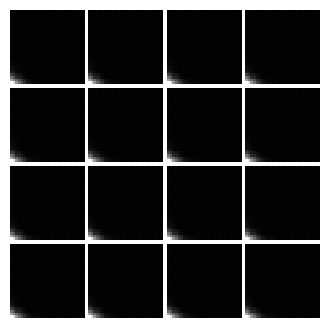

Epoch: 1, Iter: 540, D: 1.169e-05, G:11.38


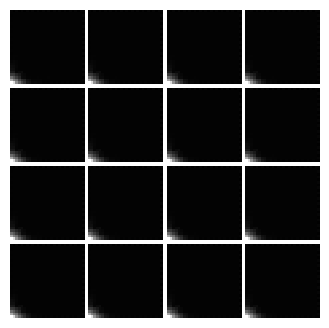

Epoch: 1, Iter: 560, D: 1.132e-05, G:11.46


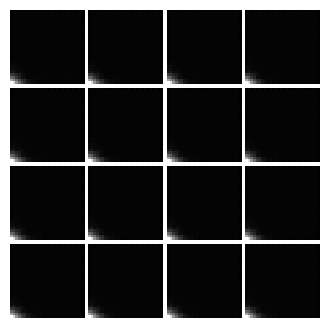

Epoch: 1, Iter: 580, D: 9.955e-06, G:11.54


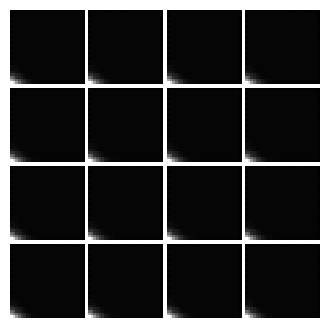

Epoch: 1, Iter: 600, D: 1.083e-05, G:11.6


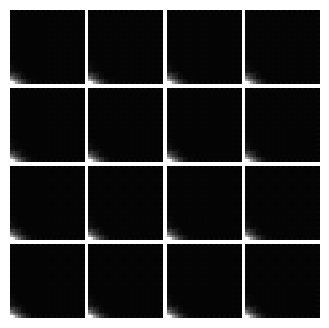

Epoch: 1, Iter: 620, D: 9.432e-06, G:11.67


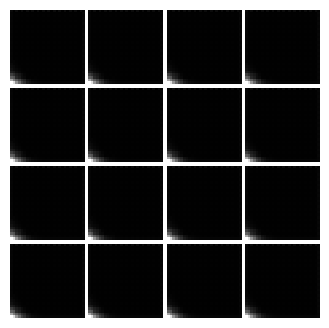

Epoch: 1, Iter: 640, D: 8.052e-06, G:11.74


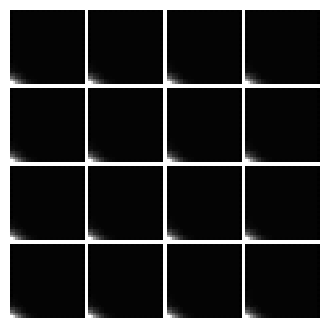

Epoch: 1, Iter: 660, D: 8.049e-06, G:11.8


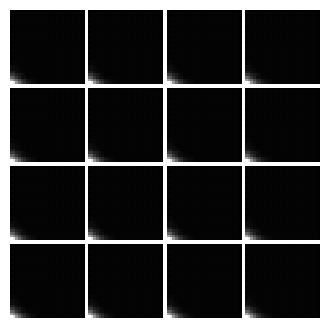

Epoch: 1, Iter: 680, D: 1.222e-05, G:11.86


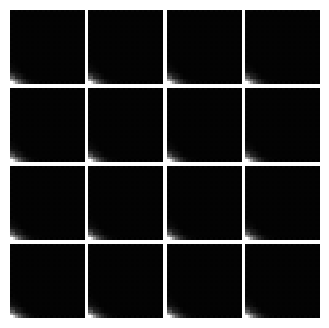

Epoch: 1, Iter: 700, D: 1.521e-05, G:11.11


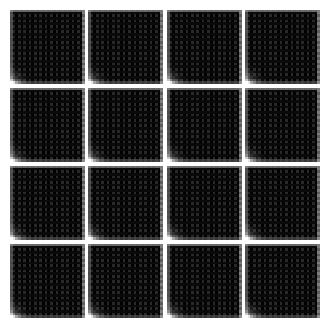

Epoch: 1, Iter: 720, D: 0.2367, G:1.624


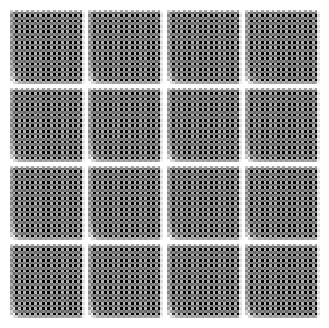

Epoch: 1, Iter: 740, D: 0.05598, G:2.976


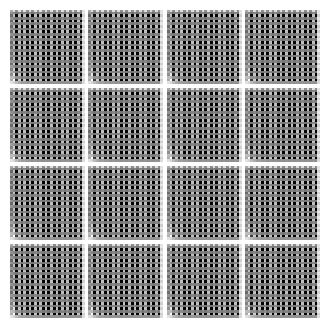

Epoch: 1, Iter: 760, D: 0.01825, G:4.059


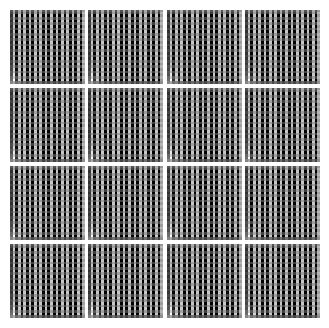

Epoch: 1, Iter: 780, D: 0.008675, G:4.783


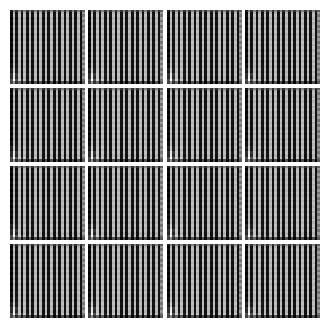

Epoch: 1, Iter: 800, D: 0.005028, G:5.319


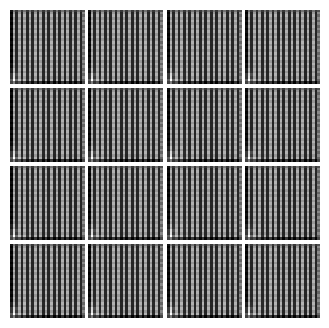

Epoch: 1, Iter: 820, D: 0.003311, G:5.731


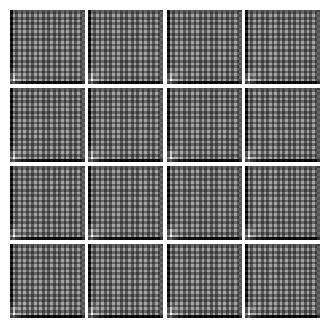

Epoch: 1, Iter: 840, D: 0.00232, G:6.084


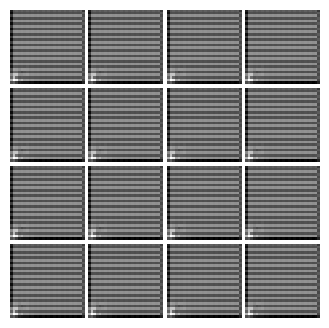

Epoch: 1, Iter: 860, D: 0.001701, G:6.392


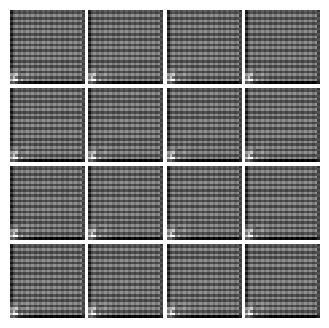

Epoch: 1, Iter: 880, D: 0.001292, G:6.665


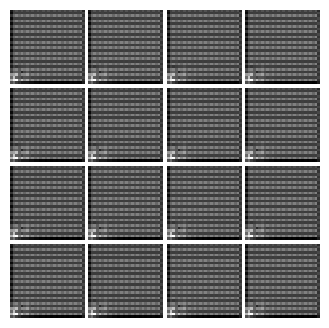

Epoch: 1, Iter: 900, D: 0.001008, G:6.912


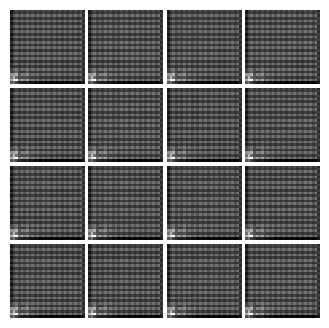

Epoch: 1, Iter: 920, D: 0.0008018, G:7.14


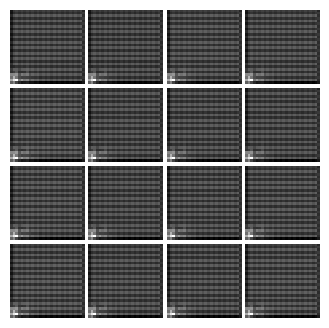

Epoch: 2, Iter: 940, D: 0.0006571, G:7.338


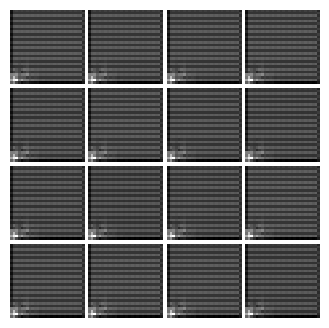

Epoch: 2, Iter: 960, D: 0.0005439, G:7.526


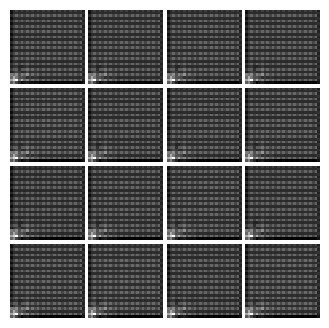

Epoch: 2, Iter: 980, D: 0.0004623, G:7.688


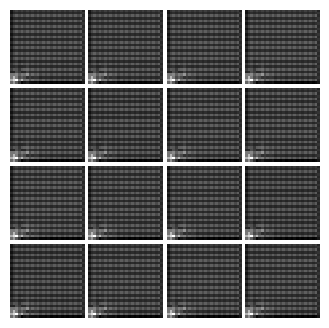

Epoch: 2, Iter: 1000, D: 0.0003907, G:7.855


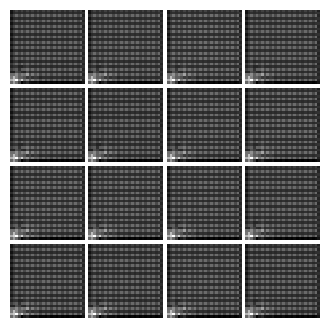

Epoch: 2, Iter: 1020, D: 0.0003419, G:7.988


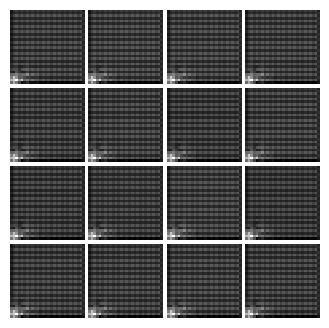

Epoch: 2, Iter: 1040, D: 0.0002993, G:8.121


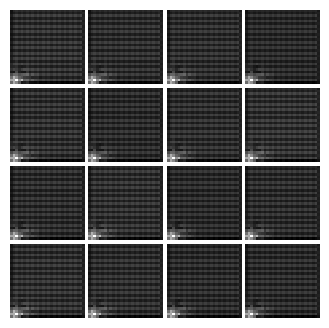

Epoch: 2, Iter: 1060, D: 0.0002645, G:8.244


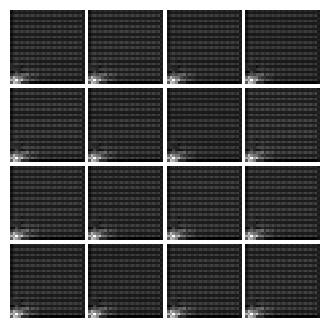

Epoch: 2, Iter: 1080, D: 15.87, G:0.4794


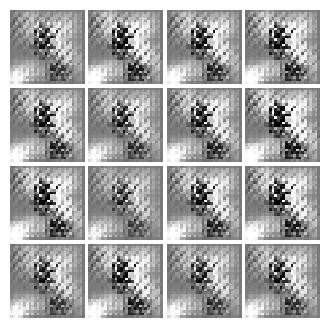

Epoch: 2, Iter: 1100, D: 0.3751, G:5.307


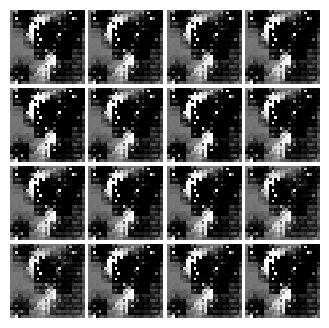

Epoch: 2, Iter: 1120, D: 1.548, G:1.381


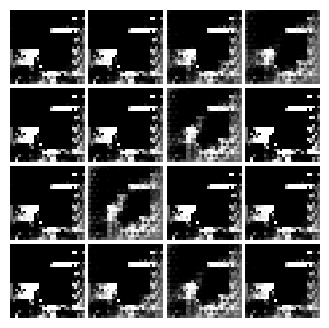

Epoch: 2, Iter: 1140, D: 1.159, G:1.528


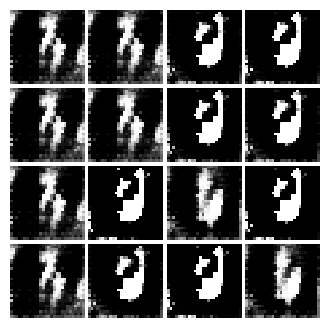

Epoch: 2, Iter: 1160, D: 0.7284, G:2.014


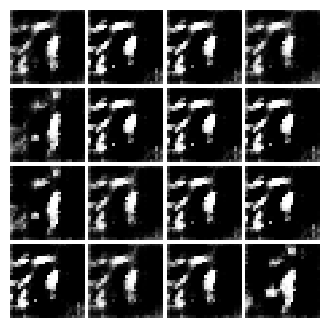

Epoch: 2, Iter: 1180, D: 1.159, G:2.011


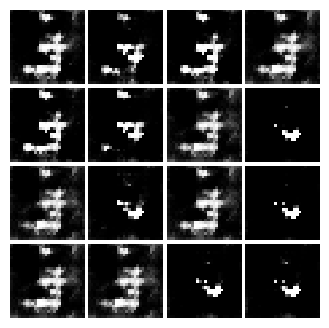

Epoch: 2, Iter: 1200, D: 0.9584, G:2.2


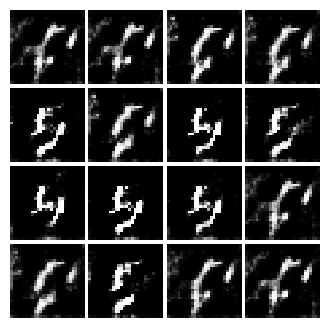

Epoch: 2, Iter: 1220, D: 1.377, G:1.637


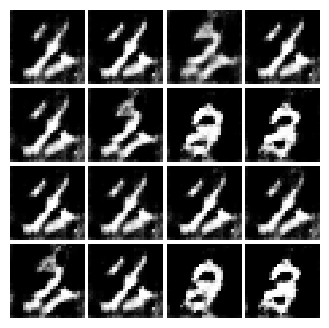

Epoch: 2, Iter: 1240, D: 0.9616, G:1.622


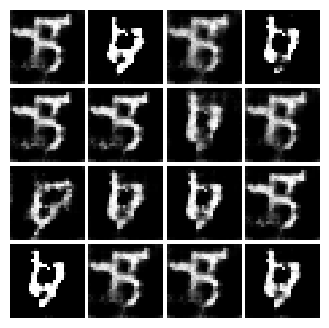

Epoch: 2, Iter: 1260, D: 0.9304, G:1.569


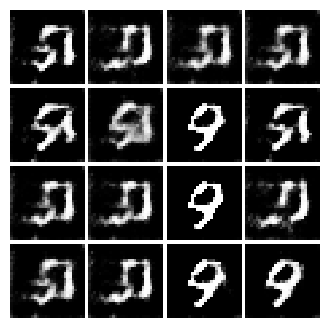

Epoch: 2, Iter: 1280, D: 0.6535, G:2.13


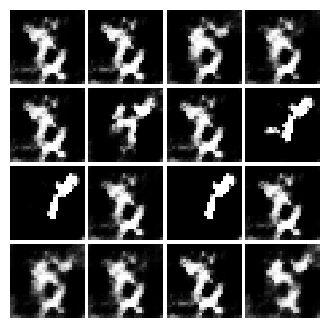

Epoch: 2, Iter: 1300, D: 0.4953, G:2.404


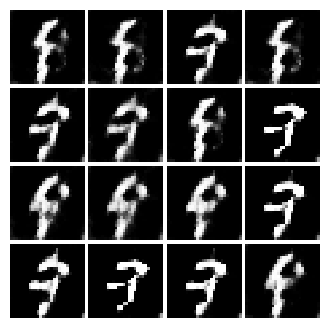

Epoch: 2, Iter: 1320, D: 0.6662, G:2.192


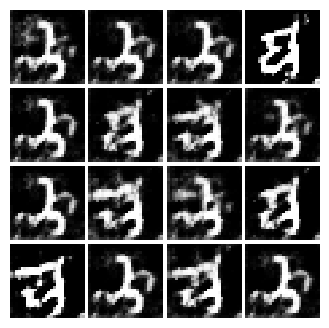

Epoch: 2, Iter: 1340, D: 1.844, G:4.939


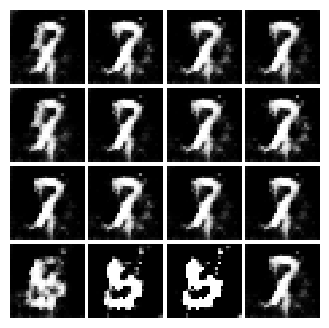

Epoch: 2, Iter: 1360, D: 0.7393, G:2.19


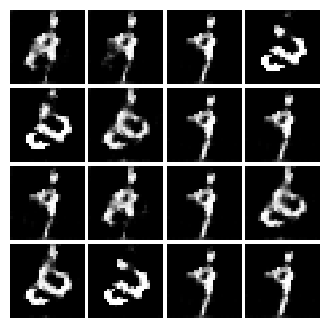

Epoch: 2, Iter: 1380, D: 0.7266, G:2.348


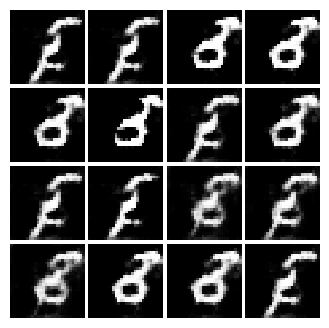

Epoch: 2, Iter: 1400, D: 0.53, G:3.172


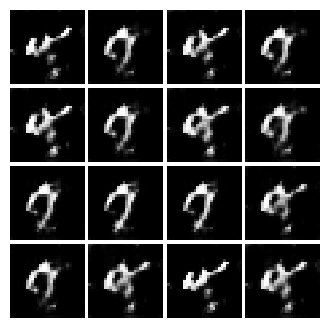

Epoch: 3, Iter: 1420, D: 0.7497, G:2.004


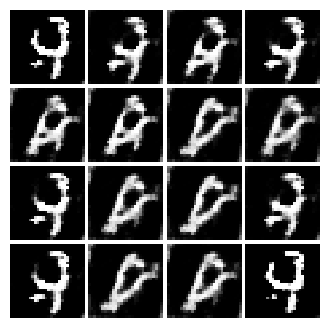

Epoch: 3, Iter: 1440, D: 0.888, G:2.055


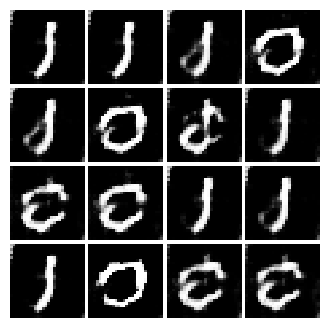

Epoch: 3, Iter: 1460, D: 0.8236, G:2.537


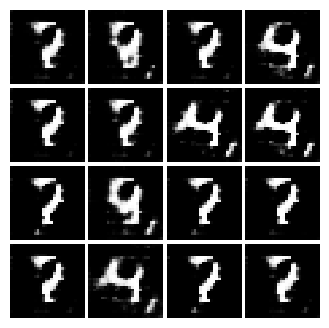

Epoch: 3, Iter: 1480, D: 0.9847, G:1.708


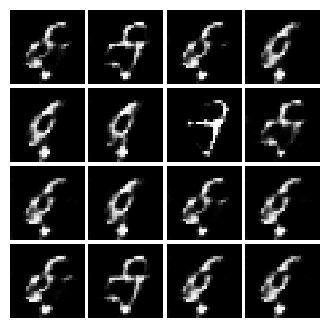

Epoch: 3, Iter: 1500, D: 1.341, G:1.535


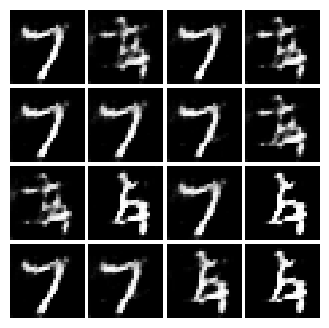

Epoch: 3, Iter: 1520, D: 0.4238, G:2.88


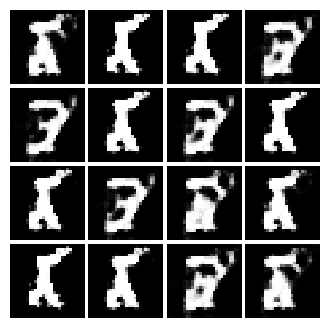

Epoch: 3, Iter: 1540, D: 0.9904, G:2.589


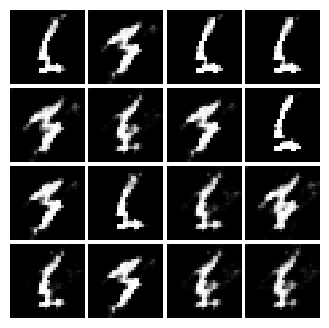

Epoch: 3, Iter: 1560, D: 1.044, G:5.767


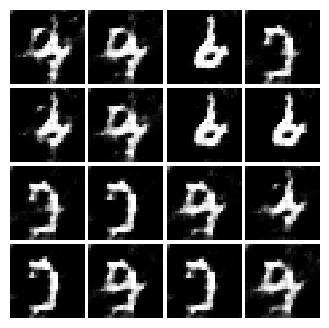

Epoch: 3, Iter: 1580, D: 0.6382, G:2.207


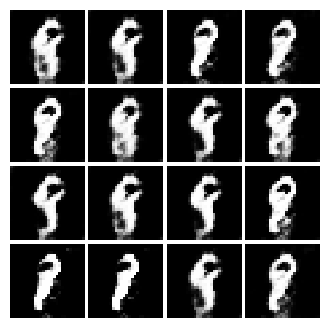

Epoch: 3, Iter: 1600, D: 0.5909, G:1.406


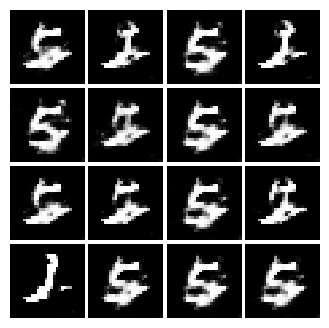

Epoch: 3, Iter: 1620, D: 0.5927, G:2.966


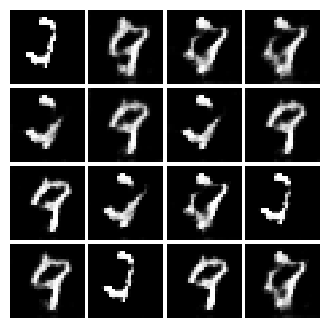

Epoch: 3, Iter: 1640, D: 0.3989, G:2.649


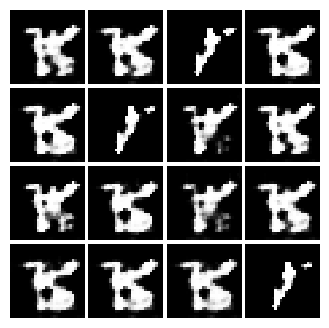

Epoch: 3, Iter: 1660, D: 1.334, G:2.222


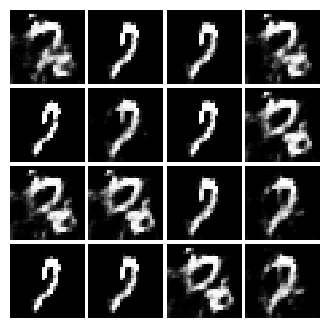

Epoch: 3, Iter: 1680, D: 0.5584, G:2.313


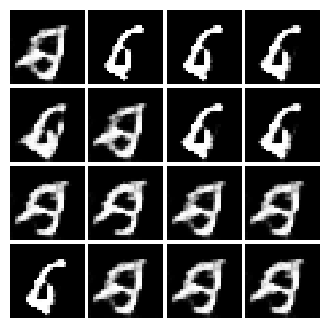

Epoch: 3, Iter: 1700, D: 0.5994, G:4.642


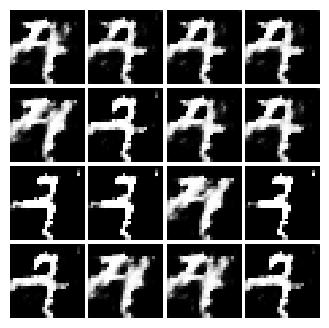

Epoch: 3, Iter: 1720, D: 0.435, G:2.353


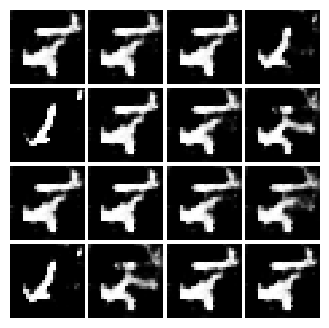

Epoch: 3, Iter: 1740, D: 1.061, G:3.497


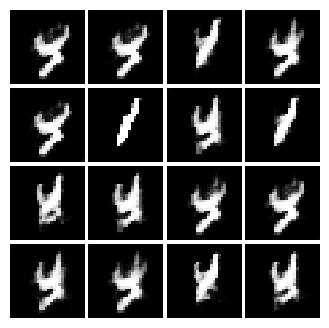

Epoch: 3, Iter: 1760, D: 0.8133, G:1.789


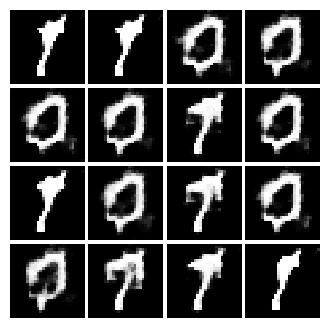

Epoch: 3, Iter: 1780, D: 0.5928, G:3.177


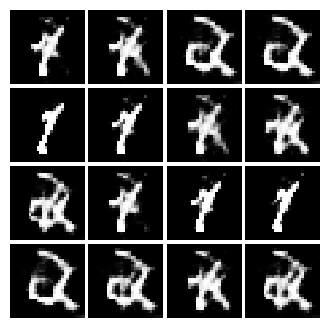

Epoch: 3, Iter: 1800, D: 0.4501, G:2.495


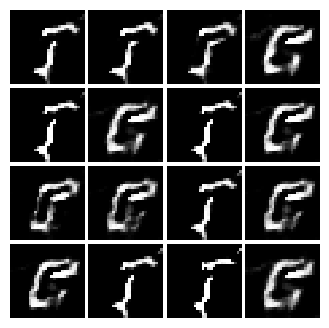

Epoch: 3, Iter: 1820, D: 0.4853, G:3.472


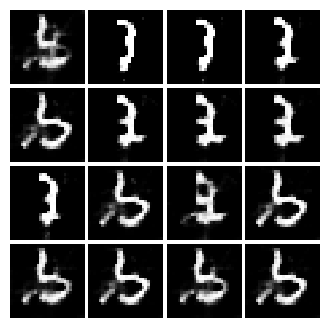

Epoch: 3, Iter: 1840, D: 0.3369, G:3.497


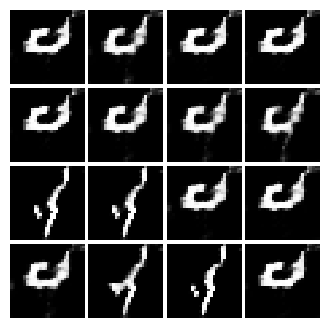

Epoch: 3, Iter: 1860, D: 1.261, G:2.22


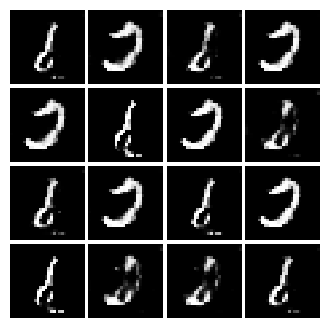

Epoch: 4, Iter: 1880, D: 0.2704, G:3.083


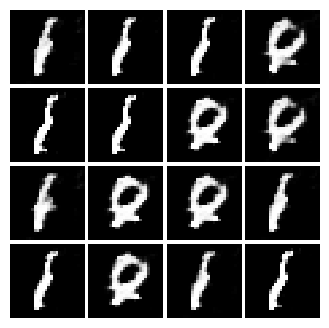

Epoch: 4, Iter: 1900, D: 0.7174, G:2.965


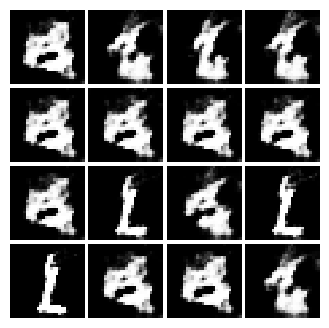

Epoch: 4, Iter: 1920, D: 1.173, G:2.026


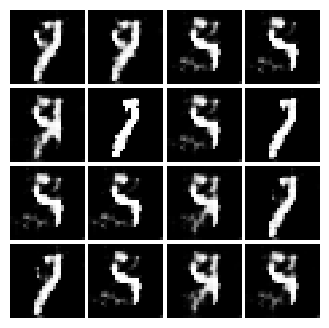

Epoch: 4, Iter: 1940, D: 0.4067, G:3.107


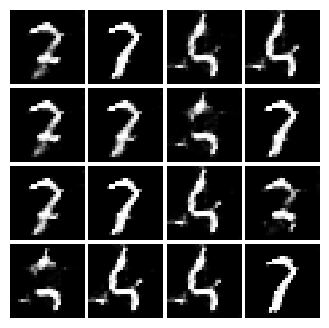

Epoch: 4, Iter: 1960, D: 0.3419, G:3.34


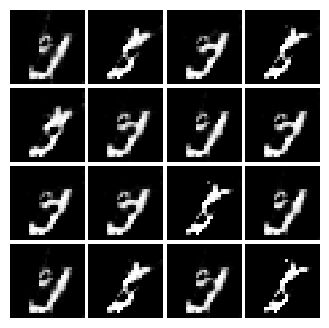

Epoch: 4, Iter: 1980, D: 0.4167, G:3.048


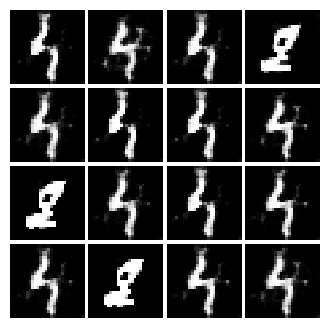

Epoch: 4, Iter: 2000, D: 0.88, G:4.023


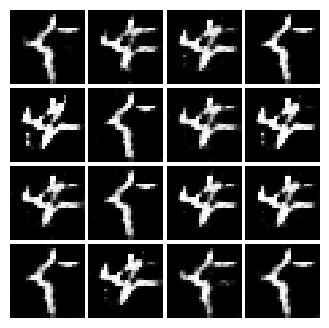

Epoch: 4, Iter: 2020, D: 0.4948, G:2.645


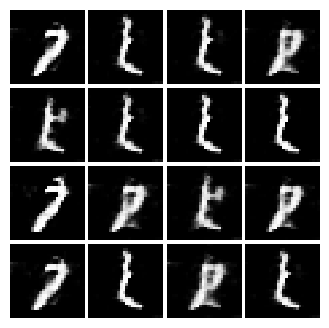

Epoch: 4, Iter: 2040, D: 0.6482, G:3.063


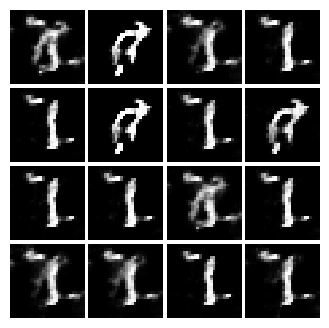

Epoch: 4, Iter: 2060, D: 0.8759, G:2.96


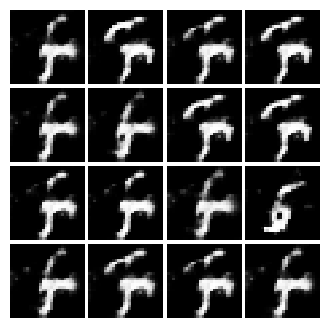

Epoch: 4, Iter: 2080, D: 1.522, G:7.325


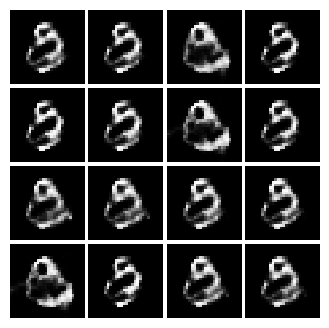

Epoch: 4, Iter: 2100, D: 0.4569, G:3.491


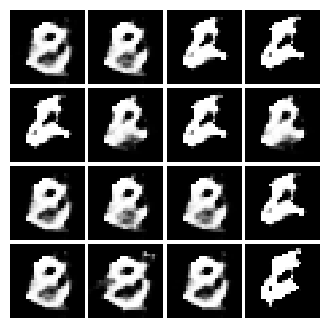

Epoch: 4, Iter: 2120, D: 0.4984, G:2.76


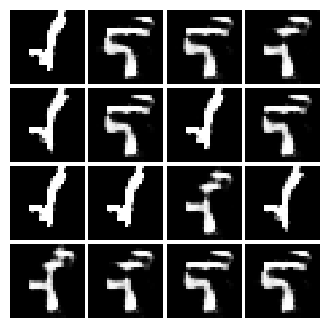

Epoch: 4, Iter: 2140, D: 0.2858, G:3.253


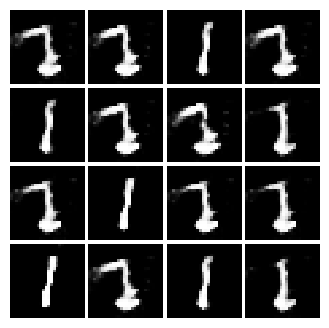

Epoch: 4, Iter: 2160, D: 0.6708, G:3.12


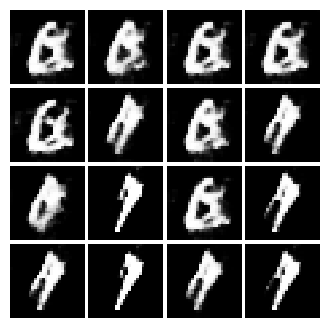

Epoch: 4, Iter: 2180, D: 0.3583, G:6.28


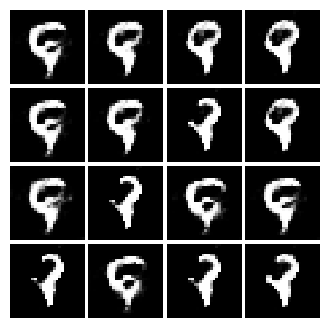

Epoch: 4, Iter: 2200, D: 0.6352, G:5.367


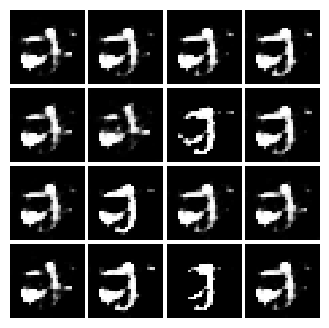

Epoch: 4, Iter: 2220, D: 0.4321, G:7.881


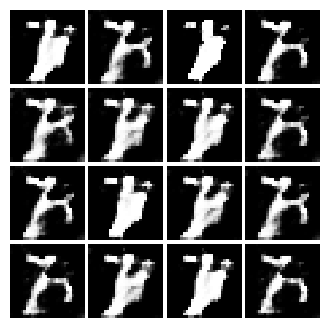

Epoch: 4, Iter: 2240, D: 0.5622, G:2.461


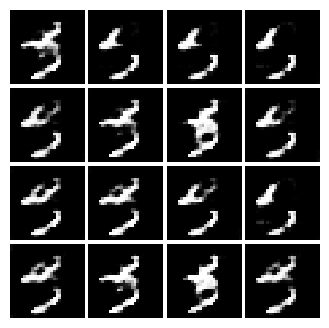

Epoch: 4, Iter: 2260, D: 0.3132, G:6.707


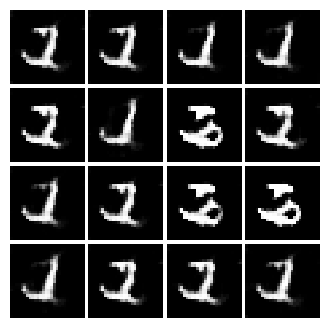

Epoch: 4, Iter: 2280, D: 0.4783, G:3.555


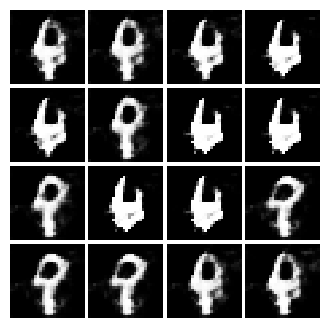

Epoch: 4, Iter: 2300, D: 0.413, G:3.336


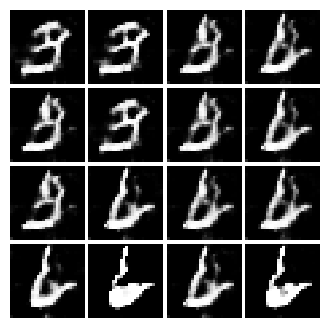

Epoch: 4, Iter: 2320, D: 0.5034, G:3.356


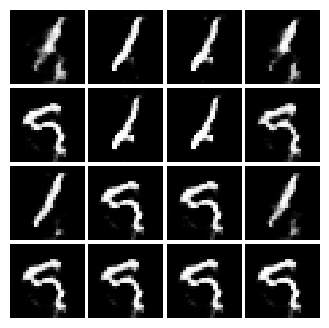

Epoch: 4, Iter: 2340, D: 0.6628, G:3.204


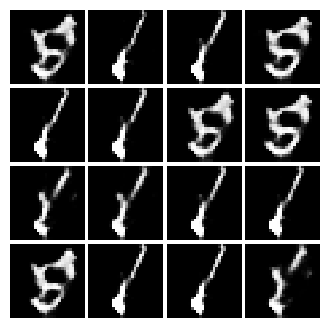

Final images


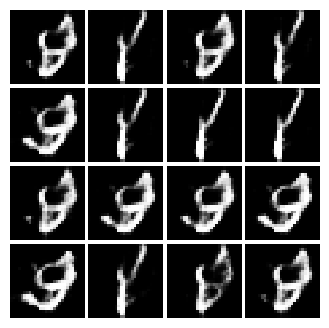

In [42]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_optimizer, G_optimizer = get_optimizers()

# Run it!
run_a_gan(D, G, D_optimizer, G_optimizer, discriminator_loss, generator_loss, num_epochs=5)

# OPTIONAL: Part III - Sequence-to-Sequence Generative Model

Research and experiment on architecture and training of a sequence-to-sequence autoencoders and generative model for task such as language translation. Below are example tutorials:

- https://keras.io/examples/nlp/lstm_seq2seq/
- https://keras.io/examples/nlp/neural_machine_translation_with_transformer/

In [43]:
import pathlib
import random
import string
import re
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.layers import TextVectorization

In [44]:
text_file = keras.utils.get_file(
    fname="spa-eng.zip",
    origin="http://storage.googleapis.com/download.tensorflow.org/data/spa-eng.zip",
    extract=True,
)
text_file = pathlib.Path(text_file).parent / "spa-eng" / "spa.txt"

In [45]:
with open(text_file) as f:
    lines = f.read().split("\n")[:-1]
text_pairs = []
for line in lines:
    eng, spa = line.split("\t")
    spa = "[start] " + spa + " [end]"
    text_pairs.append((eng, spa))

In [46]:
for _ in range(5):
    print(random.choice(text_pairs))

('Who broke the mug?', '[start] ¿Quién rompió la taza? [end]')
('He remained poor all his life.', '[start] Permaneció pobre toda su vida. [end]')
("I'd hate to be in your shoes.", '[start] Odiaría estar en tu lugar. [end]')
('I was wondering if you could do me a favor.', '[start] ¿Me preguntaba si podrías hacerme un favor? [end]')
('I tried to break the door open, which I found impossible.', '[start] Intenté abrir la puerta a golpes, pero fue imposible. [end]')


In [47]:
random.shuffle(text_pairs)
num_val_samples = int(0.15 * len(text_pairs))
num_train_samples = len(text_pairs) - 2 * num_val_samples
train_pairs = text_pairs[:num_train_samples]
val_pairs = text_pairs[num_train_samples : num_train_samples + num_val_samples]
test_pairs = text_pairs[num_train_samples + num_val_samples :]

print(f"{len(text_pairs)} total pairs")
print(f"{len(train_pairs)} training pairs")
print(f"{len(val_pairs)} validation pairs")
print(f"{len(test_pairs)} test pairs")

118964 total pairs
83276 training pairs
17844 validation pairs
17844 test pairs


In [48]:
strip_chars = string.punctuation + "¿"
strip_chars = strip_chars.replace("[", "")
strip_chars = strip_chars.replace("]", "")

vocab_size = 15000
sequence_length = 20
batch_size = 64


def custom_standardization(input_string):
    lowercase = tf.strings.lower(input_string)
    return tf.strings.regex_replace(lowercase, "[%s]" % re.escape(strip_chars), "")


eng_vectorization = TextVectorization(
    max_tokens=vocab_size,
    output_mode="int",
    output_sequence_length=sequence_length,
)
spa_vectorization = TextVectorization(
    max_tokens=vocab_size,
    output_mode="int",
    output_sequence_length=sequence_length + 1,
    standardize=custom_standardization,
)
train_eng_texts = [pair[0] for pair in train_pairs]
train_spa_texts = [pair[1] for pair in train_pairs]
eng_vectorization.adapt(train_eng_texts)
spa_vectorization.adapt(train_spa_texts)

In [49]:
def format_dataset(eng, spa):
    eng = eng_vectorization(eng)
    spa = spa_vectorization(spa)
    return (
        {
            "encoder_inputs": eng,
            "decoder_inputs": spa[:, :-1],
        },
        spa[:, 1:],
    )


def make_dataset(pairs):
    eng_texts, spa_texts = zip(*pairs)
    eng_texts = list(eng_texts)
    spa_texts = list(spa_texts)
    dataset = tf.data.Dataset.from_tensor_slices((eng_texts, spa_texts))
    dataset = dataset.batch(batch_size)
    dataset = dataset.map(format_dataset)
    return dataset.shuffle(2048).prefetch(16).cache()


train_ds = make_dataset(train_pairs)
val_ds = make_dataset(val_pairs)

In [50]:
for inputs, targets in train_ds.take(1):
    print(f'inputs["encoder_inputs"].shape: {inputs["encoder_inputs"].shape}')
    print(f'inputs["decoder_inputs"].shape: {inputs["decoder_inputs"].shape}')
    print(f"targets.shape: {targets.shape}")

inputs["encoder_inputs"].shape: (64, 20)
inputs["decoder_inputs"].shape: (64, 20)
targets.shape: (64, 20)


In [51]:
class TransformerEncoder(layers.Layer):
    def __init__(self, embed_dim, dense_dim, num_heads, **kwargs):
        super().__init__(**kwargs)
        self.embed_dim = embed_dim
        self.dense_dim = dense_dim
        self.num_heads = num_heads
        self.attention = layers.MultiHeadAttention(
            num_heads=num_heads, key_dim=embed_dim
        )
        self.dense_proj = keras.Sequential(
            [
                layers.Dense(dense_dim, activation="relu"),
                layers.Dense(embed_dim),
            ]
        )
        self.layernorm_1 = layers.LayerNormalization()
        self.layernorm_2 = layers.LayerNormalization()
        self.supports_masking = True

    def call(self, inputs, mask=None):
        attention_output = self.attention(query=inputs, value=inputs, key=inputs)
        proj_input = self.layernorm_1(inputs + attention_output)
        proj_output = self.dense_proj(proj_input)
        return self.layernorm_2(proj_input + proj_output)

    def get_config(self):
        config = super().get_config()
        config.update(
            {
                "embed_dim": self.embed_dim,
                "dense_dim": self.dense_dim,
                "num_heads": self.num_heads,
            }
        )
        return config


class PositionalEmbedding(layers.Layer):
    def __init__(self, sequence_length, vocab_size, embed_dim, **kwargs):
        super().__init__(**kwargs)
        self.token_embeddings = layers.Embedding(
            input_dim=vocab_size, output_dim=embed_dim
        )
        self.position_embeddings = layers.Embedding(
            input_dim=sequence_length, output_dim=embed_dim
        )
        self.sequence_length = sequence_length
        self.vocab_size = vocab_size
        self.embed_dim = embed_dim

    def call(self, inputs):
        length = tf.shape(inputs)[-1]
        positions = tf.range(start=0, limit=length, delta=1)
        embedded_tokens = self.token_embeddings(inputs)
        embedded_positions = self.position_embeddings(positions)
        return embedded_tokens + embedded_positions

    def compute_mask(self, inputs, mask=None):
        return tf.math.not_equal(inputs, 0)

    def get_config(self):
        config = super().get_config()
        config.update(
            {
                "sequence_length": self.sequence_length,
                "vocab_size": self.vocab_size,
                "embed_dim": self.embed_dim,
            }
        )
        return config


class TransformerDecoder(layers.Layer):
    def __init__(self, embed_dim, latent_dim, num_heads, **kwargs):
        super().__init__(**kwargs)
        self.embed_dim = embed_dim
        self.latent_dim = latent_dim
        self.num_heads = num_heads
        self.attention_1 = layers.MultiHeadAttention(
            num_heads=num_heads, key_dim=embed_dim
        )
        self.attention_2 = layers.MultiHeadAttention(
            num_heads=num_heads, key_dim=embed_dim
        )
        self.dense_proj = keras.Sequential(
            [
                layers.Dense(latent_dim, activation="relu"),
                layers.Dense(embed_dim),
            ]
        )
        self.layernorm_1 = layers.LayerNormalization()
        self.layernorm_2 = layers.LayerNormalization()
        self.layernorm_3 = layers.LayerNormalization()
        self.add = layers.Add()  # instead of `+` to preserve mask
        self.supports_masking = True

    def call(self, inputs, encoder_outputs, mask=None):
        attention_output_1 = self.attention_1(
            query=inputs, value=inputs, key=inputs, use_causal_mask=True
        )
        out_1 = self.layernorm_1(self.add([inputs, attention_output_1]))

        attention_output_2 = self.attention_2(
            query=out_1,
            value=encoder_outputs,
            key=encoder_outputs,
        )
        out_2 = self.layernorm_2(self.add([out_1, attention_output_2]))

        proj_output = self.dense_proj(out_2)
        return self.layernorm_3(self.add([out_2, proj_output]))

    def get_config(self):
        config = super().get_config()
        config.update(
            {
                "embed_dim": self.embed_dim,
                "latent_dim": self.latent_dim,
                "num_heads": self.num_heads,
            }
        )
        return config

In [52]:
embed_dim = 256
latent_dim = 2048
num_heads = 8

encoder_inputs = keras.Input(shape=(None,), dtype="int64", name="encoder_inputs")
x = PositionalEmbedding(sequence_length, vocab_size, embed_dim)(encoder_inputs)
encoder_outputs = TransformerEncoder(embed_dim, latent_dim, num_heads)(x)
encoder = keras.Model(encoder_inputs, encoder_outputs)

decoder_inputs = keras.Input(shape=(None,), dtype="int64", name="decoder_inputs")
encoded_seq_inputs = keras.Input(shape=(None, embed_dim), name="decoder_state_inputs")
x = PositionalEmbedding(sequence_length, vocab_size, embed_dim)(decoder_inputs)
x = TransformerDecoder(embed_dim, latent_dim, num_heads)(x, encoded_seq_inputs)
x = layers.Dropout(0.5)(x)
decoder_outputs = layers.Dense(vocab_size, activation="softmax")(x)
decoder = keras.Model([decoder_inputs, encoded_seq_inputs], decoder_outputs)

decoder_outputs = decoder([decoder_inputs, encoder_outputs])
transformer = keras.Model(
    [encoder_inputs, decoder_inputs], decoder_outputs, name="transformer"
)

In [53]:
epochs = 30  # This should be at least 30 for convergence

transformer.summary()
transformer.compile(
    "rmsprop", loss="sparse_categorical_crossentropy", metrics=["accuracy"]
)
transformer.fit(train_ds, epochs=epochs, validation_data=val_ds)

Model: "transformer"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 encoder_inputs (InputLayer  [(None, None)]               0         []                            
 )                                                                                                
                                                                                                  
 positional_embedding (Posi  (None, None, 256)            3845120   ['encoder_inputs[0][0]']      
 tionalEmbedding)                                                                                 
                                                                                                  
 decoder_inputs (InputLayer  [(None, None)]               0         []                            
 )                                                                                      

KeyboardInterrupt: ignored

In [ ]:
spa_vocab = spa_vectorization.get_vocabulary()
spa_index_lookup = dict(zip(range(len(spa_vocab)), spa_vocab))
max_decoded_sentence_length = 20


def decode_sequence(input_sentence):
    tokenized_input_sentence = eng_vectorization([input_sentence])
    decoded_sentence = "[start]"
    for i in range(max_decoded_sentence_length):
        tokenized_target_sentence = spa_vectorization([decoded_sentence])[:, :-1]
        predictions = transformer([tokenized_input_sentence, tokenized_target_sentence])

        sampled_token_index = np.argmax(predictions[0, i, :])
        sampled_token = spa_index_lookup[sampled_token_index]
        decoded_sentence += " " + sampled_token

        if sampled_token == "[end]":
            break
    return decoded_sentence


test_eng_texts = [pair[0] for pair in test_pairs]
for _ in range(30):
    input_sentence = random.choice(test_eng_texts)
    translated = decode_sequence(input_sentence)